In [20]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB/kykim/temp_rds/total_CRC_final_counts_active.h5ad')
print(adata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(99268, 27873)


In [810]:
adata.obs['Stage'].value_counts()

Stage
T3aN0       11670
T4aN2a      10885
T3bN1       10319
T3cN2a       9043
T2N0         7527
T3cN0        7510
T3cN1        6603
T4aN1a       6327
T3bN0        5496
T3cN1c       4581
T3N0         3607
T4bN0        3159
T3cN1b       2913
T3cN2        2331
T3dN0        2170
T4aN1b       2094
T4aN1        1351
T4bN1aM1     1137
T3N1          545
Name: count, dtype: int64

In [4]:
import pandas as pd

# adata.X를 DataFrame으로 변환
df = pd.DataFrame(adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X, 
                  index=adata.obs_names, 
                  columns=adata.var_names)

# 결과 확인
df

,MIR1302-2HG,AL627309.1,AL627309.3,AL669831.2,AL669831.5,FAM87B,LINC00115,FAM41C,AL645608.7,AL645608.3,...,AC011043.1,AL592183.1,AC007325.1,AC007325.4,AC007325.2,AL354822.1,AC004556.1,AC233755.2,AC233755.1,AC240274.1
AAACCTGAGGTGTGGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGCACGAAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGCAGATGGGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGCAGCTGCTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGCATCCCACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGATGGGTC-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAAGGCATGTG-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAAGTCGCCGT-31,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAAGTCTCGGC-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
adata.raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

In [6]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)
print(f"Normalization 후 크기: {adata.shape}")

Normalization 후 크기: (99268, 27873)


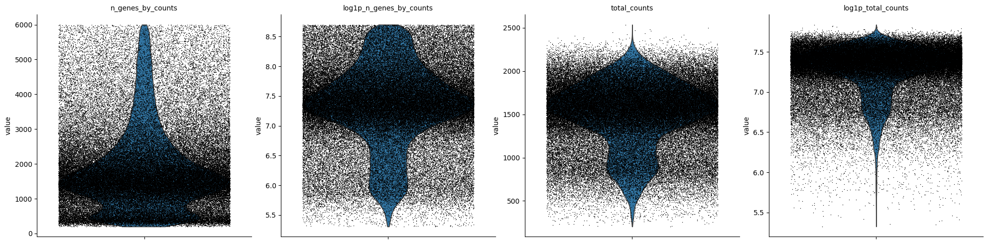

In [7]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts",'log1p_n_genes_by_counts', "total_counts",'log1p_total_counts'],
    jitter=0.4,
    multi_panel=True,
)

In [8]:
adata

AnnData object with n_obs × n_vars = 99268 × 27873
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patients', 'MSS', 'KRAS', 'KRAS.mutation', 'Location', 'Stage', 'snv_sum', 'souporcell', 'frequency', 'TP53.mutation', 'CD74positive', 'CEBPBpositive', 'High.expansion', 'subclustering_CD8T', 'MHCpositive', 'Stage_T', 'stage_N', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.2', 'seurat_clusters', 'annotation', 'annotation_detail', 'annotation_proportion', 'MSI_Mut', 'TP53_Mut', 'RAS_Mut', 'TMB', 'CS_ratio', 'APC_Mut', 'annot_pseudo', 'patients_num', 'Annotation_total', 'Annotation_total_Tsub', 'Annotation_total_lv4', 'Annotation_total_Trough', 'annotation_tmp', 'Celltype_Fig1', 'Annotation_Fig1', 'Annotation_Fig1A', 'Annotation_tmp_fr', 'Annotation_cell2loc_onlyEpiT', 'Annotation_cell2loc', 'Annotation_cell2loc_onlyEpicebpbhl_T', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pc

In [9]:
adata.obs['MSS'].value_counts()

MSS
MSS      79277
MSI-H    19991
Name: count, dtype: int64

In [10]:
adata.obs['TP53.mutation'].value_counts()

TP53.mutation
TP53 mutation    72705
TP53 WT          26563
Name: count, dtype: int64

In [11]:
adata.obs['KRAS.mutation'].value_counts()

KRAS.mutation
unknown                     71136
KRAS Q61K                   10885
KRAS G12V                    5546
KRAS G13D                    4956
KRAS G12D                    4292
KRAS c.38G>A(p.Gly13Asp)     2453
Name: count, dtype: int64

In [12]:
adata.obs['KRAS'].value_counts()

KRAS
KRAS WT          71136
KRAS mutation    28132
Name: count, dtype: int64

In [13]:
adata.obs['patients'].value_counts()

patients
H22    10885
H21     7164
H28     6327
H15     5174
H7      4812
H27     4581
H2      4506
H24     4146
H1      4130
H31     3684
H16     3607
H5      3605
H20     3448
H4      3159
H9      3155
H17     2913
H6      2506
H18     2453
H11     2331
H3      2212
H23     2170
H29     2094
H19     1902
H25     1631
H13     1416
H8      1351
H14     1350
H12     1137
H30      874
H26      545
Name: count, dtype: int64

In [14]:
import pandas as pd
from scipy.stats import pearsonr

# 필요한 유전자 데이터 추출 (데이터프레임으로 변환)
gene_data = pd.DataFrame(
    adata[:, ['CEBPB', 'CTLA4']].X.toarray() if hasattr(adata.X, 'toarray') else adata[:, ['CEBPB', 'CTLA4']].X,
    index=adata.obs_names,
    columns=['CEBPB', 'CTLA4']
)

# 환자 정보 추가
gene_data['patients'] = adata.obs['patients'].values

# 환자별 상관계수와 p-value 계산 (Zero-filter 적용)
def calculate_corr_pvalue(group):
    # Zero-filter: LCN2와 CTLA4 값이 모두 0이 아닌 경우만 사용
    filtered_group = group[(group['CEBPB'] != 0) & (group['CTLA4'] != 0)]
    if len(filtered_group) > 1:  # Pearson 상관계수 계산을 위해 최소 2개 이상의 데이터 필요
        corr, pval = pearsonr(filtered_group['CEBPB'], filtered_group['CTLA4'])
        return pd.Series({'correlation': corr, 'p_value': pval})
    else:
        return pd.Series({'correlation': None, 'p_value': None})  # 데이터 부족 시 NaN 반환

correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)

# p-value가 0.05 이하인 결과만 필터링
filtered_results = correlation_results[correlation_results['p_value'] <= 0.05].dropna()

# 결과 출력
print(filtered_results)


          correlation       p_value
patients                           
H2           0.459339  3.826555e-13
H3           0.465443  4.893787e-06
H4           0.717764  2.359244e-25
H5           0.383105  1.541285e-06
H6           0.427881  4.205798e-04
H7           0.458293  1.402217e-08
H9           0.678943  7.715110e-07
H13          0.888912  2.127115e-05
H15          0.307416  2.431842e-07
H16          0.251157  1.951453e-06
H18          0.159289  3.318579e-02
H21          0.202628  2.463629e-10
H22          0.518831  4.511279e-31
H24          0.077296  2.426067e-03
H25          0.313078  3.191421e-08
H26          0.528172  1.141479e-04
H28          0.084998  6.043553e-03
H29          0.255176  4.717211e-02
H31          0.130936  8.333071e-03


/tmp/ipykernel_353118/2723584849.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)
/tmp/ipykernel_353118/2723584849.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)


In [15]:
import pandas as pd
from scipy.stats import pearsonr

# 필요한 유전자 데이터 추출 (데이터프레임으로 변환)
gene_data = pd.DataFrame(
    adata[:, ['LCN2', 'CEBPB']].X.toarray() if hasattr(adata.X, 'toarray') else adata[:, ['LCN2', 'CEBPB']].X,
    index=adata.obs_names,
    columns=['LCN2', 'CEBPB']
)

# 환자 정보 추가
gene_data['patients'] = adata.obs['patients'].values

# 환자별 상관계수와 p-value 계산 (Zero-filter 적용)
def calculate_corr_pvalue(group):
    # Zero-filter: LCN2와 CTLA4 값이 모두 0이 아닌 경우만 사용
    filtered_group = group[(group['LCN2'] != 0) & (group['CEBPB'] != 0)]
    if len(filtered_group) > 1:  # Pearson 상관계수 계산을 위해 최소 2개 이상의 데이터 필요
        corr, pval = pearsonr(filtered_group['LCN2'], filtered_group['CEBPB'])
        return pd.Series({'correlation': corr, 'p_value': pval})
    else:
        return pd.Series({'correlation': None, 'p_value': None})  # 데이터 부족 시 NaN 반환

correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)

# p-value가 0.05 이하인 결과만 필터링
filtered_results = correlation_results[correlation_results['p_value'] >= 0.00].dropna()

# 결과 출력
print(filtered_results)
# H14,H20,H22,H30 neg

/tmp/ipykernel_353118/3159234436.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)


          correlation       p_value
patients                           
H1           0.345816  2.926285e-03
H2           0.377289  2.266501e-01
H3           0.244506  2.495401e-01
H4           0.195757  1.123804e-01
H5           0.129569  1.588398e-02
H6           0.149965  4.206891e-01
H7           0.269983  4.506114e-01
H8           0.216563  2.338431e-01
H9           0.010210  8.592793e-01
H11          0.373853  1.604782e-02
H12          0.287587  1.828520e-02
H13         -0.059348  4.531398e-01
H14         -0.189613  1.351631e-03
H15          0.080312  3.066482e-01
H16          0.201641  1.947462e-07
H17          0.348456  2.562588e-12
H18          0.353794  2.724770e-09
H19          0.146103  2.844351e-02
H20         -0.252899  4.628195e-06
H21          0.226622  7.139450e-01
H22         -0.065562  9.052499e-03
H23          0.688662  4.800825e-06
H24          0.054608  4.678226e-01
H25         -0.046619  5.377846e-01
H27          0.611616  4.886568e-08
H28          0.840672  1.593

/tmp/ipykernel_353118/3159234436.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)


In [16]:
adata.obs['annotation'].value_counts()

annotation
T/NK             44841
Epithelial       19816
Myeloid          11489
CD19B             6621
plasmaB           6022
Cycling cells     4744
Fibroblasts       2694
Endothelial       1714
Mast              1327
Name: count, dtype: int64

In [17]:
fibr = adata[adata.obs['annotation'] == 'Fibroblasts']

In [110]:
TNK = adata[adata.obs['annotation'] == 'T/NK']

In [111]:
import anndata

# TNK AnnData 객체를 저장할 경로
save_path = "/home/Data_Drive_8TB_3/kykim/colon/TNK.h5ad"

# TNK AnnData 객체 저장
TNK.write(save_path)

print(f"TNK AnnData 객체가 {save_path}에 저장되었습니다.")


TNK AnnData 객체가 /home/Data_Drive_8TB_3/kykim/colon/TNK.h5ad에 저장되었습니다.


In [18]:
fibr.obs['MSS'].value_counts()

MSS
MSS      2445
MSI-H     249
Name: count, dtype: int64

In [19]:
fibr.obs['TP53.mutation'].value_counts()

TP53.mutation
TP53 mutation    2044
TP53 WT           650
Name: count, dtype: int64

In [20]:
fibr.obs['patients'].value_counts()

patients
H21    643
H27    210
H28    176
H11    135
H9     134
H22    117
H31    112
H8     112
H1      94
H7      93
H16     90
H29     84
H24     82
H18     81
H17     71
H4      62
H5      50
H2      47
H20     45
H19     41
H3      40
H15     27
H25     26
H14     24
H13     24
H12     23
H23     15
H30     15
H6      14
H26      7
Name: count, dtype: int64

/tmp/ipykernel_353118/1292335014.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(['patients', 'annotation']).size()  # 그룹별 개수 계산


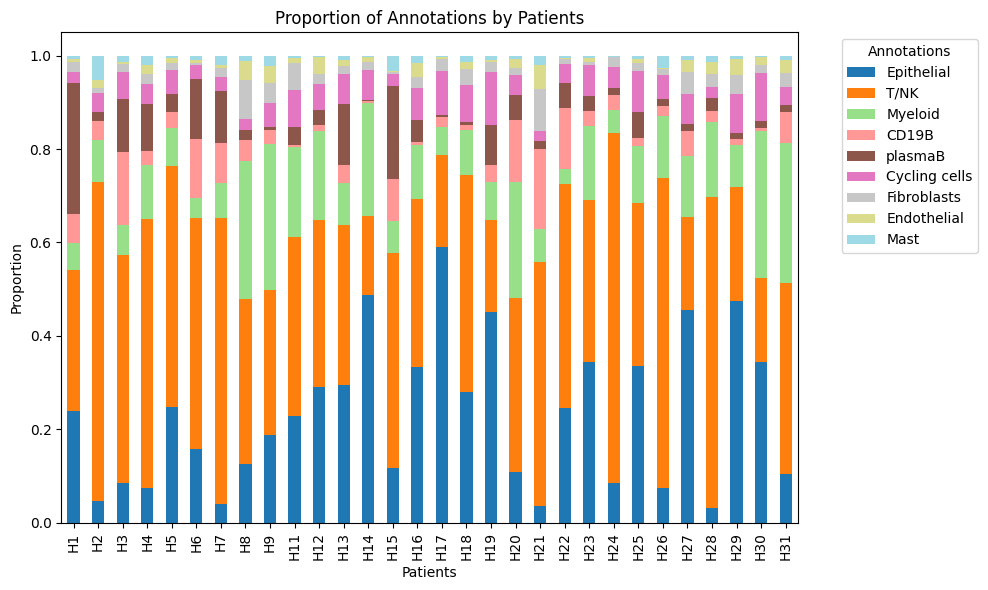

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# annotation과 patients별로 그룹화하여 비율 계산
proportions = (
    adata.obs.groupby(['patients', 'annotation']).size()  # 그룹별 개수 계산
    .unstack(fill_value=0)  # 각 annotation을 열로 확장
    .div(adata.obs['patients'].value_counts(), axis=0)  # 환자별로 비율 계산
)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.title('Proportion of Annotations by Patients')
plt.xlabel('Patients')
plt.ylabel('Proportion')
plt.legend(title='Annotations', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [22]:
import pandas as pd

# Fibroblast 비율 계산
fibroblast_percentages = (
    adata.obs.groupby(['patients', 'annotation']).size()  # 그룹별 개수 계산
    .unstack(fill_value=0)  # annotation을 열로 확장
    .div(adata.obs['patients'].value_counts(), axis=0)  # 환자별 총 개수로 나눔
)

# Fibroblast 퍼센티지 추출
fibroblast_percentages['Fibroblasts'] = fibroblast_percentages.get('Fibroblasts', 0)  # 'Fibroblast' 열이 없으면 0으로 설정

# 환자별 Fibroblast 비율을 오름차순으로 정렬
fibroblast_percentages_sorted = fibroblast_percentages[['Fibroblasts']].sort_values('Fibroblasts', ascending = False)

# 결과 출력
print(fibroblast_percentages_sorted)


annotation  Fibroblasts
patients               
H21            0.089754
H8             0.082902
H11            0.057915
H27            0.045842
H9             0.042472
H29            0.040115
H18            0.033021
H31            0.030402
H28            0.027817
H16            0.024951
H17            0.024373
H1             0.022760
H19            0.021556
H12            0.020229
H24            0.019778
H4             0.019626
H7             0.019327
H3             0.018083
H14            0.017778
H30            0.017162
H13            0.016949
H25            0.015941
H5             0.013870
H20            0.013051
H26            0.012844
H22            0.010749
H2             0.010431
H23            0.006912
H6             0.005587
H15            0.005218


/tmp/ipykernel_353118/2044846682.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(['patients', 'annotation']).size()  # 그룹별 개수 계산


/tmp/ipykernel_353118/72396532.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tnk_cells.obs['CTLA4_score'] = gene_expression_df.mean(axis=1)
/tmp/ipykernel_353118/72396532.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ctla4_stats = tnk_cells.obs.groupby('patients')['CTLA4_score'].agg(['count', 'min', 'max', 'median', 'mean'])
/tmp/ipykernel_353118/72396532.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='patients', y='CTLA4_score', data=tnk_cells.obs, palette='Set2')


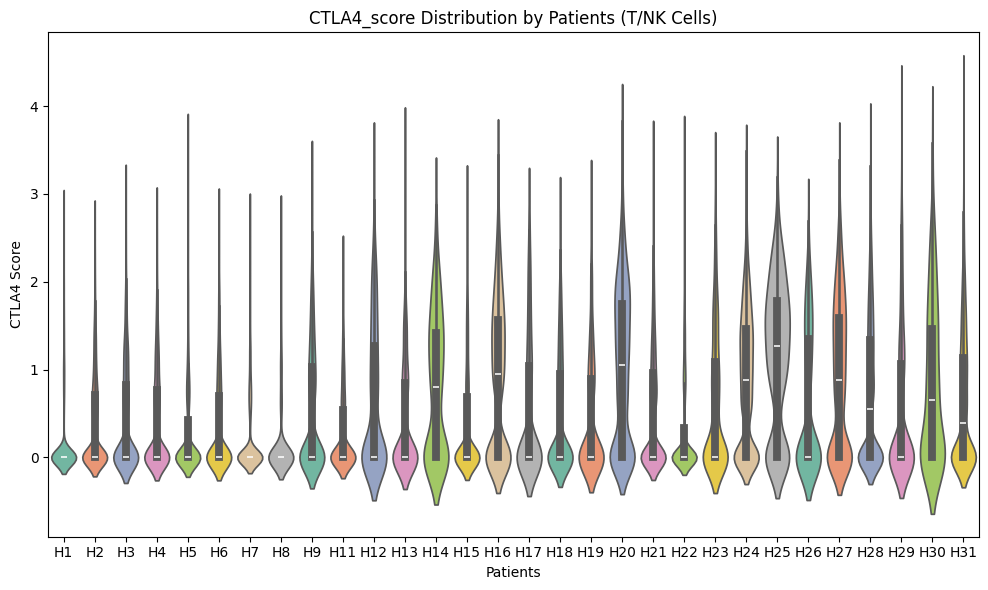

          count  min       max    median      mean
patients                                          
H25         571  0.0  3.190050  1.273614  1.157009
H20        1281  0.0  3.833965  1.056662  1.027562
H16        1303  0.0  3.445503  0.946975  0.915958
H27         912  0.0  3.389314  0.886219  0.908378
H24        3101  0.0  3.484413  0.885307  0.884200
H30         158  0.0  3.584360  0.657734  0.823381
H14         228  0.0  2.879198  0.805897  0.809320
H28        4216  0.0  3.727403  0.548121  0.709570
H12         407  0.0  3.326943  0.000000  0.660790
H26         362  0.0  2.686956  0.000000  0.627353
H31        1505  0.0  4.239193  0.392807  0.616251
H23         755  0.0  3.298667  0.000000  0.614862
H9          981  0.0  3.252120  0.000000  0.537908
H21        3748  0.0  3.576791  0.000000  0.527942
H17         572  0.0  2.857263  0.000000  0.525139
H29         508  0.0  4.002734  0.000000  0.514751
H18        1141  0.0  2.856747  0.000000  0.473528
H19         376  0.0  2.990632 

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# 분석할 유전자 목록
genes = ['CTLA4']

# T/NK 셀만 필터링
tnk_cells = adata[adata.obs['annotation'] == 'T/NK']

# 유전자 발현 값 추출
gene_expression = tnk_cells[:, genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
                                  index=tnk_cells.obs_names, columns=genes)

# 모듈 점수 계산 (유전자 발현 값들의 평균)
tnk_cells.obs['CTLA4_score'] = gene_expression_df.mean(axis=1)

# 환자별 CTLA4_score 통계 계산
ctla4_stats = tnk_cells.obs.groupby('patients')['CTLA4_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# violin plot 시각화
plt.figure(figsize=(10, 6))
sns.violinplot(x='patients', y='CTLA4_score', data=tnk_cells.obs, palette='Set2')

# 그래프 꾸미기
plt.title('CTLA4_score Distribution by Patients (T/NK Cells)')
plt.xlabel('Patients')
plt.ylabel('CTLA4 Score')
plt.tight_layout()
plt.show()

# 결과 출력 (환자별 통계)
ctla4_stats_sorted = ctla4_stats.sort_values(by='mean', ascending=False)

# 정렬된 결과 출력
print(ctla4_stats_sorted)


/tmp/ipykernel_353118/1486262975.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  epithelial_cells.obs['LCN2_score'] = gene_expression_df.mean(axis=1)
/tmp/ipykernel_353118/1486262975.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  lcn2_stats = epithelial_cells.obs.groupby('patients')['LCN2_score'].agg(['count', 'min', 'max', 'median', 'mean'])
/tmp/ipykernel_353118/1486262975.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='patients', y='LCN2_score', data=epithelial_cells.obs, palette='Set2')


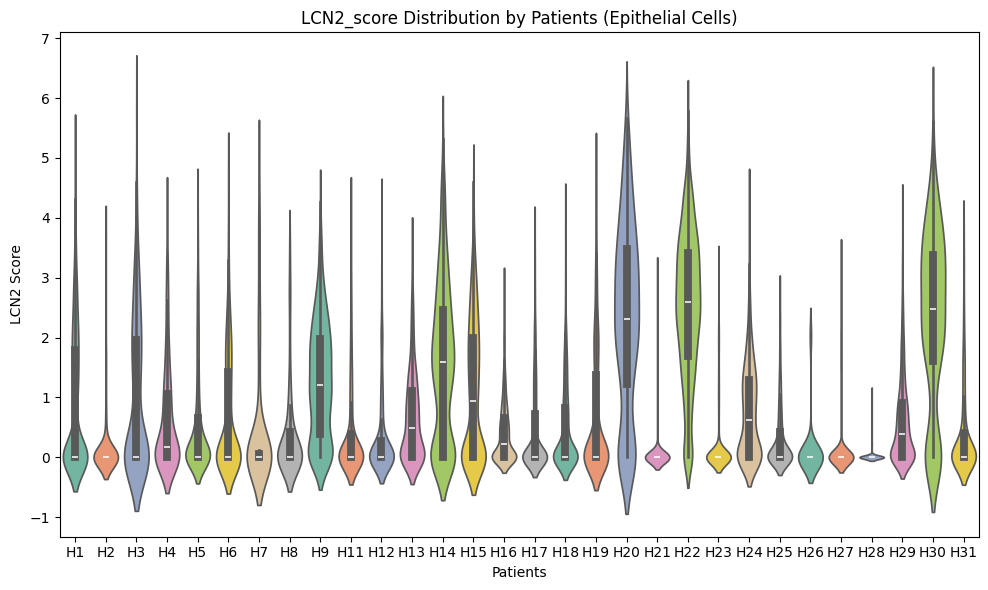

          count  min       max    median      mean
patients                                          
H22        2679  0.0  5.789306  2.588122  2.508392
H20         374  0.0  5.668156  2.303575  2.330316
H30         300  0.0  5.608125  2.476982  2.307992
H14         659  0.0  5.317946  1.596493  1.599501
H9          592  0.0  4.261359  1.202609  1.269803
H15         601  0.0  4.596955  0.939709  1.101386
H3          186  0.0  5.819569  0.000000  1.029158
H1          985  0.0  5.155979  0.000000  0.905713
H24         356  0.0  4.332809  0.626375  0.773744
H19         858  0.0  4.868956  0.000000  0.720262
H6          394  0.0  4.817204  0.000000  0.711363
H13         417  0.0  3.559211  0.487582  0.677239
H4          234  0.0  4.079481  0.163117  0.649640
H29         996  0.0  4.204072  0.385805  0.601005
H7          195  0.0  4.840304  0.000000  0.532138
H5          892  0.0  4.382129  0.000000  0.517012
H18         684  0.0  4.193857  0.000000  0.475932
H17        1722  0.0  3.854394 

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# 분석할 유전자 목록
genes = ['LCN2']

# Epithelial 셀만 필터링
epithelial_cells = adata[adata.obs['annotation'] == 'Epithelial']

# 유전자 발현 값 추출
gene_expression = epithelial_cells[:, genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
                                  index=epithelial_cells.obs_names, columns=genes)

# 모듈 점수 계산 (유전자 발현 값들의 평균)
epithelial_cells.obs['LCN2_score'] = gene_expression_df.mean(axis=1)

# 환자별 LCN2_score 통계 계산
lcn2_stats = epithelial_cells.obs.groupby('patients')['LCN2_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# violin plot 시각화
plt.figure(figsize=(10, 6))
sns.violinplot(x='patients', y='LCN2_score', data=epithelial_cells.obs, palette='Set2')

# 그래프 꾸미기
plt.title('LCN2_score Distribution by Patients (Epithelial Cells)')
plt.xlabel('Patients')
plt.ylabel('LCN2 Score')
plt.tight_layout()
plt.show()

# 결과 출력 (환자별 통계)
lcn2_stats_sorted = lcn2_stats.sort_values(by='mean', ascending=False)

# 정렬된 결과 출력
print(lcn2_stats_sorted)


/tmp/ipykernel_353118/970978276.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  fibroblasts_cells.obs['module_score'] = gene_expression_df.mean(axis=1)
/tmp/ipykernel_353118/970978276.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  module_score_stats = fibroblasts_cells.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])
/tmp/ipykernel_353118/970978276.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='patients', y='module_score', data=fibroblasts_cells.obs, palette='Set3')


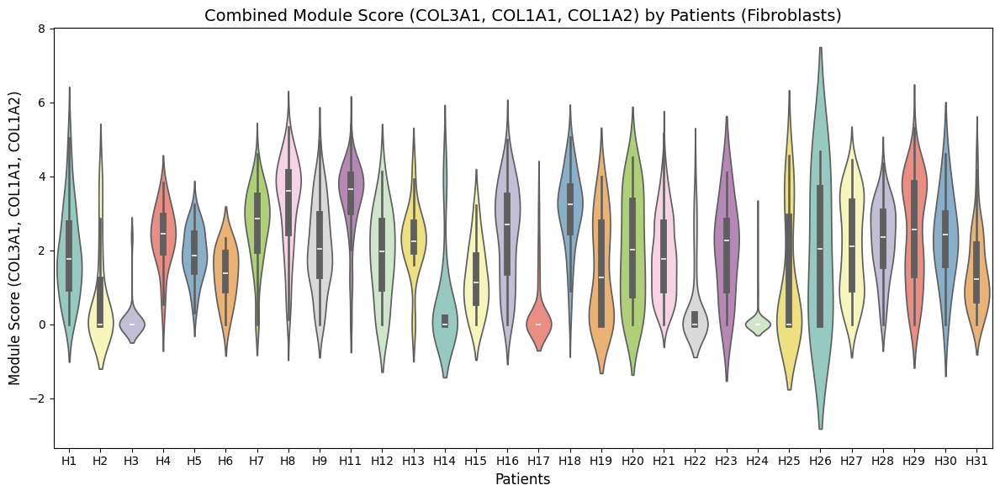

          count       min       max    median      mean
patients                                               
H11         135  0.000000  5.403861  3.660277  3.396493
H8          112  0.000000  5.338591  3.606424  3.213871
H18          81  0.000000  5.054329  3.242987  3.074634
H7           93  0.000000  4.606797  2.862895  2.666295
H29          84  0.000000  5.307653  2.567803  2.482560
H16          90  0.000000  4.994087  2.687684  2.412257
H4           62  0.000000  3.845590  2.440725  2.361759
H30          15  0.000000  4.603252  2.433266  2.306607
H13          24  0.000000  4.305038  2.254763  2.265197
H28         176  0.000000  4.348001  2.353445  2.256736
H27         210  0.000000  4.449522  2.115965  2.111552
H9          134  0.000000  4.971130  2.043282  2.100217
H26           7  0.000000  4.667992  2.033970  2.008739
H23          15  0.000000  4.097329  2.257546  2.003549
H20          45  0.000000  4.512741  2.011770  1.988300
H1           94  0.000000  5.403886  1.764543  1

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# 분석할 유전자 목록
genes = ['COL3A1', 'COL1A1', 'COL1A2']

# Fibroblasts 셀만 필터링
fibroblasts_cells = adata[adata.obs['annotation'] == 'Fibroblasts']

# 유전자 발현 값 추출
gene_expression = fibroblasts_cells[:, genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(
    gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
    index=fibroblasts_cells.obs_names, columns=genes
)

# 통합 점수 계산 (세 유전자의 발현 값의 평균)
fibroblasts_cells.obs['module_score'] = gene_expression_df.mean(axis=1)

# 환자별 module_score 통계 계산
module_score_stats = fibroblasts_cells.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# violin plot 시각화
plt.figure(figsize=(12, 6))
sns.violinplot(x='patients', y='module_score', data=fibroblasts_cells.obs, palette='Set3')

# 그래프 꾸미기
plt.title('Combined Module Score (COL3A1, COL1A1, COL1A2) by Patients (Fibroblasts)', fontsize=14)
plt.xlabel('Patients', fontsize=12)
plt.ylabel('Module Score (COL3A1, COL1A1, COL1A2)', fontsize=12)
plt.tight_layout()
plt.show()

# 결과 출력 (환자별 통계)
module_score_stats_sorted = module_score_stats.sort_values(by='mean', ascending=False)

# 정렬된 결과 출력
print(module_score_stats_sorted)


In [26]:
import pandas as pd

# 분석할 유전자 목록
genes = ['COL3A1', 'COL1A1', 'COL1A2']

# Fibroblasts 셀만 필터링
fibroblasts_cells = adata[adata.obs['annotation'] == 'Fibroblasts']

# 유전자 발현 값 추출
gene_expression = fibroblasts_cells[:, genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(
    gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
    index=fibroblasts_cells.obs_names, columns=genes
)

# 통합 점수 계산 (세 유전자의 발현 값의 평균)
fibroblasts_cells.obs['module_score'] = gene_expression_df.mean(axis=1)

# 환자별 module_score 통계 계산
module_score_stats = fibroblasts_cells.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# 0.75 분위수 계산
quantile_75 = module_score_stats['mean'].quantile(0.50)

# 0.75 분위수 이상인 환자 필터링
high_mean_patients = module_score_stats[module_score_stats['mean'] >= quantile_75]

# 0.75 분위수와 결과 출력
print(f"Quantile 0.75 (mean 기준): {quantile_75}")
print("Mean 값이 Quantile 0.75 이상인 환자:")
print(high_mean_patients)


/tmp/ipykernel_353118/1047741964.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  fibroblasts_cells.obs['module_score'] = gene_expression_df.mean(axis=1)


Quantile 0.75 (mean 기준): 1.9586789559832298
Mean 값이 Quantile 0.75 이상인 환자:
          count  min       max    median      mean
patients                                          
H4           62  0.0  3.845590  2.440725  2.361759
H7           93  0.0  4.606797  2.862895  2.666295
H8          112  0.0  5.338591  3.606424  3.213871
H9          134  0.0  4.971130  2.043282  2.100217
H11         135  0.0  5.403861  3.660277  3.396493
H13          24  0.0  4.305038  2.254763  2.265197
H16          90  0.0  4.994087  2.687684  2.412257
H18          81  0.0  5.054329  3.242987  3.074634
H20          45  0.0  4.512741  2.011770  1.988300
H23          15  0.0  4.097329  2.257546  2.003549
H26           7  0.0  4.667992  2.033970  2.008739
H27         210  0.0  4.449522  2.115965  2.111552
H28         176  0.0  4.348001  2.353445  2.256736
H29          84  0.0  5.307653  2.567803  2.482560
H30          15  0.0  4.603252  2.433266  2.306607


/tmp/ipykernel_353118/1047741964.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  module_score_stats = fibroblasts_cells.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])


/tmp/ipykernel_353118/2411942369.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tnk_cells.obs['CTLA4_score'] = ctla4_expression_df.mean(axis=1)
/tmp/ipykernel_353118/2411942369.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ctla4_stats = tnk_cells.obs.groupby('patients')['CTLA4_score'].mean()
/tmp/ipykernel_353118/2411942369.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  epithelial_cells.obs['LCN2_score'] = lcn2_expression_df.mean(axis=1)
/tmp/ipykernel_353118/2411942369.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt th

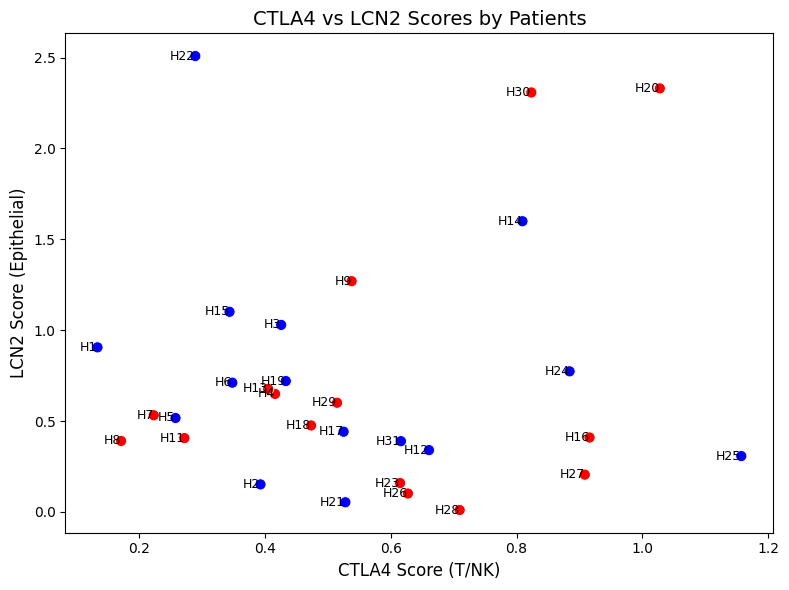

Correlation (Red Group): 0.38
Correlation (Blue Group): -0.23


In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# 빨간색으로 표시할 환자 목록
highlighted_patients = {'H4','H7','H8','H9','H11','H13','H16','H18','H20','H23','H26','H27','H28','H29','H30'}

# 1. T/NK에서 CTLA4 점수 계산
tnk_cells = adata[adata.obs['annotation'] == 'T/NK']
ctla4_expression = tnk_cells[:, ['CTLA4']].X
ctla4_expression_df = pd.DataFrame(
    ctla4_expression.toarray() if hasattr(ctla4_expression, 'toarray') else ctla4_expression,
    index=tnk_cells.obs_names, columns=['CTLA4']
)
tnk_cells.obs['CTLA4_score'] = ctla4_expression_df.mean(axis=1)
ctla4_stats = tnk_cells.obs.groupby('patients')['CTLA4_score'].mean()

# 2. Epithelial에서 LCN2 점수 계산
epithelial_cells = adata[adata.obs['annotation'] == 'Epithelial']
lcn2_expression = epithelial_cells[:, ['LCN2']].X
lcn2_expression_df = pd.DataFrame(
    lcn2_expression.toarray() if hasattr(lcn2_expression, 'toarray') else lcn2_expression,
    index=epithelial_cells.obs_names, columns=['LCN2']
)
epithelial_cells.obs['LCN2_score'] = lcn2_expression_df.mean(axis=1)
lcn2_stats = epithelial_cells.obs.groupby('patients')['LCN2_score'].mean()

# 3. 점수 데이터 병합
combined_scores = pd.DataFrame({
    'CTLA4_score': ctla4_stats,
    'LCN2_score': lcn2_stats
}).dropna()  # NaN 값 제거

# 빨간색/파란색 컬러 지정
combined_scores['group'] = combined_scores.index.map(
    lambda x: 'red' if x in highlighted_patients else 'blue'
)

# 빨간색 그룹과 파란색 그룹 데이터 분리
red_scores = combined_scores[combined_scores['group'] == 'red']
blue_scores = combined_scores[combined_scores['group'] == 'blue']

# 상관계수 계산
red_corr = red_scores['CTLA4_score'].corr(red_scores['LCN2_score'])
blue_corr = blue_scores['CTLA4_score'].corr(blue_scores['LCN2_score'])

# 4. 시각화 (scatter plot)
plt.figure(figsize=(8, 6))
sns.scatterplot(data=combined_scores, x='CTLA4_score', y='LCN2_score', hue='group', palette=['blue', 'red'], legend=False, s=65)

# 각 점에 환자 레이블 추가 (검정색 글씨로 통일)
for patient, (x, y, _) in combined_scores.iterrows():
    plt.text(x, y, patient, fontsize=9, ha='right', va='center', color='black')

# 그래프 꾸미기
plt.title('CTLA4 vs LCN2 Scores by Patients', fontsize=14)
plt.xlabel('CTLA4 Score (T/NK)', fontsize=12)
plt.ylabel('LCN2 Score (Epithelial)', fontsize=12)
plt.tight_layout()
plt.show()

# 결과 출력
print(f"Correlation (Red Group): {red_corr:.2f}")
print(f"Correlation (Blue Group): {blue_corr:.2f}")


In [28]:
import pandas as pd
from scipy.stats import pearsonr

# 필요한 유전자 데이터 추출 (데이터프레임으로 변환)
gene_data = pd.DataFrame(
    adata[:, ['CEBPB', 'LCN2']].X.toarray() if hasattr(adata.X, 'toarray') else adata[:, ['CEBPB', 'LCN2']].X,
    index=adata.obs_names,
    columns=['CEBPB', 'LCN2']
)

# 환자 정보 추가
gene_data['patients'] = adata.obs['patients'].values

# 환자별 상관계수와 p-value 계산 (Zero-filter 적용)
def calculate_corr_pvalue(group):
    # Zero-filter: CEBPB와 LCN2 값이 모두 0이 아닌 경우만 사용
    filtered_group = group[(group['CEBPB'] != 0) & (group['LCN2'] != 0)]
    if len(filtered_group) > 1:  # Pearson 상관계수 계산을 위해 최소 2개 이상의 데이터 필요
        corr, pval = pearsonr(filtered_group['CEBPB'], filtered_group['LCN2'])
        return pd.Series({'correlation': corr, 'p_value': pval})
    else:
        return pd.Series({'correlation': None, 'p_value': None})  # 데이터 부족 시 NaN 반환

# 모든 데이터를 대상으로 상관계수 계산
correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)

# 결과 출력
print(correlation_results)


          correlation       p_value
patients                           
H1           0.345816  2.926285e-03
H2           0.377289  2.266501e-01
H3           0.244506  2.495401e-01
H4           0.195757  1.123804e-01
H5           0.129569  1.588398e-02
H6           0.149965  4.206891e-01
H7           0.269983  4.506114e-01
H8           0.216563  2.338431e-01
H9           0.010210  8.592793e-01
H11          0.373853  1.604782e-02
H12          0.287587  1.828520e-02
H13         -0.059348  4.531398e-01
H14         -0.189613  1.351631e-03
H15          0.080312  3.066482e-01
H16          0.201641  1.947462e-07
H17          0.348456  2.562588e-12
H18          0.353794  2.724770e-09
H19          0.146103  2.844351e-02
H20         -0.252899  4.628195e-06
H21          0.226622  7.139450e-01
H22         -0.065562  9.052499e-03
H23          0.688662  4.800825e-06
H24          0.054608  4.678226e-01
H25         -0.046619  5.377846e-01
H26               NaN           NaN
H27          0.611616  4.886

/tmp/ipykernel_353118/246740234.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)
/tmp/ipykernel_353118/246740234.py:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_results = gene_data.groupby('patients').apply(calculate_corr_pvalue)


In [29]:
fibro = adata[adata.obs['annotation'] == 'Fibroblasts']

/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


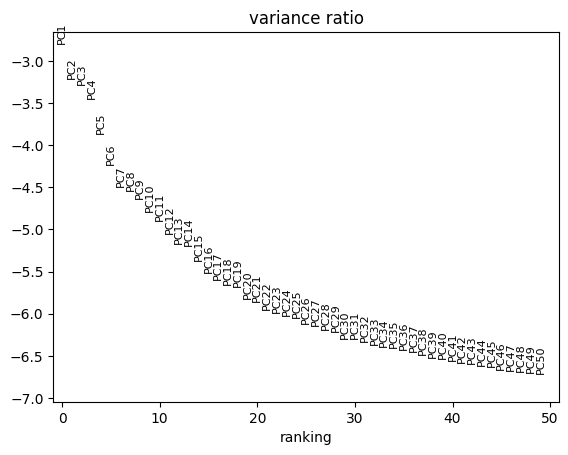

/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


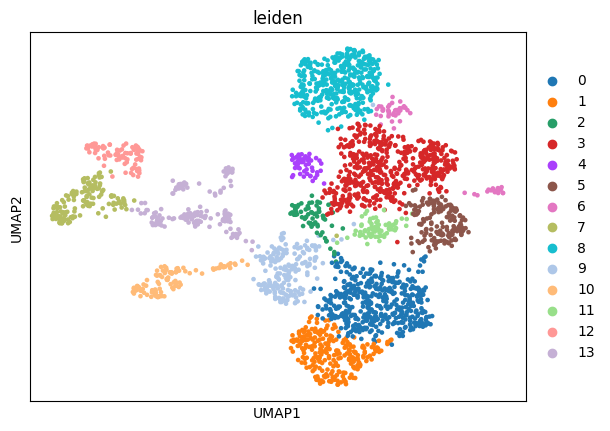

In [30]:
sc.tl.pca(fibro)
sc.pl.pca_variance_ratio(fibro, n_pcs=50, log=True)
sc.pp.neighbors(fibro)
sc.tl.umap(fibro)
sc.tl.leiden(fibro, flavor="igraph", n_iterations=2, resolution=0.5)
sc.pl.umap(fibro, color=["leiden"])



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:169: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:169: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:169: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:169: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/

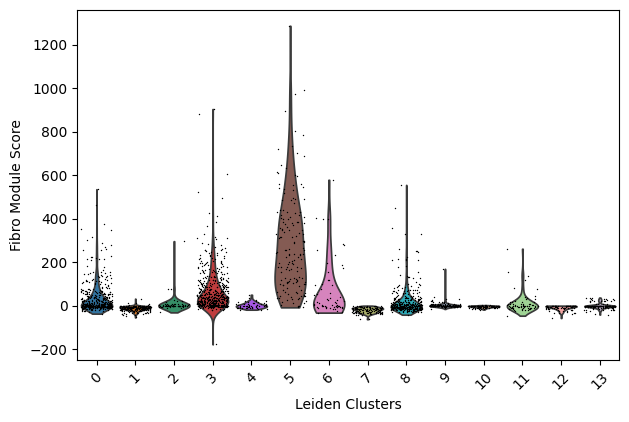

         mean     median
0   33.491150   5.206215
3   68.927310  36.747126
4   12.672716   5.326667
5   15.758242  -0.047619
1   -1.110308  -1.346667
2    3.039719  -2.740113
6   71.255838  10.152542
7    0.015079  -0.338384
8   38.221454  14.520000
9    3.151986   0.115646
10   0.996831   0.449495
11  24.174686   7.213333
12   0.000000   0.000000
13   3.549806  -0.460000


In [80]:
import scanpy as sc
import pandas as pd

# 유전자 리스트 정의 (단일 차원의 리스트로 수정)
fibro_genes = ['COL3A1', 'COL1A1','COL1A2']

# 각 클러스터별로 데이터 분리 후 점수 계산
cluster_scores = {}

for cluster in fibro.obs['leiden'].unique():
    # 클러스터별 서브셋 생성
    cluster_data = fibro[fibro.obs['leiden'] == cluster]
    
    # 클러스터별 유전자 점수 계산
    sc.tl.score_genes(cluster_data, fibro_genes, score_name=f'fibro_score_{cluster}')
    
    # 결과 저장
    cluster_scores[cluster] = cluster_data.obs[f'fibro_score_{cluster}']

# 클러스터별 평균 및 중앙값 점수 계산
score_summary = pd.DataFrame({
    cluster: {
        'mean': scores.mean(),
        'median': scores.median()
    } for cluster, scores in cluster_scores.items()
}).T

# fibro 전체에 대해 유전자 점수 계산
sc.tl.score_genes(fibro, fibro_genes, score_name='fibro_module_score')

# Violin plot 시각화
sc.pl.violin(
    fibro,
    keys='fibro_module_score',  # 표시할 값
    groupby='leiden',  # 클러스터 기준
    jitter=0.4,  # 데이터 포인트 표시
    rotation=45,  # x축 라벨 회전
    stripplot=True,  # 개별 데이터 포인트 추가
    xlabel='Leiden Clusters',
    ylabel='Fibro Module Score',
)

# 결과 출력
print(score_summary)


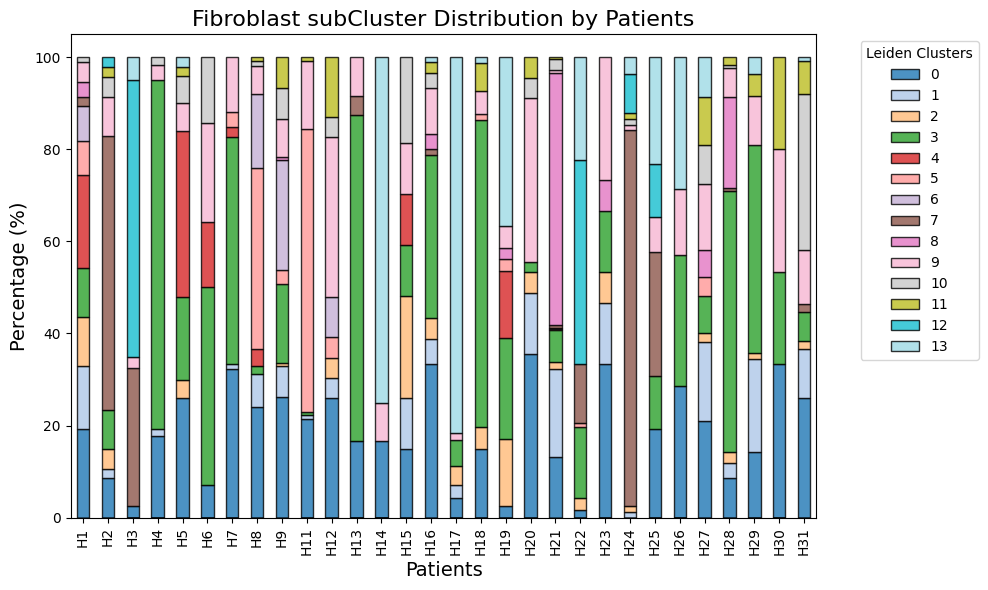

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# 'patients'와 'leiden' 간의 교차 테이블 생성
patient_leiden_dist = pd.crosstab(fibro.obs['patients'], fibro.obs['leiden'])

# 비율로 변환 (선택사항: 각 patient별 클러스터 분포 비율 보기)
patient_leiden_dist_percentage = patient_leiden_dist.div(patient_leiden_dist.sum(axis=1), axis=0) * 100

# Stacked Bar Plot으로 시각화
patient_leiden_dist_percentage.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    colormap='tab20',
    alpha=0.8,
    edgecolor='black'
)

plt.title("Fibroblast subCluster Distribution by Patients", fontsize=16)
plt.xlabel("Patients", fontsize=14)
plt.ylabel("Percentage (%)", fontsize=14)
plt.legend(title="Leiden Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [33]:
fibro.obs['leiden'].value_counts()

leiden
3     503
0     452
8     408
1     249
9     193
5     156
13    155
7     140
10    102
12     87
11     69
2      66
6      60
4      54
Name: count, dtype: int64

In [34]:
sub = fibro[fibro.obs['leiden'] == '5']

In [35]:
sub.obs['patients'].value_counts()

patients
H11    83
H8     44
H27     9
H1      7
H9      4
H7      3
H21     2
H12     1
H18     1
H19     1
H22     1
Name: count, dtype: int64

In [78]:
import anndata as ad

# 예시 데이터를 생성하거나 로드
# fibo = ad.AnnData()  # 빈 AnnData 생성 (예시)
# 또는 기존 데이터를 fibo로 사용
# fibo = your_existing_data

# 저장 경로 설정
save_path = '/home/Data_Drive_8TB_3/kykim/colon/fibro.h5ad'

# 데이터 저장
fibro.write(save_path)

print(f"데이터가 {save_path}에 성공적으로 저장되었습니다.")


데이터가 /home/Data_Drive_8TB_3/kykim/colon/fibro.h5ad에 성공적으로 저장되었습니다.


In [36]:
import pandas as pd

# 'patients'와 'leiden' 간의 교차 테이블 생성
patient_leiden_dist = pd.crosstab(fibro.obs['patients'], fibro.obs['leiden'])

# 비율로 변환 (옵션)
patient_leiden_dist_percentage = patient_leiden_dist.div(patient_leiden_dist.sum(axis=1), axis=0) * 100


print("\nPercentage Distribution:")
print(patient_leiden_dist_percentage)


Percentage Distribution:
leiden            0          1          2          3          4          5  \
patients                                                                     
H1        19.148936  13.829787  10.638298  10.638298  20.212766   7.446809   
H2         8.510638   2.127660   4.255319   8.510638   0.000000   0.000000   
H3         2.500000   0.000000   0.000000   0.000000   0.000000   0.000000   
H4        17.741935   1.612903   0.000000  75.806452   0.000000   0.000000   
H5        26.000000   0.000000   4.000000  18.000000  36.000000   0.000000   
H6         7.142857   0.000000   0.000000  42.857143  14.285714   0.000000   
H7        32.258065   1.075269   0.000000  49.462366   2.150538   3.225806   
H8        24.107143   7.142857   0.000000   1.785714   3.571429  39.285714   
H9        26.119403   6.716418   0.746269  17.164179   0.000000   2.985075   
H11       21.481481   0.740741   0.000000   0.740741   0.000000  61.481481   
H12       26.086957   4.347826   4.347

/tmp/ipykernel_353118/3124433492.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = fibro.to_df().groupby(fibro.obs['leiden']).mean()


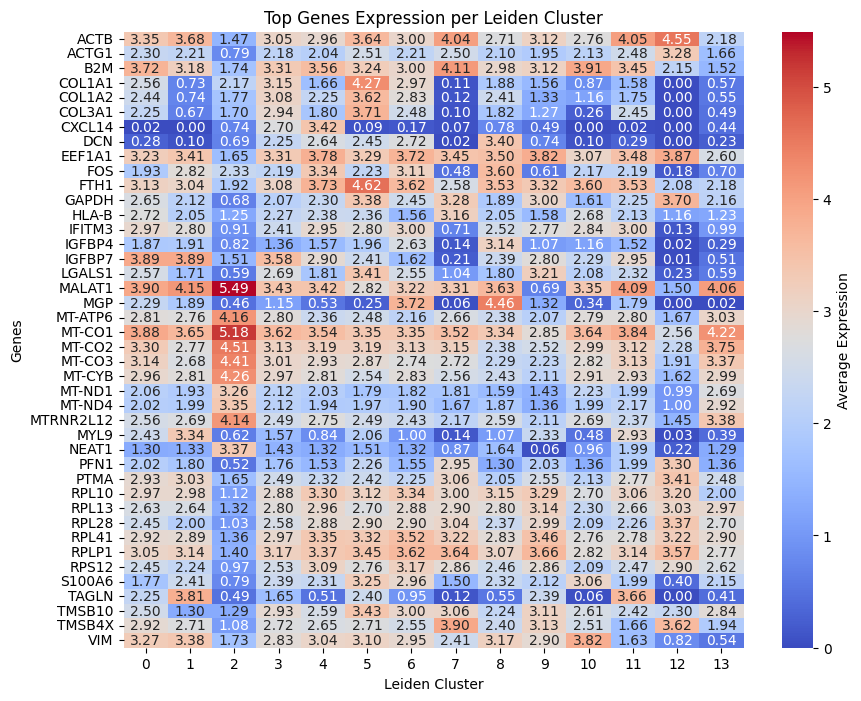

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 클러스터별 평균 발현 계산
cluster_means = fibro.to_df().groupby(fibro.obs['leiden']).mean()

# 각 클러스터별 상위 발현 유전자 추출
top_genes_per_cluster = {}
top_n = 10  # 클러스터별 상위 N개의 유전자를 선택
for cluster in cluster_means.index:
    # 클러스터별 평균 발현 값으로 정렬 후 상위 N개 선택
    top_genes = cluster_means.loc[cluster].sort_values(ascending=False).head(top_n)
    top_genes_per_cluster[cluster] = top_genes

# 결과를 데이터프레임으로 변환
top_genes_df = pd.DataFrame(top_genes_per_cluster).T


# 히트맵으로 상위 유전자 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(
    cluster_means[top_genes_df.columns].T,  # 상위 유전자에 해당하는 값만 표시
    cmap="coolwarm",  # 낮은 값은 파란색, 높은 값은 빨간색
    annot=True,
    fmt=".2f",
    cbar_kws={"label": "Average Expression"},
)
plt.title("Top Genes Expression per Leiden Cluster")
plt.xlabel("Leiden Cluster")
plt.ylabel("Genes")
plt.show()


In [38]:
import pandas as pd
from scipy.stats import pearsonr

# 환자 목록
patients = ['H8', 'H11', 'H24']

# 결과를 저장할 딕셔너리
correlation_results = {}

# 환자별로 처리
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    cebpb = patient_data[:, 'CEBPB'].X.flatten()
    lcn2 = patient_data[:, 'LCN2'].X.flatten()
    
    # 발현값이 0인 데이터를 제외
    mask_ctla4_cebpb = (ctla4 > 0) & (cebpb > 0)
    mask_ctla4_lcn2 = (ctla4 > 0) & (lcn2 > 0)
    
    # 필터링된 데이터
    ctla4_cebpb_filtered = (ctla4[mask_ctla4_cebpb], cebpb[mask_ctla4_cebpb])
    ctla4_lcn2_filtered = (ctla4[mask_ctla4_lcn2], lcn2[mask_ctla4_lcn2])
    
    # 상관계수와 p-value 계산
    if len(ctla4_cebpb_filtered[0]) > 1:  # 데이터가 충분한 경우에만 계산
        corr_ctla4_cebpb, pval_ctla4_cebpb = pearsonr(*ctla4_cebpb_filtered)
    else:
        corr_ctla4_cebpb, pval_ctla4_cebpb = None, None

    if len(ctla4_lcn2_filtered[0]) > 1:  # 데이터가 충분한 경우에만 계산
        corr_ctla4_lcn2, pval_ctla4_lcn2 = pearsonr(*ctla4_lcn2_filtered)
    else:
        corr_ctla4_lcn2, pval_ctla4_lcn2 = None, None
    
    # 결과 저장
    correlation_results[patient] = {
        'CTLA4 vs CEBPB (corr)': corr_ctla4_cebpb,
        'CTLA4 vs CEBPB (p-value)': pval_ctla4_cebpb,
        'CTLA4 vs LCN2 (corr)': corr_ctla4_lcn2,
        'CTLA4 vs LCN2 (p-value)': pval_ctla4_lcn2,
    }

# 결과 출력
correlation_df = pd.DataFrame(correlation_results).T
print(correlation_df)


     CTLA4 vs CEBPB (corr)  CTLA4 vs CEBPB (p-value)  CTLA4 vs LCN2 (corr)  \
H8               -0.406105                  0.318130                   NaN   
H11               0.219137                  0.186216                   NaN   
H24               0.077296                  0.002426             -0.085097   

     CTLA4 vs LCN2 (p-value)  
H8                       NaN  
H11                      NaN  
H24                 0.685892  


In [39]:
import pandas as pd
from scipy.stats import pearsonr

# 환자 목록
patients = ['H1', 'H2', 'H3']

# 결과를 저장할 딕셔너리
correlation_results = {}

# 환자별로 처리
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    cebpb = patient_data[:, 'CEBPB'].X.flatten()
    lcn2 = patient_data[:, 'LCN2'].X.flatten()
    
    # 상관계수와 p-value 계산
    if len(ctla4) > 1 and len(cebpb) > 1:  # 데이터가 충분한 경우에만 계산
        corr_ctla4_cebpb, pval_ctla4_cebpb = pearsonr(ctla4, cebpb)
    else:
        corr_ctla4_cebpb, pval_ctla4_cebpb = None, None

    if len(ctla4) > 1 and len(lcn2) > 1:  # 데이터가 충분한 경우에만 계산
        corr_ctla4_lcn2, pval_ctla4_lcn2 = pearsonr(ctla4, lcn2)
    else:
        corr_ctla4_lcn2, pval_ctla4_lcn2 = None, None
    
    # 결과 저장
    correlation_results[patient] = {
        'CTLA4 vs CEBPB (corr)': corr_ctla4_cebpb,
        'CTLA4 vs CEBPB (p-value)': pval_ctla4_cebpb,
        'CTLA4 vs LCN2 (corr)': corr_ctla4_lcn2,
        'CTLA4 vs LCN2 (p-value)': pval_ctla4_lcn2,
    }

# 결과 출력
correlation_df = pd.DataFrame(correlation_results).T
print(correlation_df)


    CTLA4 vs CEBPB (corr)  CTLA4 vs CEBPB (p-value)  CTLA4 vs LCN2 (corr)  \
H1              -0.009535                  0.540131             -0.055736   
H2              -0.013452                  0.366630             -0.037522   
H3               0.055674                  0.008818             -0.091111   

    CTLA4 vs LCN2 (p-value)  
H1                 0.000339  
H2                 0.011771  
H3                 0.000018  


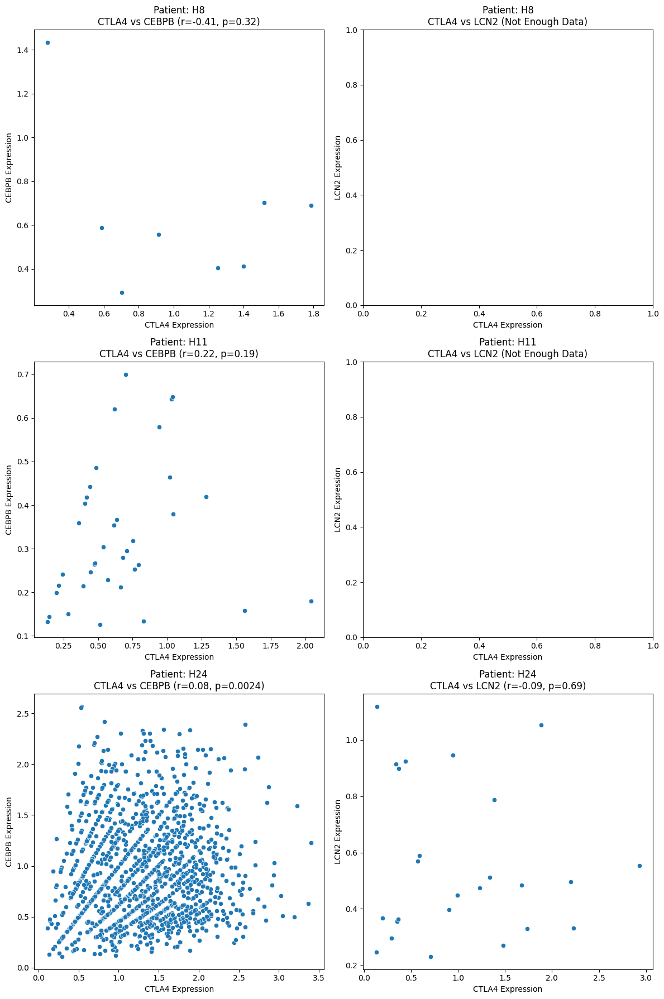

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 환자 목록
patients = ['H8', 'H11', 'H24']

# 플롯 설정
fig, axes = plt.subplots(len(patients), 2, figsize=(12, 6 * len(patients)))
axes = axes if len(patients) > 1 else [axes]

for i, patient in enumerate(patients):
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    cebpb = patient_data[:, 'CEBPB'].X.flatten()
    lcn2 = patient_data[:, 'LCN2'].X.flatten()
    
    # 0 필터링
    mask_ctla4_cebpb = (ctla4 > 0) & (cebpb > 0)
    mask_ctla4_lcn2 = (ctla4 > 0) & (lcn2 > 0)
    
    ctla4_cebpb_filtered = (ctla4[mask_ctla4_cebpb], cebpb[mask_ctla4_cebpb])
    ctla4_lcn2_filtered = (ctla4[mask_ctla4_lcn2], lcn2[mask_ctla4_lcn2])
    
    # `CTLA4` vs `CEBPB` 플롯
    ax1 = axes[i][0] if len(patients) > 1 else axes[0]
    sns.scatterplot(x=ctla4_cebpb_filtered[0], y=ctla4_cebpb_filtered[1], ax=ax1)
    if len(ctla4_cebpb_filtered[0]) > 1:  # 데이터 충분 여부 확인
        corr, pval = pearsonr(ctla4_cebpb_filtered[0], ctla4_cebpb_filtered[1])
        ax1.set_title(f"Patient: {patient}\nCTLA4 vs CEBPB (r={corr:.2f}, p={pval:.2g})")
    else:
        ax1.set_title(f"Patient: {patient}\nCTLA4 vs CEBPB (Not Enough Data)")
    ax1.set_xlabel("CTLA4 Expression")
    ax1.set_ylabel("CEBPB Expression")
    
    # `CTLA4` vs `LCN2` 플롯
    ax2 = axes[i][1] if len(patients) > 1 else axes[1]
    sns.scatterplot(x=ctla4_lcn2_filtered[0], y=ctla4_lcn2_filtered[1], ax=ax2)
    if len(ctla4_lcn2_filtered[0]) > 1:  # 데이터 충분 여부 확인
        corr, pval = pearsonr(ctla4_lcn2_filtered[0], ctla4_lcn2_filtered[1])
        ax2.set_title(f"Patient: {patient}\nCTLA4 vs LCN2 (r={corr:.2f}, p={pval:.2g})")
    else:
        ax2.set_title(f"Patient: {patient}\nCTLA4 vs LCN2 (Not Enough Data)")
    ax2.set_xlabel("CTLA4 Expression")
    ax2.set_ylabel("LCN2 Expression")

plt.tight_layout()
plt.show()


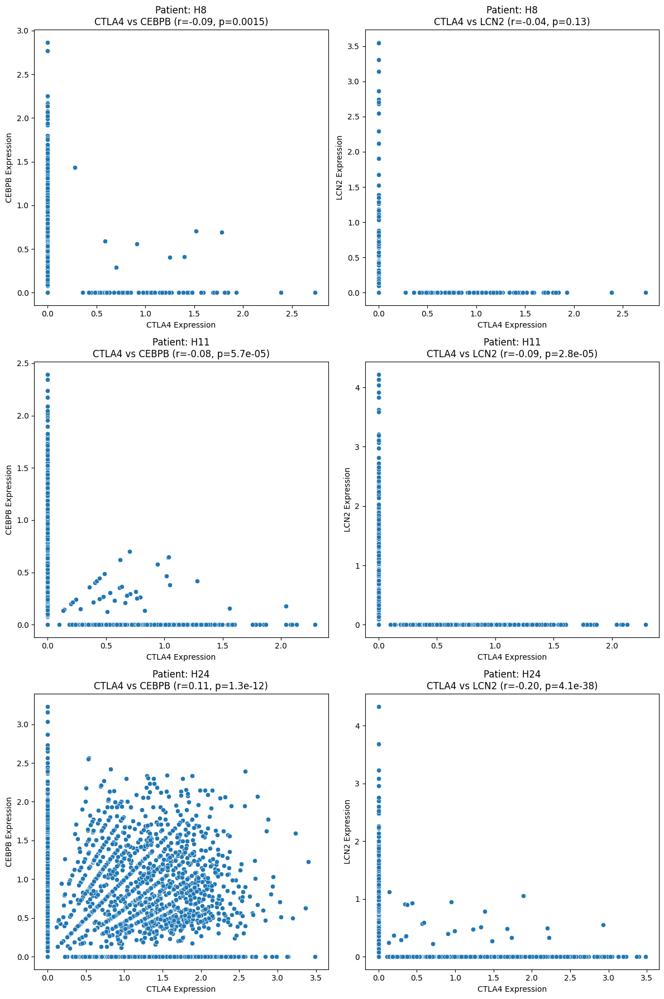

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 환자 목록
patients = ['H8', 'H11', 'H24']

# 플롯 설정
fig, axes = plt.subplots(len(patients), 2, figsize=(12, 6 * len(patients)))
axes = axes if len(patients) > 1 else [axes]

for i, patient in enumerate(patients):
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    cebpb = patient_data[:, 'CEBPB'].X.flatten()
    lcn2 = patient_data[:, 'LCN2'].X.flatten()
    
    # `CTLA4` vs `CEBPB` 플롯
    ax1 = axes[i][0] if len(patients) > 1 else axes[0]
    sns.scatterplot(x=ctla4, y=cebpb, ax=ax1)
    corr, pval = pearsonr(ctla4, cebpb)
    ax1.set_title(f"Patient: {patient}\nCTLA4 vs CEBPB (r={corr:.2f}, p={pval:.2g})")
    ax1.set_xlabel("CTLA4 Expression")
    ax1.set_ylabel("CEBPB Expression")
    
    # `CTLA4` vs `LCN2` 플롯
    ax2 = axes[i][1] if len(patients) > 1 else axes[1]
    sns.scatterplot(x=ctla4, y=lcn2, ax=ax2)
    corr, pval = pearsonr(ctla4, lcn2)
    ax2.set_title(f"Patient: {patient}\nCTLA4 vs LCN2 (r={corr:.2f}, p={pval:.2g})")
    ax2.set_xlabel("CTLA4 Expression")
    ax2.set_ylabel("LCN2 Expression")

plt.tight_layout()
plt.show()


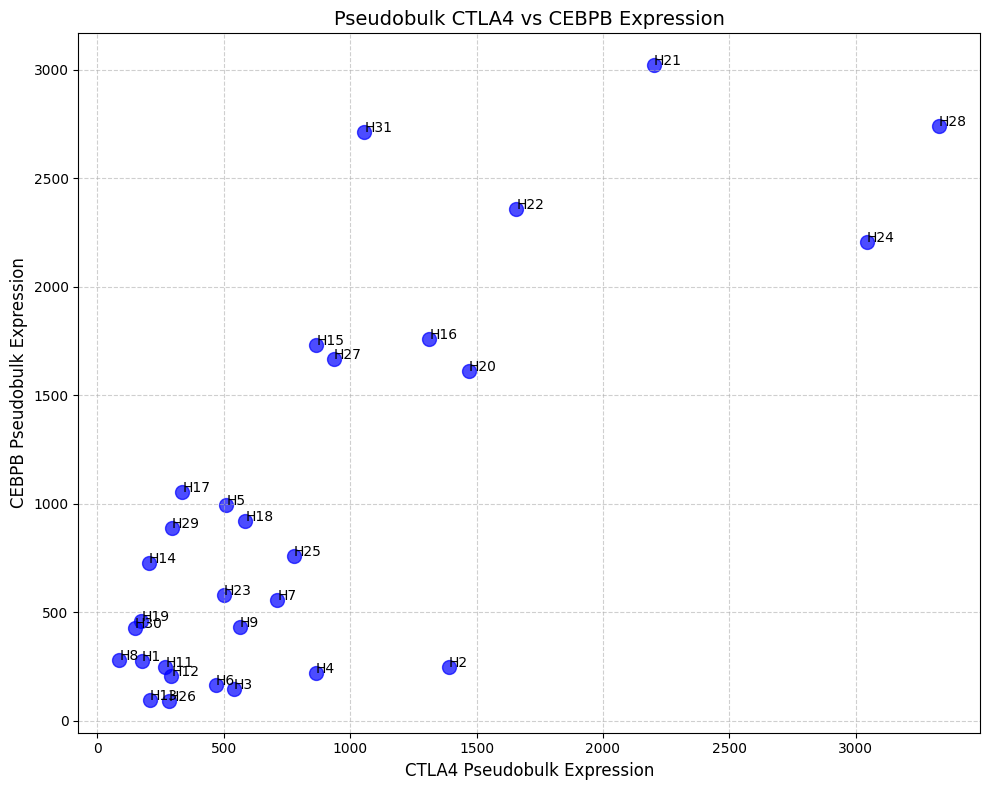

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    lcn2 = patient_data[:, 'CEBPB'].X.flatten()
    
    # Pseudobulk 합산
    pseudobulk_ctla4 = ctla4.sum()
    pseudobulk_lcn2 = lcn2.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'CEBPB': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['CEBPB'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'CEBPB'], patient, fontsize=10)

plt.title("Pseudobulk CTLA4 vs CEBPB Expression", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression", fontsize=12)
plt.ylabel("CEBPB Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


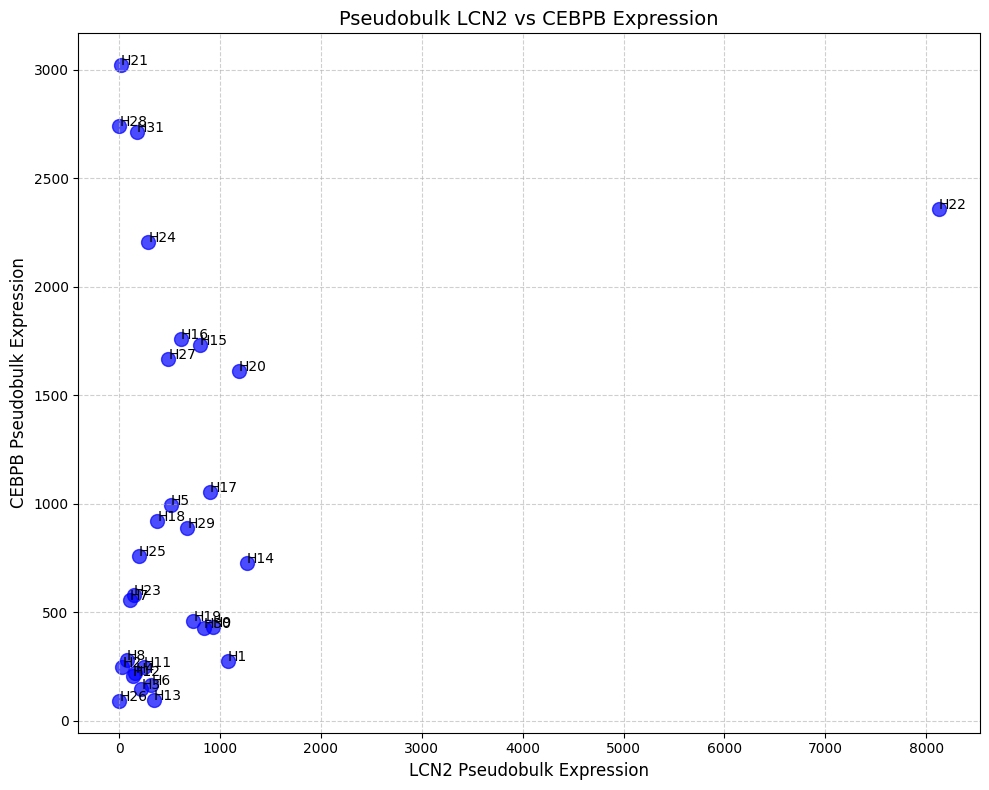

In [43]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'LCN2'].X.flatten()
    lcn2 = patient_data[:, 'CEBPB'].X.flatten()
    
    # Pseudobulk 합산
    pseudobulk_ctla4 = ctla4.sum()
    pseudobulk_lcn2 = lcn2.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'LCN2': pseudobulk_ctla4, 'CEBPB': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['LCN2'], pseudobulk_df['CEBPB'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'LCN2'], pseudobulk_df.loc[patient, 'CEBPB'], patient, fontsize=10)

plt.title("Pseudobulk LCN2 vs CEBPB Expression", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression", fontsize=12)
plt.ylabel("CEBPB Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


/tmp/ipykernel_353118/3999850214.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  module_score_stats = adata.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])
/tmp/ipykernel_353118/3999850214.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='patients', y='module_score', data=adata.obs, palette='Set2')


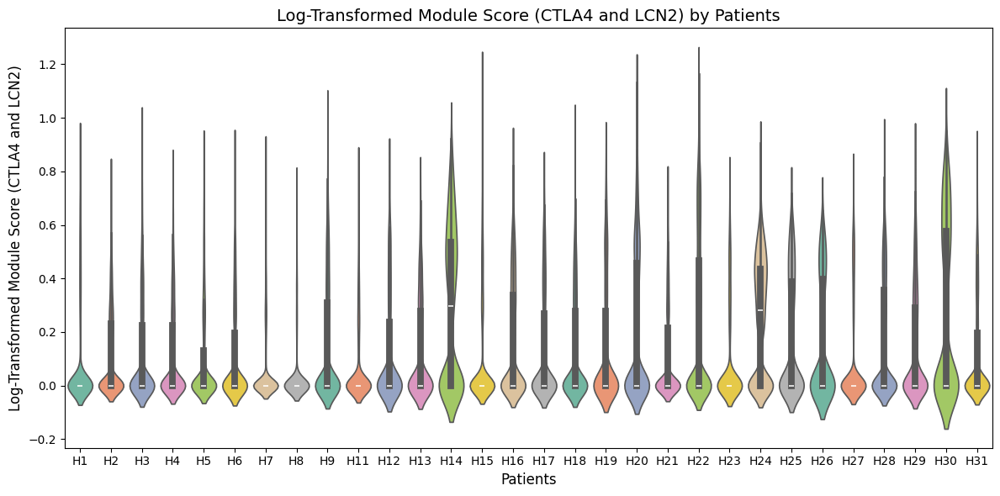

          count  min       max    median      mean
patients                                          
H14        1350  0.0  0.921697  0.296459  0.287376
H30         874  0.0  0.949881  0.000000  0.278199
H24        4146  0.0  0.905194  0.280287  0.250353
H22       10885  0.0  1.172933  0.000000  0.233632
H20        3448  0.0  1.131432  0.000000  0.213228
H25        1631  0.0  0.716356  0.000000  0.183553
H16        3607  0.0  0.882020  0.000000  0.167839
H28        6327  0.0  0.920534  0.000000  0.161245
H26         545  0.0  0.652401  0.000000  0.158810
H29        2094  0.0  0.894392  0.000000  0.147404
H9         3155  0.0  1.017126  0.000000  0.141551
H19        1902  0.0  0.884838  0.000000  0.136437
H17        2913  0.0  0.789942  0.000000  0.130105
H18        2453  0.0  0.968932  0.000000  0.125068
H13        1416  0.0  0.765871  0.000000  0.124990
H12        1137  0.0  0.826113  0.000000  0.116040
H2         4506  0.0  0.788030  0.000000  0.108894
H3         2212  0.0  0.959898 

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 분석할 유전자 목록
genes = ['CTLA4', 'LCN2']

# 유전자 발현 값 추출
gene_expression = adata[:, genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(
    gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
    index=adata.obs_names, columns=genes
)

# 로그 변환 (log1p: log(x + 1), 0 값도 처리 가능)
log_gene_expression_df = np.log1p(gene_expression_df)

# 통합 점수 계산 (로그 변환된 값들의 평균)
adata.obs['module_score'] = log_gene_expression_df.mean(axis=1)

# 환자별 module_score 통계 계산
module_score_stats = adata.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# violin plot 시각화
plt.figure(figsize=(12, 6))
sns.violinplot(x='patients', y='module_score', data=adata.obs, palette='Set2')

# 그래프 꾸미기
plt.title('Log-Transformed Module Score (CTLA4 and LCN2) by Patients', fontsize=14)
plt.xlabel('Patients', fontsize=12)
plt.ylabel('Log-Transformed Module Score (CTLA4 and LCN2)', fontsize=12)
plt.tight_layout()
plt.show()

# 결과 출력 (환자별 통계)
module_score_stats_sorted = module_score_stats.sort_values(by='mean', ascending=False)

# 정렬된 결과 출력
print(module_score_stats_sorted)


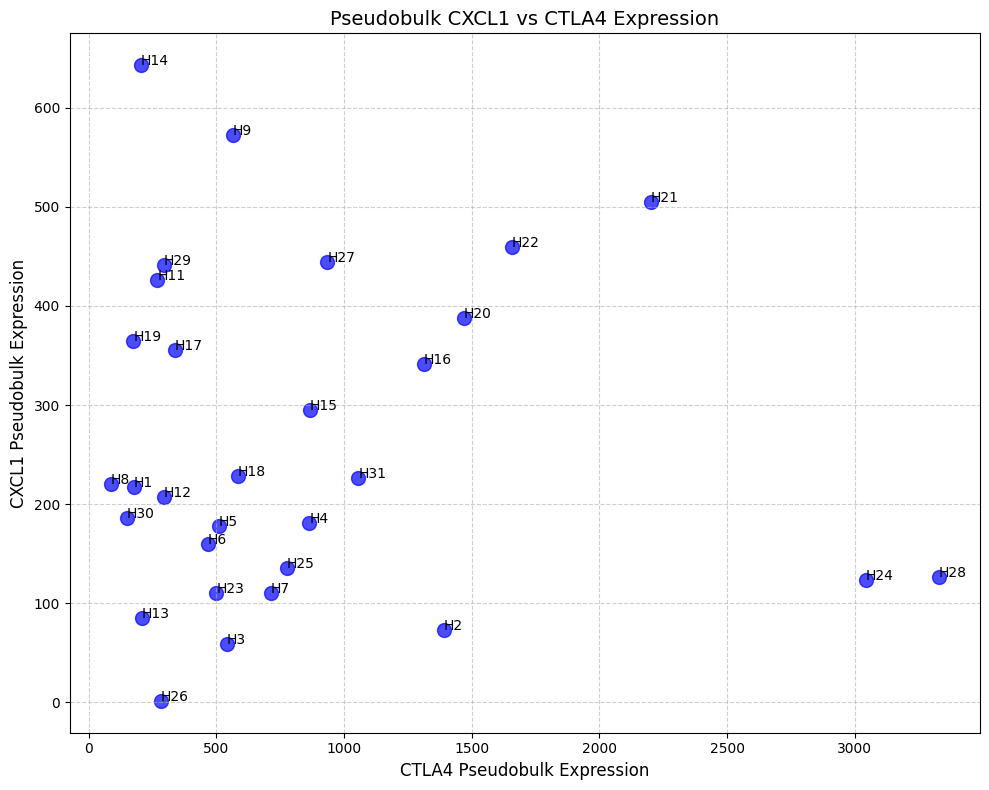

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()
    cxcl1 = patient_data[:, 'CXCL1'].X.flatten()
    
    # Pseudobulk 합산
    pseudobulk_ctla4 = ctla4.sum()
    pseudobulk_cxcl1 = cxcl1.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'CXCL1': pseudobulk_cxcl1}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['CXCL1'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'CXCL1'], patient, fontsize=10)

plt.title("Pseudobulk CXCL1 vs CTLA4 Expression", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression", fontsize=12)
plt.ylabel("CXCL1 Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


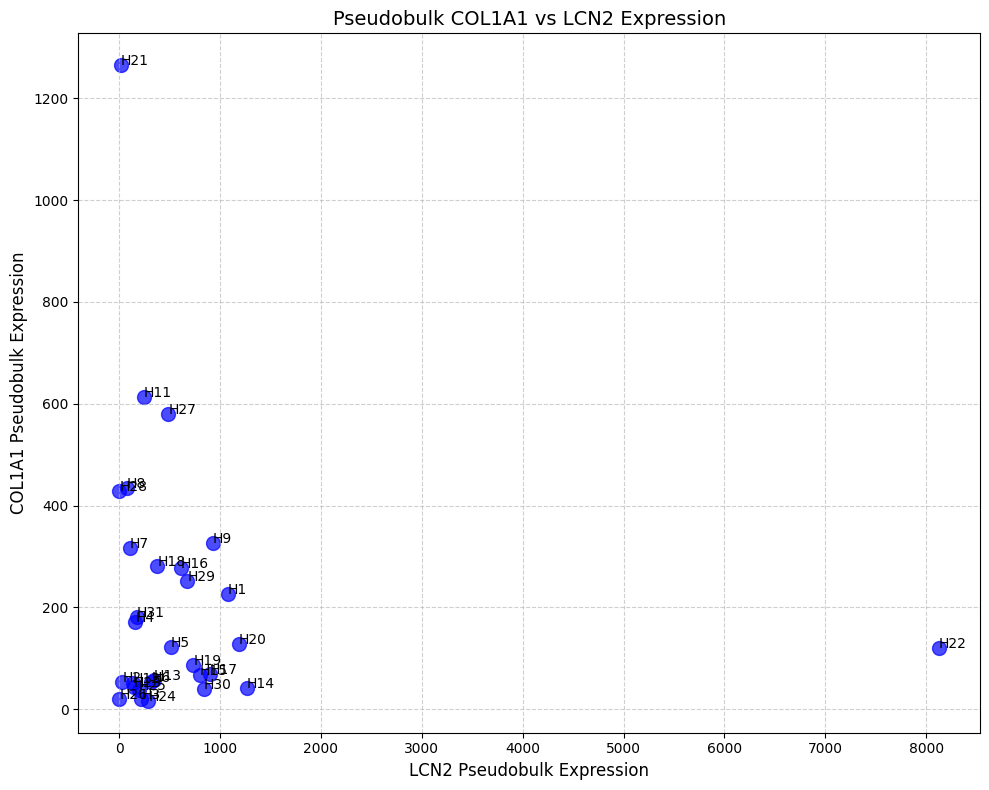

In [46]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    lcn2 = patient_data[:, 'LCN2'].X.flatten()
    col1a1 = patient_data[:, 'COL1A1'].X.flatten()
    
    # Pseudobulk 합산
    pseudobulk_lcn2 = lcn2.sum()
    pseudobulk_col1a1 = col1a1.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'LCN2': pseudobulk_lcn2, 'COL1A1': pseudobulk_col1a1}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['LCN2'], pseudobulk_df['COL1A1'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'LCN2'], pseudobulk_df.loc[patient, 'COL1A1'], patient, fontsize=10)

plt.title("Pseudobulk COL1A1 vs LCN2 Expression", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression", fontsize=12)
plt.ylabel("COL1A1 Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


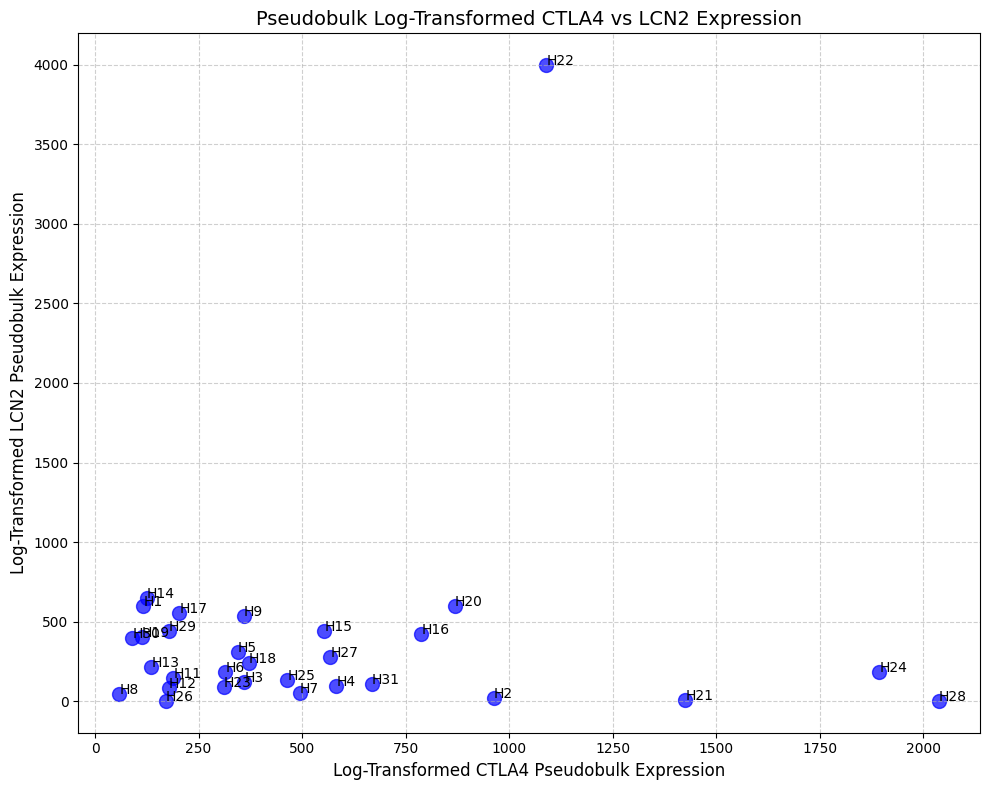

In [47]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()  # CTLA4를 ctla4 변수에 저장
    lcn2 = patient_data[:, 'LCN2'].X.flatten()    # LCN2를 lcn2 변수에 저장
    
    # 로그 변환 (log1p: log(x + 1), 0 값도 처리 가능)
    log_ctla4 = np.log1p(ctla4)
    log_lcn2 = np.log1p(lcn2)
    
    # Pseudobulk 합산
    pseudobulk_ctla4 = log_ctla4.sum()
    pseudobulk_lcn2 = log_lcn2.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'LCN2': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['LCN2'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'LCN2'], patient, fontsize=10)

plt.title("Pseudobulk Log-Transformed CTLA4 vs LCN2 Expression", fontsize=14)
plt.xlabel("Log-Transformed CTLA4 Pseudobulk Expression", fontsize=12)
plt.ylabel("Log-Transformed LCN2 Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


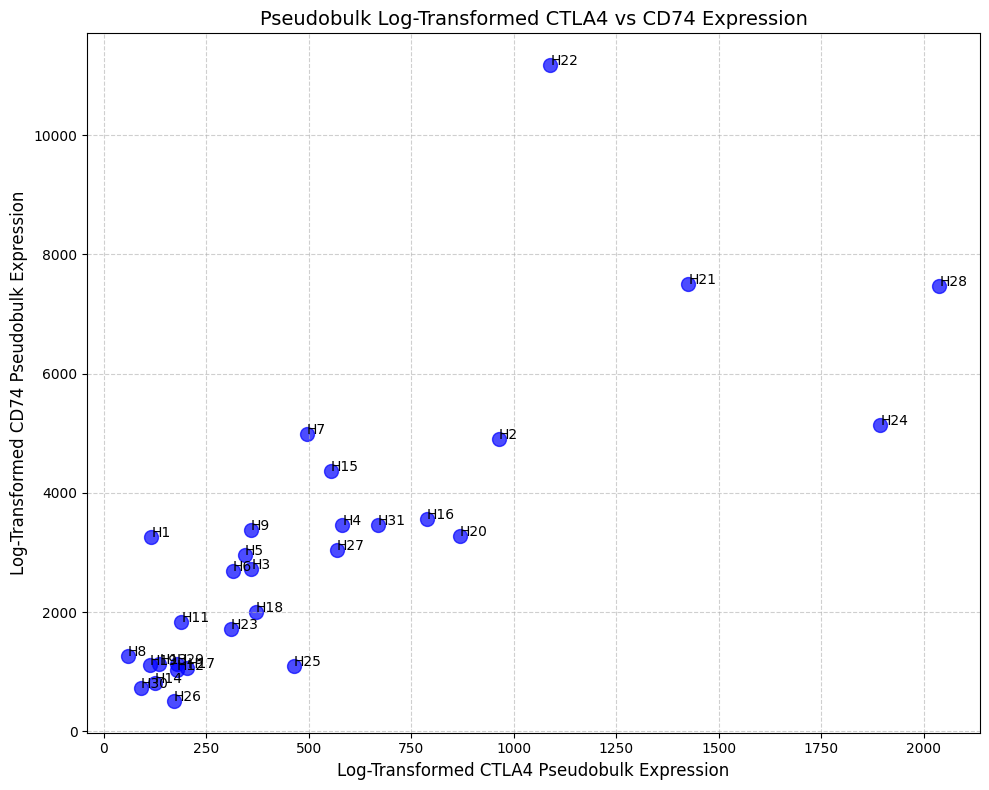

In [48]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()  # CTLA4를 ctla4 변수에 저장
    CD74 = patient_data[:, 'CD74'].X.flatten()    # LCN2를 lcn2 변수에 저장
    
    # 로그 변환 (log1p: log(x + 1), 0 값도 처리 가능)
    log_ctla4 = np.log1p(ctla4)
    log_CD74 = np.log1p(CD74)
    
    # Pseudobulk 합산
    pseudobulk_ctla4 = log_ctla4.sum()
    pseudobulk_CD74 = log_CD74.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'CD74': pseudobulk_CD74}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['CD74'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'CD74'], patient, fontsize=10)

plt.title("Pseudobulk Log-Transformed CTLA4 vs CD74 Expression", fontsize=14)
plt.xlabel("Log-Transformed CTLA4 Pseudobulk Expression", fontsize=12)
plt.ylabel("Log-Transformed CD74 Pseudobulk Expression", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [49]:
adata

AnnData object with n_obs × n_vars = 99268 × 27873
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patients', 'MSS', 'KRAS', 'KRAS.mutation', 'Location', 'Stage', 'snv_sum', 'souporcell', 'frequency', 'TP53.mutation', 'CD74positive', 'CEBPBpositive', 'High.expansion', 'subclustering_CD8T', 'MHCpositive', 'Stage_T', 'stage_N', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.2', 'seurat_clusters', 'annotation', 'annotation_detail', 'annotation_proportion', 'MSI_Mut', 'TP53_Mut', 'RAS_Mut', 'TMB', 'CS_ratio', 'APC_Mut', 'annot_pseudo', 'patients_num', 'Annotation_total', 'Annotation_total_Tsub', 'Annotation_total_lv4', 'Annotation_total_Trough', 'annotation_tmp', 'Celltype_Fig1', 'Annotation_Fig1', 'Annotation_Fig1A', 'Annotation_tmp_fr', 'Annotation_cell2loc_onlyEpiT', 'Annotation_cell2loc', 'Annotation_cell2loc_onlyEpicebpbhl_T', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pc

In [50]:
adata.obs['Annotation_total'].value_counts()

Annotation_total
T/NK             44841
Epithelial       19816
Myeloid          11489
CD19B             6621
plasmaB           6022
Cycling cells     4744
Fibroblasts       2694
Endothelial       1714
Mast              1327
Name: count, dtype: int64

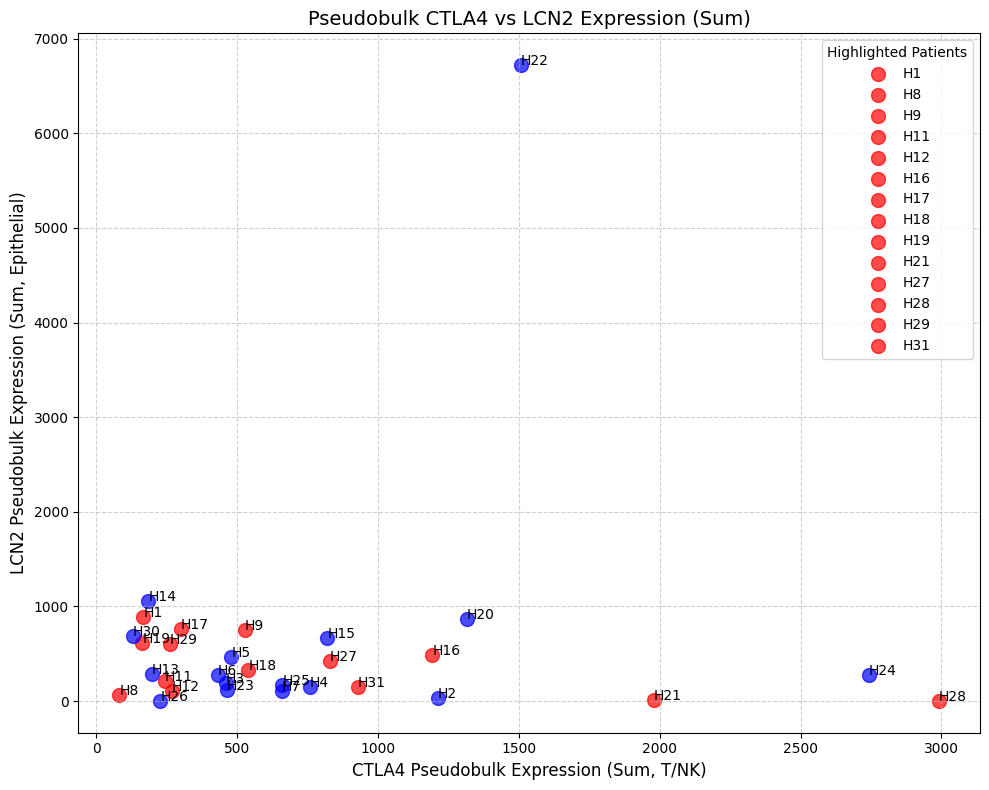

In [51]:
import matplotlib.pyplot as plt
import pandas as pd

# 빨간색으로 표시할 환자 목록
highlighted_patients = {"H21", "H8", "H11", "H27", "H9", "H29", "H18", "H31", "H28", "H16", "H17", "H1", "H19", "H12"}

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'T/NK']
    ctla4 = tnk_data[:, 'CTLA4'].X.flatten()  # CTLA4 값 추출

    # Epithelial 그룹에서 LCN2 발현 추출
    epithelial_data = patient_data[patient_data.obs['Annotation_total'] == 'Epithelial']
    lcn2 = epithelial_data[:, 'LCN2'].X.flatten()  # LCN2 값 추출
    
    # Pseudobulk 합계 계산
    pseudobulk_ctla4 = ctla4.sum()
    pseudobulk_lcn2 = lcn2.sum()
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'LCN2': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
for patient in pseudobulk_df.index:
    color = 'red' if patient in highlighted_patients else 'blue'  # 빨간색과 파란색 구분
    plt.scatter(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        s=100, 
        c=color, 
        alpha=0.7,
        label=patient if color == 'red' else None  # 레전드에 빨간색 환자만 추가
    )
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk CTLA4 vs LCN2 Expression (Sum)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Sum, T/NK)", fontsize=12)
plt.ylabel("LCN2 Pseudobulk Expression (Sum, Epithelial)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="best", title="Highlighted Patients", fontsize=10)
plt.tight_layout()
plt.show()


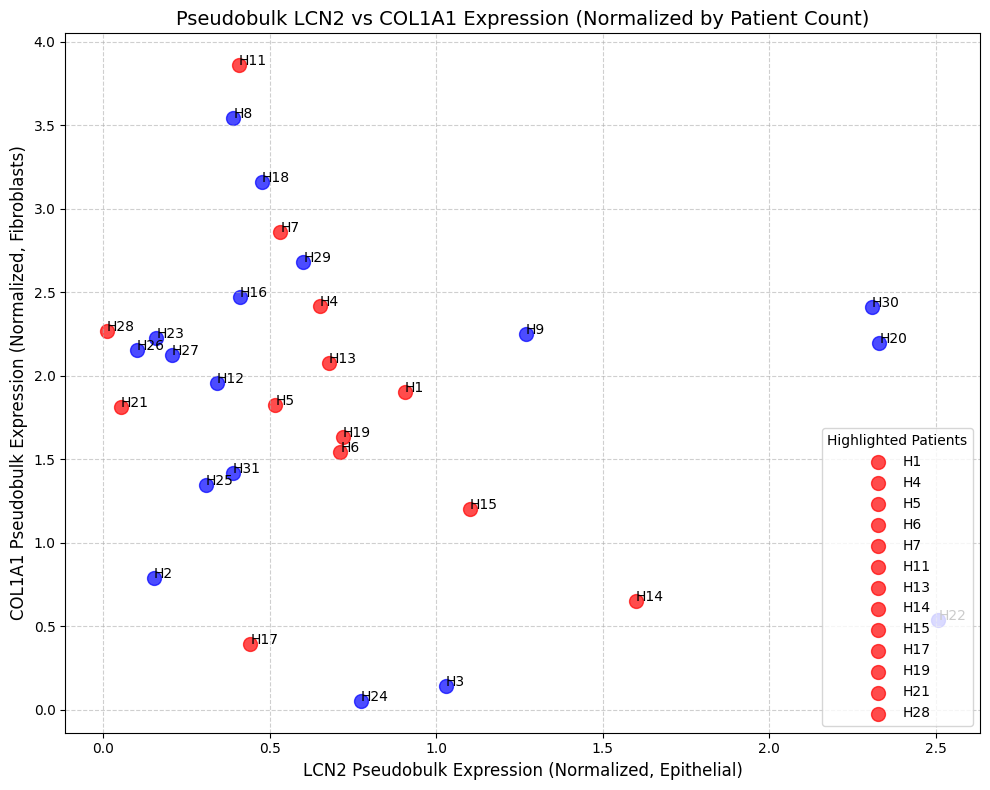

In [52]:
import matplotlib.pyplot as plt
import pandas as pd

# 빨간색으로 표시할 환자 목록
highlighted_patients = {"H5",'H13','H11','H21','H6','H28','H1','H14','H7','H15','H4','H19','H17'}

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # Epithelial 그룹에서 LCN2 발현 추출
    epithelial_data = patient_data[patient_data.obs['Annotation_total'] == 'Epithelial']
    lcn2 = epithelial_data[:, 'LCN2'].X.flatten()  # LCN2 값 추출
    epithelial_count = epithelial_data.shape[0]  # Epithelial 세포 수

    # Fibroblasts 그룹에서 COL1A1 발현 추출
    fibroblast_data = patient_data[patient_data.obs['Annotation_total'] == 'Fibroblasts']
    col1a1 = fibroblast_data[:, 'COL1A1'].X.flatten()  # COL1A1 값 추출
    fibroblast_count = fibroblast_data.shape[0]  # Fibroblasts 세포 수
    
    # Pseudobulk 합산 후 각 그룹 세포 수로 나누기
    pseudobulk_lcn2 = lcn2.sum() / epithelial_count if epithelial_count > 0 else 0
    pseudobulk_col1a1 = col1a1.sum() / fibroblast_count if fibroblast_count > 0 else 0
    
    # 데이터 저장
    pseudobulk_data[patient] = {'LCN2': pseudobulk_lcn2, 'COL1A1': pseudobulk_col1a1}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
for patient in pseudobulk_df.index:
    color = 'red' if patient in highlighted_patients else 'blue'  # 환자에 따라 색상 설정
    plt.scatter(
        pseudobulk_df.loc[patient, 'LCN2'], 
        pseudobulk_df.loc[patient, 'COL1A1'], 
        s=100, 
        c=color, 
        alpha=0.7,
        label=patient if color == 'red' else None  # 레전드 표시 (빨간색 환자만)
    )
    plt.text(
        pseudobulk_df.loc[patient, 'LCN2'], 
        pseudobulk_df.loc[patient, 'COL1A1'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk LCN2 vs COL1A1 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression (Normalized, Epithelial)", fontsize=12)
plt.ylabel("COL1A1 Pseudobulk Expression (Normalized, Fibroblasts)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="best", title="Highlighted Patients", fontsize=10)
plt.tight_layout()
plt.show()


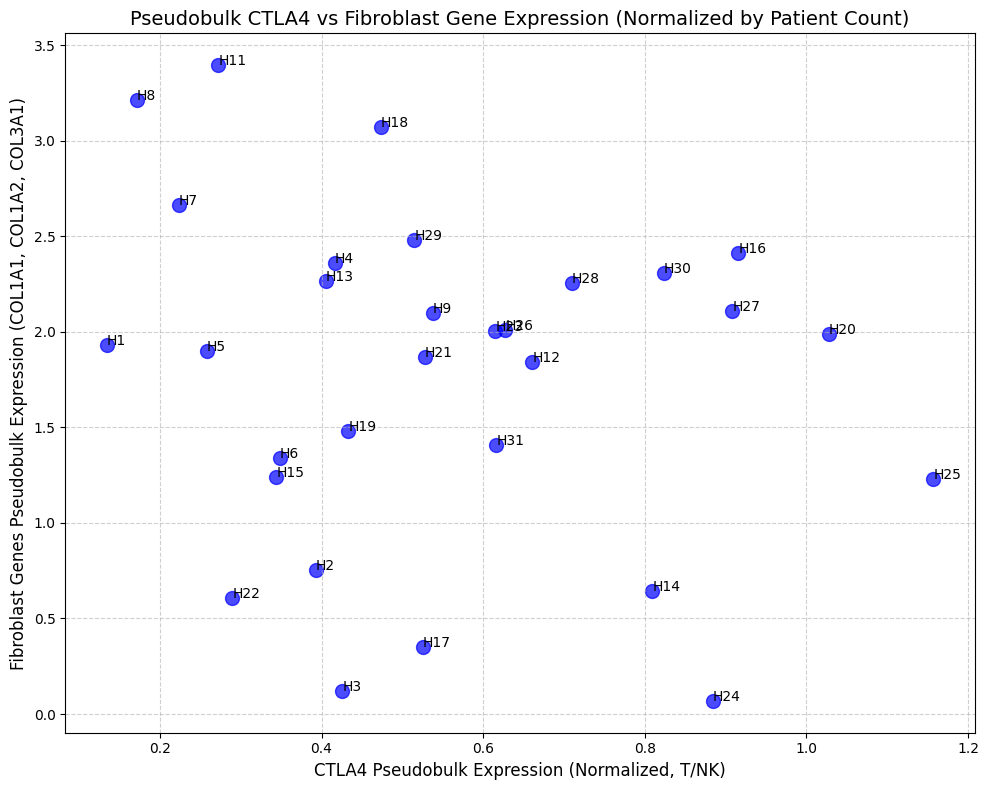

   Correlation   P-value
0     -0.18533  0.326843


In [115]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'T/NK']
    ctla4 = tnk_data[:, 'CTLA4'].X.flatten()  # CTLA4 값 추출
    tnk_count = tnk_data.shape[0]  # T/NK 세포 수
    
    # Fibroblasts 그룹에서 COL1A1, COL1A2, COL3A1 발현 추출
    fibroblast_data = patient_data[patient_data.obs['Annotation_total'] == 'Fibroblasts']
    col1a1 = fibroblast_data[:, 'COL1A1'].X.flatten()
    col1a2 = fibroblast_data[:, 'COL1A2'].X.flatten()
    col3a1 = fibroblast_data[:, 'COL3A1'].X.flatten()
    fibroblast_count = fibroblast_data.shape[0]  # Fibroblasts 세포 수
    
    # Pseudobulk 합산 후 각 그룹 세포 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / tnk_count if tnk_count > 0 else 0
    pseudobulk_fibroblast = (
        (col1a1.sum() + col1a2.sum() + col3a1.sum()) / (3 * fibroblast_count)
        if fibroblast_count > 0
        else 0
    )
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'Fibroblast_Mean': pseudobulk_fibroblast}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# Pearson 상관계수 및 p-value 계산
correlation, p_value = pearsonr(pseudobulk_df['CTLA4'], pseudobulk_df['Fibroblast_Mean'])

# 상관계수와 p-value 출력용 데이터프레임 생성
stats_df = pd.DataFrame({
    "Correlation": [correlation],
    "P-value": [p_value]
})

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(
    pseudobulk_df['CTLA4'], 
    pseudobulk_df['Fibroblast_Mean'], 
    s=100, 
    c='blue', 
    alpha=0.7
)
for patient in pseudobulk_df.index:
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'Fibroblast_Mean'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk CTLA4 vs Fibroblast Gene Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized, T/NK)", fontsize=12)
plt.ylabel("Fibroblast Genes Pseudobulk Expression (COL1A1, COL1A2, COL3A1)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 상관계수와 p-value 데이터프레임 출력
print(stats_df)


In [117]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'T/NK']
    ctla4 = tnk_data[:, 'CTLA4'].X.flatten()  # CTLA4 값 추출
    tnk_count = tnk_data.shape[0]  # T/NK 세포 수
    
    # Fibroblasts 그룹에서 COL1A1, COL1A2, COL3A1 발현 추출
    fibroblast_data = patient_data[patient_data.obs['Annotation_total'] == 'Fibroblasts']
    col1a1 = fibroblast_data[:, 'COL1A1'].X.flatten()
    col1a2 = fibroblast_data[:, 'COL1A2'].X.flatten()
    col3a1 = fibroblast_data[:, 'COL3A1'].X.flatten()
    fibroblast_count = fibroblast_data.shape[0]  # Fibroblasts 세포 수
    
    # Pseudobulk 합산 후 각 그룹 세포 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / tnk_count if tnk_count > 0 else 0
    pseudobulk_fibroblast = (
        (col1a1.sum() + col1a2.sum() + col3a1.sum()) / (3 * fibroblast_count)
        if fibroblast_count > 0
        else 0
    )
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'Fibroblast_Mean': pseudobulk_fibroblast}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# Pearson 상관계수 및 p-value 계산
correlation, p_value = pearsonr(pseudobulk_df['CTLA4'], pseudobulk_df['Fibroblast_Mean'])

# 상관계수와 p-value 출력용 데이터프레임 생성
stats_df = pd.DataFrame({
    "Correlation": [correlation],
    "P-value": [p_value]
})

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(
    pseudobulk_df['CTLA4'], 
    pseudobulk_df['Fibroblast_Mean'], 
    s=100, 
    c='blue', 
    alpha=0.7
)
for patient in pseudobulk_df.index:
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'Fibroblast_Mean'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk CTLA4 vs Fibroblast Gene Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized, T/NK)", fontsize=12)
plt.ylabel("Fibroblast Genes Pseudobulk Expression (COL1A1, COL1A2, COL3A1)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 상관계수와 p-value 데이터프레임 출력
print(stats_df)


   Correlation   P-value
0     0.320696  0.084013


In [121]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'Epithelial']
    ctla4 = tnk_data[:, 'LCN2'].X.flatten()  # CTLA4 값 추출
    
    # Fibroblasts 그룹에서 COL1A1, COL1A2, COL3A1 발현 추출
    fibroblast_data = patient_data[patient_data.obs['Annotation_total'] == 'Fibroblasts']
    col1a1 = fibroblast_data[:, 'COL1A1'].X.flatten()
    col1a2 = fibroblast_data[:, 'COL1A2'].X.flatten()
    col3a1 = fibroblast_data[:, 'COL3A1'].X.flatten()
    
    # Pseudobulk 총합 계산
    pseudobulk_ctla4 = ctla4.sum()  # T/NK 그룹 CTLA4 총합
    pseudobulk_fibroblast = col1a1.sum() + col1a2.sum() + col3a1.sum()  # Fibroblasts 유전자 총합
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'Fibroblast_Sum': pseudobulk_fibroblast}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# Pearson 상관계수 및 p-value 계산
correlation, p_value = pearsonr(pseudobulk_df['CTLA4'], pseudobulk_df['Fibroblast_Sum'])

# 상관계수와 p-value 출력용 데이터프레임 생성
stats_df = pd.DataFrame({
    "Correlation": [correlation],
    "P-value": [p_value]
})

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(
    pseudobulk_df['CTLA4'], 
    pseudobulk_df['Fibroblast_Sum'], 
    s=100, 
    c='blue', 
    alpha=0.7
)
for patient in pseudobulk_df.index:
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'Fibroblast_Sum'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk LCN2 vs Fibroblast Gene Expression (Summed by Patient)", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression (Summed, T/NK)", fontsize=12)
plt.ylabel("Fibroblast Genes Pseudobulk Expression (Summed, COL1A1, COL1A2, COL3A1)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 상관계수와 p-value 데이터프레임 출력
print(stats_df)


ValueError: data type <class 'numpy.object_'> not inexact

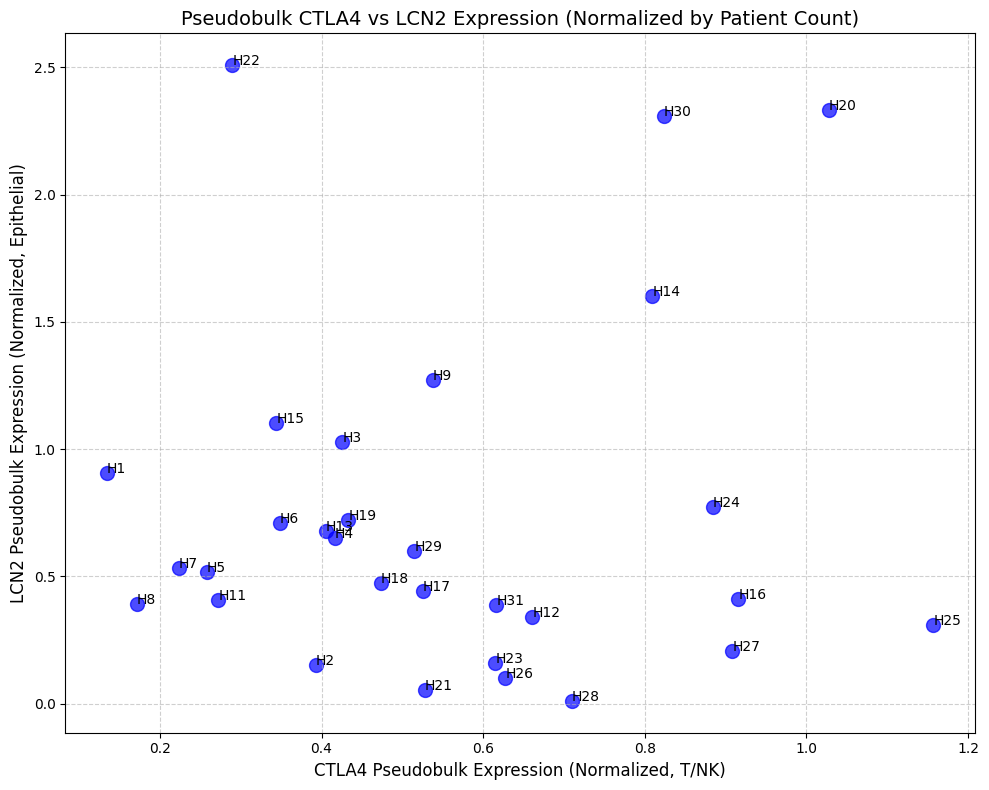

In [85]:
# 플롯
plt.figure(figsize=(10, 8))
for patient in pseudobulk_df.index:
    color = 'blue' if patient in highlighted_patients else 'blue'  # 환자에 따라 색상 설정
    plt.scatter(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        s=100, 
        c=color, 
        alpha=0.7,
        label=patient if color == 'red' else None  # 레전드 표시 (빨간색 환자만)
    )
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        patient, 
        fontsize=10
    )

# 제목 및 축 레이블 설정
plt.title("Pseudobulk CTLA4 vs LCN2 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized, T/NK)", fontsize=12)
plt.ylabel("LCN2 Pseudobulk Expression (Normalized, Epithelial)", fontsize=12)

# 그리드와 레전드 추가
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()

# 플롯 표시
plt.show()


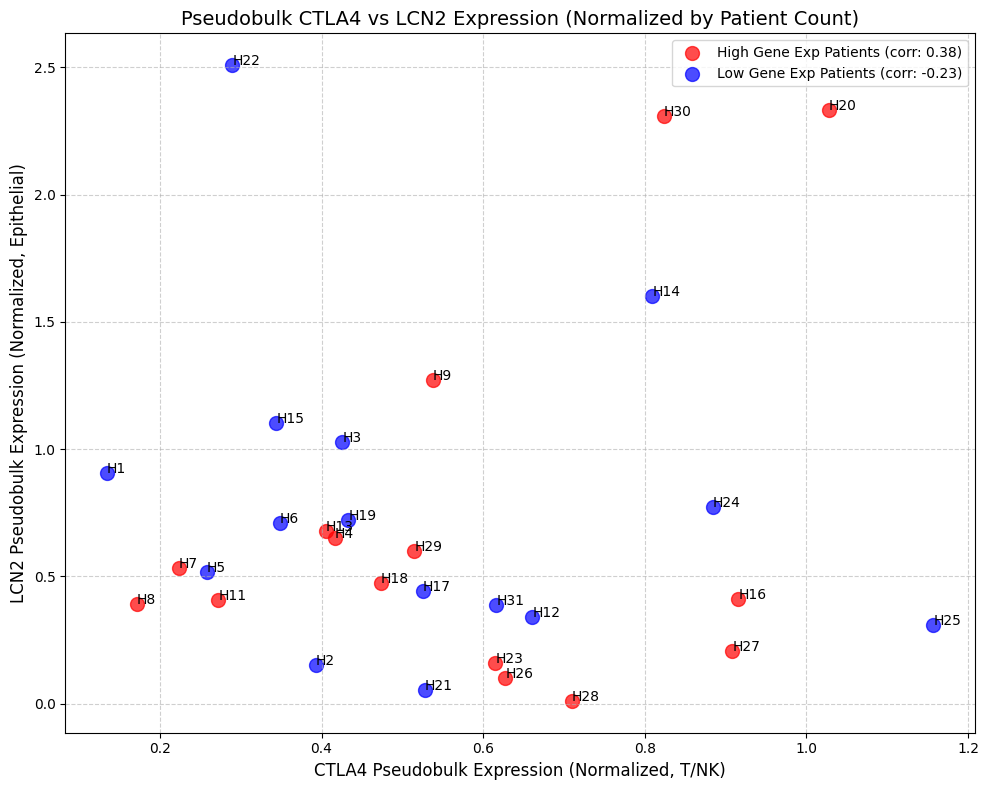

High gene Exp patient correlation: 0.38, p-value: 0.1570


In [92]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 빨간색으로 표시할 환자 목록
highlighted_patients = {'H11','H8','H18','H7','H29','H16','H4','H30','H13','H28','H27','H9','H26','H23','H20'}

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'T/NK']
    ctla4 = tnk_data[:, 'CTLA4'].X.flatten()  # CTLA4 값 추출
    tnk_count = tnk_data.shape[0]  # T/NK 세포 수

    # Epithelial 그룹에서 LCN2 발현 추출
    epithelial_data = patient_data[patient_data.obs['Annotation_total'] == 'Epithelial']
    lcn2 = epithelial_data[:, 'LCN2'].X.flatten()  # LCN2 값 추출
    epithelial_count = epithelial_data.shape[0]  # Epithelial 세포 수
    
    # Pseudobulk 합산 후 각 그룹 세포 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / tnk_count if tnk_count > 0 else 0
    pseudobulk_lcn2 = lcn2.sum() / epithelial_count if epithelial_count > 0 else 0
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'LCN2': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 빨간색과 파란색 데이터 분리
red_df = pseudobulk_df.loc[pseudobulk_df.index.intersection(highlighted_patients)]
blue_df = pseudobulk_df.loc[~pseudobulk_df.index.isin(highlighted_patients)]

# 상관 계수 계산
red_corr = np.corrcoef(red_df['CTLA4'], red_df['LCN2'])[0, 1] if not red_df.empty else np.nan
blue_corr = np.corrcoef(blue_df['CTLA4'], blue_df['LCN2'])[0, 1] if not blue_df.empty else np.nan

# 플롯
plt.figure(figsize=(10, 8))

# 빨간색 환자 플롯
plt.scatter(red_df['CTLA4'], red_df['LCN2'], s=100, c='red', alpha=0.7, label=f"High Gene Exp Patients (corr: {red_corr:.2f})")

# 파란색 환자 플롯
plt.scatter(blue_df['CTLA4'], blue_df['LCN2'], s=100, c='blue', alpha=0.7, label=f"Low Gene Exp Patients (corr: {blue_corr:.2f})")

# 환자 이름 표시
for patient in pseudobulk_df.index:
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        patient, 
        fontsize=10
    )

# 플롯 레이아웃 설정
plt.title("Pseudobulk CTLA4 vs LCN2 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized, T/NK)", fontsize=12)
plt.ylabel("LCN2 Pseudobulk Expression (Normalized, Epithelial)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

from scipy.stats import pearsonr

# 빨간색 환자의 상관계수 및 p-value 계산
if len(red_df) > 1:  # 데이터가 2개 이상 있어야 상관계수 계산 가능
    red_corr, red_pvalue = pearsonr(red_df['CTLA4'], red_df['LCN2'])
else:
    red_corr, red_pvalue = np.nan, np.nan

# 파란색 환자의 상관계수 및 p-value 계산
if len(blue_df) > 1:  # 데이터가 2개 이상 있어야 상관계수 계산 가능
    blue_corr, blue_pvalue = pearsonr(blue_df['CTLA4'], blue_df['LCN2'])
else:
    blue_corr, blue_pvalue = np.nan, np.nan

# 결과 출력
print(f"High gene Exp patient correlation: {red_corr:.2f}, p-value: {red_pvalue:.4f}")

In [109]:
from scipy.stats import pearsonr

# 전체 데이터 합치기
all_df = pd.concat([red_df, blue_df])

# 전체 상관계수 및 p-value 계산
if len(all_df) > 1:  # 데이터가 2개 이상 있어야 상관계수 계산 가능
    all_corr, all_pvalue = pearsonr(all_df['CTLA4'], all_df['LCN2'])
else:
    all_corr, all_pvalue = np.nan, np.nan

# 결과 출력
print(f"Overall correlation: {all_corr:.2f}, p-value: {all_pvalue:.4f}")


Overall correlation: 0.09, p-value: 0.6361


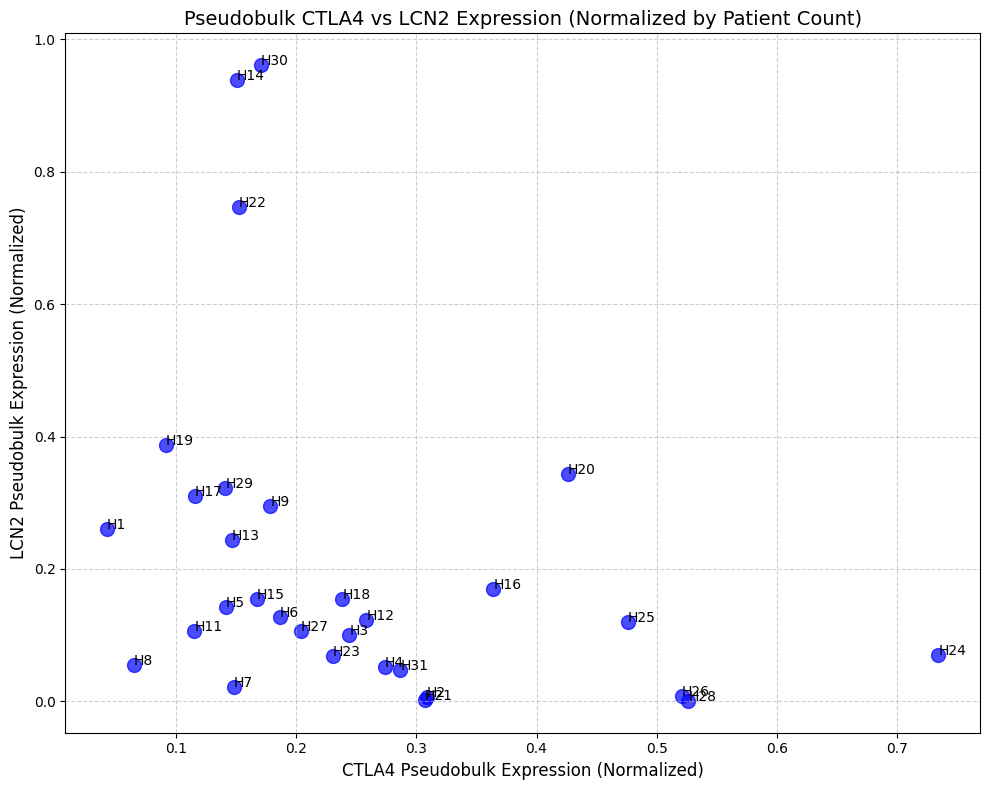

In [55]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()  # CTLA4를 ctla4 변수에 저장
    lcn2 = patient_data[:, 'LCN2'].X.flatten()    # LCN2를 lcn2 변수에 저장
    
    # 환자 수 계산
    patient_count = patient_data.shape[0]  # 해당 환자에 해당하는 세포 수
    
    # Pseudobulk 합산 후 환자 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / patient_count
    pseudobulk_lcn2 = lcn2.sum() / patient_count
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'LCN2': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['LCN2'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'LCN2'], patient, fontsize=10)

plt.title("Pseudobulk CTLA4 vs LCN2 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized)", fontsize=12)
plt.ylabel("LCN2 Pseudobulk Expression (Normalized)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


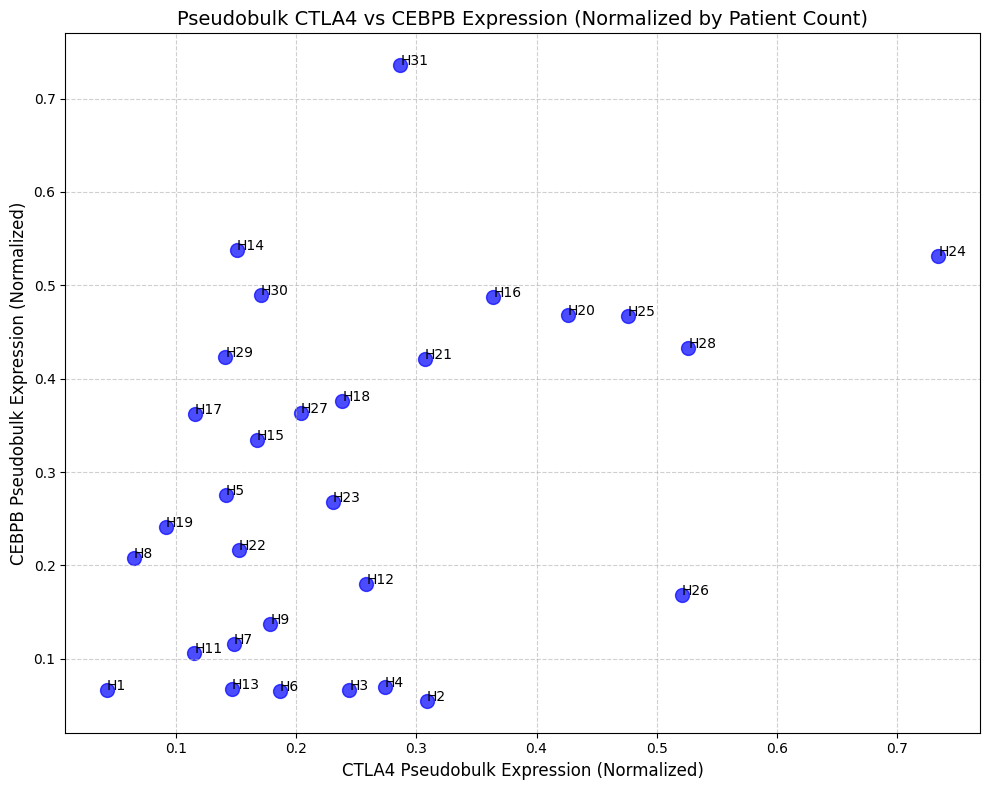

In [56]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    ctla4 = patient_data[:, 'CTLA4'].X.flatten()  # CTLA4를 ctla4 변수에 저장
    cebpb = patient_data[:, 'CEBPB'].X.flatten()  # CEBPB를 cebpb 변수에 저장
    
    # 환자 수 계산
    patient_count = patient_data.shape[0]  # 해당 환자에 해당하는 세포 수
    
    # Pseudobulk 합산 후 환자 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / patient_count
    pseudobulk_cebpb = cebpb.sum() / patient_count
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'CEBPB': pseudobulk_cebpb}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['CTLA4'], pseudobulk_df['CEBPB'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'CTLA4'], pseudobulk_df.loc[patient, 'CEBPB'], patient, fontsize=10)

plt.title("Pseudobulk CTLA4 vs CEBPB Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized)", fontsize=12)
plt.ylabel("CEBPB Pseudobulk Expression (Normalized)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


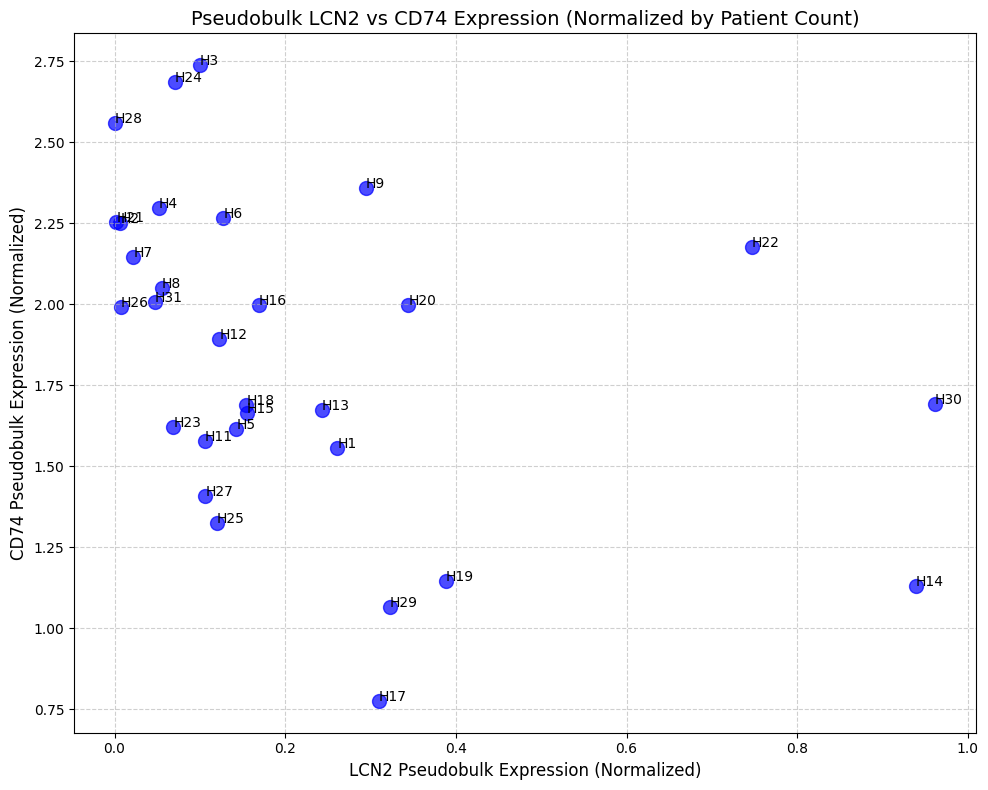

In [57]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    lcn2 = patient_data[:, 'LCN2'].X.flatten()  # LCN2를 lcn2 변수에 저장
    cd74 = patient_data[:, 'CD74'].X.flatten()  # CD74를 cd74 변수에 저장
    
    # 환자 수 계산
    patient_count = patient_data.shape[0]  # 해당 환자에 해당하는 세포 수
    
    # Pseudobulk 합산 후 환자 수로 나누기
    pseudobulk_lcn2 = lcn2.sum() / patient_count
    pseudobulk_cd74 = cd74.sum() / patient_count
    
    # 데이터 저장
    pseudobulk_data[patient] = {'LCN2': pseudobulk_lcn2, 'CD74': pseudobulk_cd74}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['LCN2'], pseudobulk_df['CD74'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'LCN2'], pseudobulk_df.loc[patient, 'CD74'], patient, fontsize=10)

plt.title("Pseudobulk LCN2 vs CD74 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression (Normalized)", fontsize=12)
plt.ylabel("CD74 Pseudobulk Expression (Normalized)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


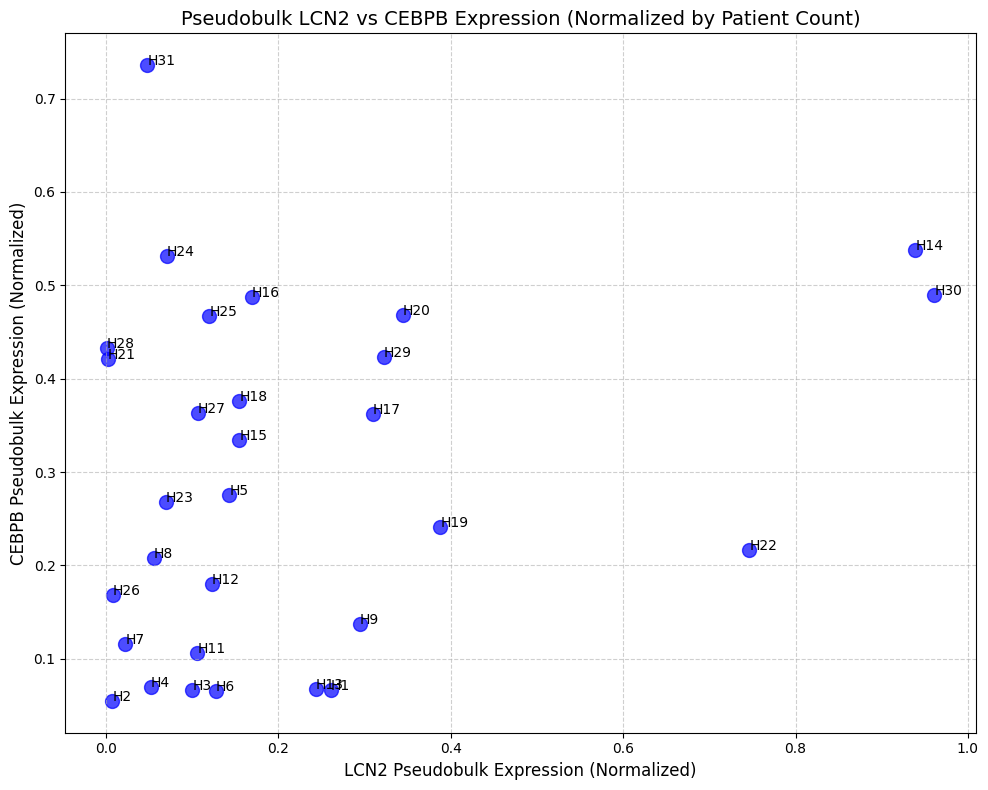

In [58]:
import matplotlib.pyplot as plt
import pandas as pd

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # 유전자 값 추출
    lcn2 = patient_data[:, 'LCN2'].X.flatten()  # LCN2를 lcn2 변수에 저장
    cebpb = patient_data[:, 'CEBPB'].X.flatten()  # CEBPB를 cebpb 변수에 저장
    
    # 환자 수 계산
    patient_count = patient_data.shape[0]  # 해당 환자에 해당하는 세포 수
    
    # Pseudobulk 합산 후 환자 수로 나누기
    pseudobulk_lcn2 = lcn2.sum() / patient_count
    pseudobulk_cebpb = cebpb.sum() / patient_count
    
    # 데이터 저장
    pseudobulk_data[patient] = {'LCN2': pseudobulk_lcn2, 'CEBPB': pseudobulk_cebpb}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 플롯
plt.figure(figsize=(10, 8))
plt.scatter(pseudobulk_df['LCN2'], pseudobulk_df['CEBPB'], s=100, c='blue', alpha=0.7)
for patient in pseudobulk_df.index:
    plt.text(pseudobulk_df.loc[patient, 'LCN2'], pseudobulk_df.loc[patient, 'CEBPB'], patient, fontsize=10)

plt.title("Pseudobulk LCN2 vs CEBPB Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("LCN2 Pseudobulk Expression (Normalized)", fontsize=12)
plt.ylabel("CEBPB Pseudobulk Expression (Normalized)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


/tmp/ipykernel_353118/1069513356.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  annotation_ratio = adata.obs.groupby('patients')['annotation'].value_counts(normalize=True).unstack(fill_value=0)


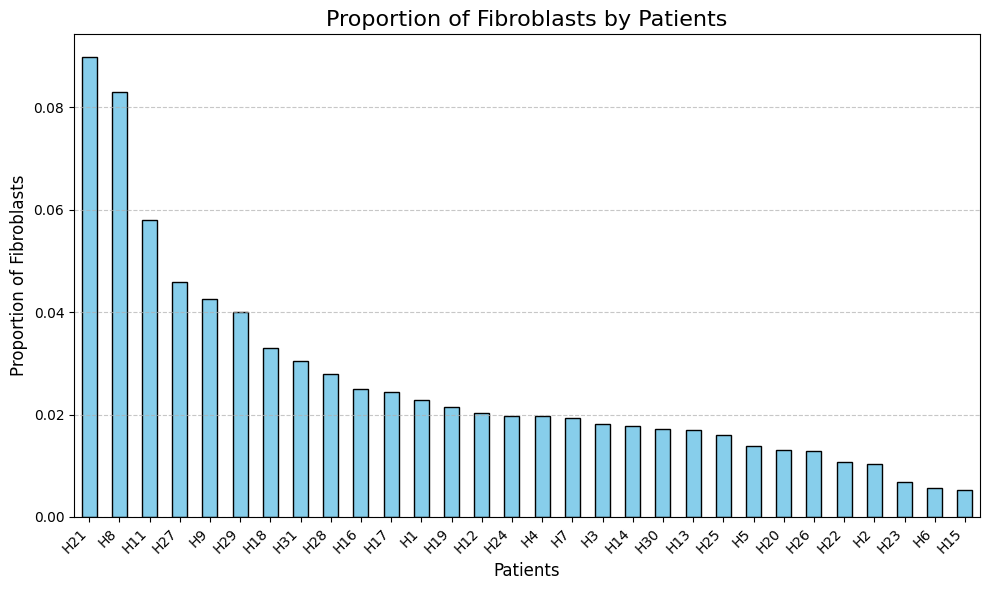

In [59]:
import matplotlib.pyplot as plt

# 각 patients 별 'annotation'의 비율 계산
annotation_ratio = adata.obs.groupby('patients')['annotation'].value_counts(normalize=True).unstack(fill_value=0)

# Fibroblasts 비율 추출 및 정렬
fibroblasts_ratio = annotation_ratio['Fibroblasts'].sort_values(ascending=False)

# 막대 그래프 그리기
plt.figure(figsize=(10, 6))
fibroblasts_ratio.plot(kind='bar', color='skyblue', edgecolor='black')

# 그래프 설정
plt.title('Proportion of Fibroblasts by Patients', fontsize=16)
plt.xlabel('Patients', fontsize=12)
plt.ylabel('Proportion of Fibroblasts', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()


In [60]:
adata

AnnData object with n_obs × n_vars = 99268 × 27873
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patients', 'MSS', 'KRAS', 'KRAS.mutation', 'Location', 'Stage', 'snv_sum', 'souporcell', 'frequency', 'TP53.mutation', 'CD74positive', 'CEBPBpositive', 'High.expansion', 'subclustering_CD8T', 'MHCpositive', 'Stage_T', 'stage_N', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.2', 'seurat_clusters', 'annotation', 'annotation_detail', 'annotation_proportion', 'MSI_Mut', 'TP53_Mut', 'RAS_Mut', 'TMB', 'CS_ratio', 'APC_Mut', 'annot_pseudo', 'patients_num', 'Annotation_total', 'Annotation_total_Tsub', 'Annotation_total_lv4', 'Annotation_total_Trough', 'annotation_tmp', 'Celltype_Fig1', 'Annotation_Fig1', 'Annotation_Fig1A', 'Annotation_tmp_fr', 'Annotation_cell2loc_onlyEpiT', 'Annotation_cell2loc', 'Annotation_cell2loc_onlyEpicebpbhl_T', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pc

/tmp/ipykernel_353118/2736325464.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()
/tmp/ipykernel_353118/2736325464.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].mean()


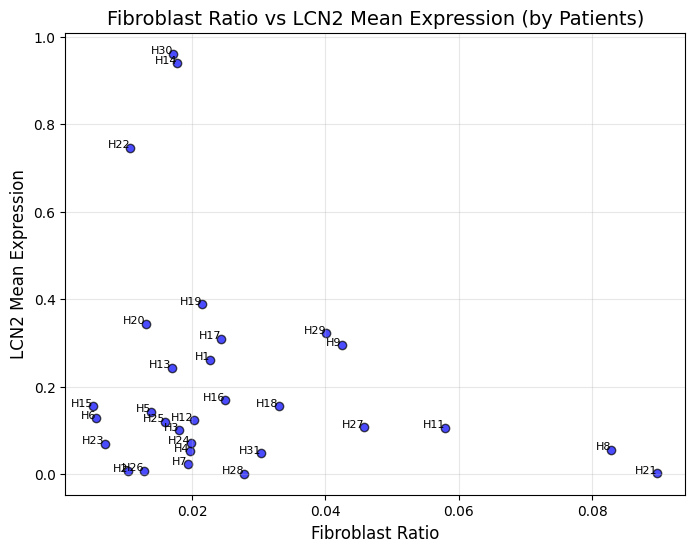

In [61]:
import matplotlib.pyplot as plt
import pandas as pd

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 Fibroblast 비율 계산
fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

# 환자별 LCN2 발현값 합 / 세포수 계산
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None
if lcn2_expression is not None:
    lcn2_mean_expression = pd.DataFrame({
        'patients': adata.obs['patients'],
        'LCN2_expression': lcn2_expression.flatten()
    }).groupby('patients')['LCN2_expression'].mean()

    # 데이터 정렬
    data = pd.DataFrame({
        'Fibroblast_Ratio': fibroblast_ratio,
        'LCN2_Mean_Expression': lcn2_mean_expression
    }).dropna()

    # Scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(data['Fibroblast_Ratio'], data['LCN2_Mean_Expression'], alpha=0.7, color='blue', edgecolor='k')

    # 각 점에 환자 이름 추가
    for patient, (x, y) in zip(data.index, zip(data['Fibroblast_Ratio'], data['LCN2_Mean_Expression'])):
        plt.text(x, y, patient, fontsize=8, ha='right')

    plt.title('Fibroblast Ratio vs LCN2 Mean Expression (by Patients)', fontsize=14)
    plt.xlabel('Fibroblast Ratio', fontsize=12)
    plt.ylabel('LCN2 Mean Expression', fontsize=12)
    plt.grid(alpha=0.3)
    plt.show()
else:
    print("LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/484010414.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()
/tmp/ipykernel_353118/484010414.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].sum()


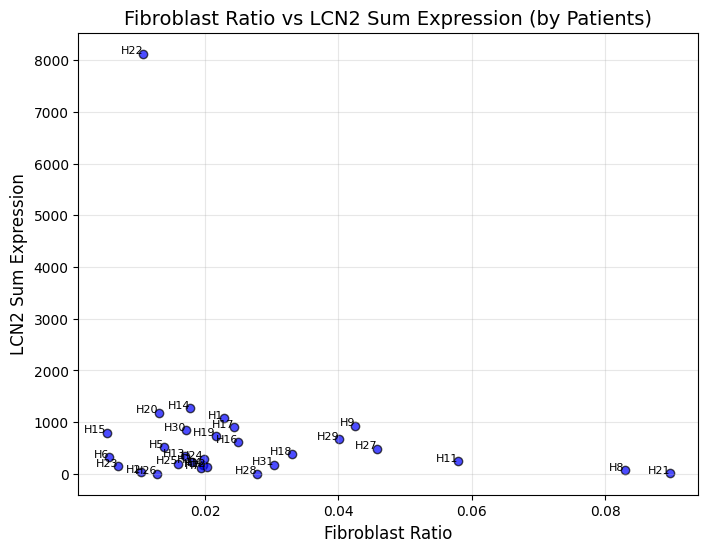

In [62]:
import matplotlib.pyplot as plt
import pandas as pd

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 Fibroblast 비율 계산
fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

# 환자별 LCN2 발현값 합 계산
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None
if lcn2_expression is not None:
    lcn2_sum_expression = pd.DataFrame({
        'patients': adata.obs['patients'],
        'LCN2_expression': lcn2_expression.flatten()
    }).groupby('patients')['LCN2_expression'].sum()

    # 데이터 정렬
    data = pd.DataFrame({
        'Fibroblast_Ratio': fibroblast_ratio,
        'LCN2_Sum_Expression': lcn2_sum_expression
    }).dropna()

    # Scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(data['Fibroblast_Ratio'], data['LCN2_Sum_Expression'], alpha=0.7, color='blue', edgecolor='k')

    # 각 점에 환자 이름 추가
    for patient, (x, y) in zip(data.index, zip(data['Fibroblast_Ratio'], data['LCN2_Sum_Expression'])):
        plt.text(x, y, patient, fontsize=8, ha='right')

    plt.title('Fibroblast Ratio vs LCN2 Sum Expression (by Patients)', fontsize=14)
    plt.xlabel('Fibroblast Ratio', fontsize=12)
    plt.ylabel('LCN2 Sum Expression', fontsize=12)
    plt.grid(alpha=0.3)
    plt.show()
else:
    print("LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/3498724283.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()


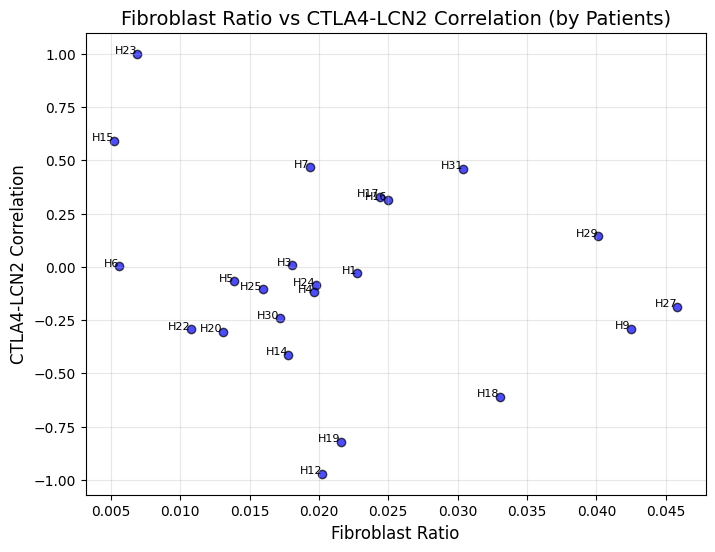

In [63]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 Fibroblast 비율 계산
fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

# CTLA4와 LCN2 상관계수 계산 함수
def calculate_correlation(adata, patient):
    subset = adata[adata.obs['patients'] == patient]
    if 'CTLA4' in subset.var_names and 'LCN2' in subset.var_names:
        ctla4_expression = subset[:, 'CTLA4'].X.flatten()
        lcn2_expression = subset[:, 'LCN2'].X.flatten()
        # Zero filtering
        valid_indices = (ctla4_expression > 0) & (lcn2_expression > 0)
        if valid_indices.sum() > 1:  # 최소 두 개의 값이 있어야 상관계수 계산 가능
            return np.corrcoef(ctla4_expression[valid_indices], lcn2_expression[valid_indices])[0, 1]
    return np.nan

# 환자별 CTLA4와 LCN2 상관계수 계산
correlation_data = {
    patient: calculate_correlation(adata, patient) for patient in adata.obs['patients'].unique()
}
correlation_series = pd.Series(correlation_data).dropna()

# 데이터 정렬
data = pd.DataFrame({
    'Fibroblast_Ratio': fibroblast_ratio,
    'CTLA4_LCN2_Correlation': correlation_series
}).dropna()

# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Correlation'], alpha=0.7, color='blue', edgecolor='k')

# 각 점에 환자 이름 추가
for patient, (x, y) in zip(data.index, zip(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Correlation'])):
    plt.text(x, y, patient, fontsize=8, ha='right')

plt.title('Fibroblast Ratio vs CTLA4-LCN2 Correlation (by Patients)', fontsize=14)
plt.xlabel('Fibroblast Ratio', fontsize=12)
plt.ylabel('CTLA4-LCN2 Correlation', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


/tmp/ipykernel_353118/1070501594.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()


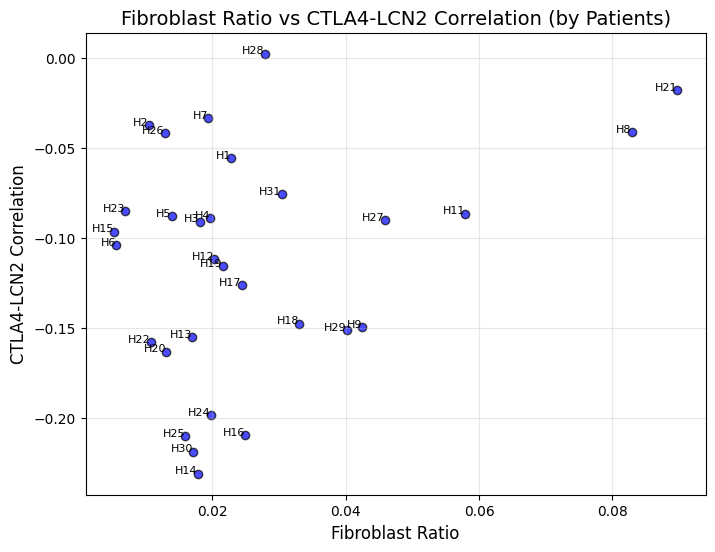

In [64]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 Fibroblast 비율 계산
fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

# CTLA4와 LCN2 상관계수 계산 함수
def calculate_correlation(adata, patient):
    subset = adata[adata.obs['patients'] == patient]
    if 'CTLA4' in subset.var_names and 'LCN2' in subset.var_names:
        ctla4_expression = subset[:, 'CTLA4'].X.flatten()
        lcn2_expression = subset[:, 'LCN2'].X.flatten()
        # Zero filtering 제거
        if len(ctla4_expression) > 1 and len(lcn2_expression) > 1:  # 최소 두 개의 값이 있어야 상관계수 계산 가능
            return np.corrcoef(ctla4_expression, lcn2_expression)[0, 1]
    return np.nan

# 환자별 CTLA4와 LCN2 상관계수 계산
correlation_data = {
    patient: calculate_correlation(adata, patient) for patient in adata.obs['patients'].unique()
}
correlation_series = pd.Series(correlation_data).dropna()

# 데이터 정렬
data = pd.DataFrame({
    'Fibroblast_Ratio': fibroblast_ratio,
    'CTLA4_LCN2_Correlation': correlation_series
}).dropna()

# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Correlation'], alpha=0.7, color='blue', edgecolor='k')

# 각 점에 환자 이름 추가
for patient, (x, y) in zip(data.index, zip(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Correlation'])):
    plt.text(x, y, patient, fontsize=8, ha='right')

plt.title('Fibroblast Ratio vs CTLA4-LCN2 Correlation (by Patients)', fontsize=14)
plt.xlabel('Fibroblast Ratio', fontsize=12)
plt.ylabel('CTLA4-LCN2 Correlation', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


/tmp/ipykernel_353118/650470317.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()
/tmp/ipykernel_353118/650470317.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['CTLA4_expression'].sum()
/tmp/ipykernel_353118/650470317.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].sum()


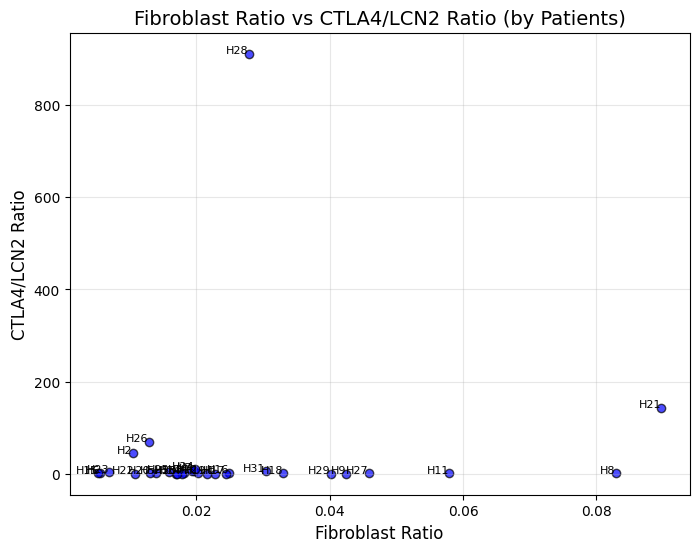

In [65]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 Fibroblast 비율 계산
fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

# CTLA4와 LCN2 발현값 합 계산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # 환자별 CTLA4 발현값 합 / LCN2 발현값 합 계산
    ctla4_sum = pd.DataFrame({
        'patients': adata.obs['patients'],
        'CTLA4_expression': ctla4_expression.flatten()
    }).groupby('patients')['CTLA4_expression'].sum()

    lcn2_sum = pd.DataFrame({
        'patients': adata.obs['patients'],
        'LCN2_expression': lcn2_expression.flatten()
    }).groupby('patients')['LCN2_expression'].sum()

    # CTLA4/LCN2 비율 계산
    ctla4_lcn2_ratio = ctla4_sum / lcn2_sum

    # 데이터 정렬
    data = pd.DataFrame({
        'Fibroblast_Ratio': fibroblast_ratio,
        'CTLA4_LCN2_Ratio': ctla4_lcn2_ratio
    }).dropna()

    # Scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Ratio'], alpha=0.7, color='blue', edgecolor='k')

    # 각 점에 환자 이름 추가
    for patient, (x, y) in zip(data.index, zip(data['Fibroblast_Ratio'], data['CTLA4_LCN2_Ratio'])):
        plt.text(x, y, patient, fontsize=8, ha='right')

    plt.title('Fibroblast Ratio vs CTLA4/LCN2 Ratio (by Patients)', fontsize=14)
    plt.xlabel('Fibroblast Ratio', fontsize=12)
    plt.ylabel('CTLA4/LCN2 Ratio', fontsize=12)
    plt.grid(alpha=0.3)
    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/2800597443.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['CTLA4_expression'].sum()
/tmp/ipykernel_353118/2800597443.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].sum()
/tmp/ipykernel_353118/2800597443.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mea

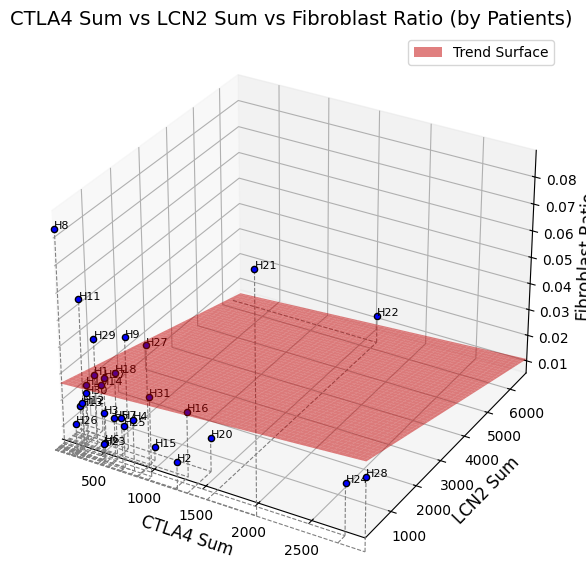

In [66]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# CTLA4 및 LCN2 발현값 조건에 맞게 합산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # CTLA4 발현값 합을 T/NK annotation에 대해서만 계산
    ctla4_tnk_data = adata[adata.obs['annotation'].isin(['T/NK'])]
    ctla4_sum = pd.DataFrame({
        'patients': ctla4_tnk_data.obs['patients'],
        'CTLA4_expression': ctla4_tnk_data.X[:, np.where(adata.var_names == 'CTLA4')[0][0]].flatten()
    }).groupby('patients')['CTLA4_expression'].sum()

    # LCN2 발현값 합을 Epithelial annotation에 대해서만 계산
    lcn2_epithelial_data = adata[adata.obs['annotation'] == 'Epithelial']
    lcn2_sum = pd.DataFrame({
        'patients': lcn2_epithelial_data.obs['patients'],
        'LCN2_expression': lcn2_epithelial_data.X[:, np.where(adata.var_names == 'LCN2')[0][0]].flatten()
    }).groupby('patients')['LCN2_expression'].sum()

    # 환자별 Fibroblast 비율 계산
    fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

    # 데이터 정렬
    data = pd.DataFrame({
        'CTLA4_Sum': ctla4_sum,
        'LCN2_Sum': lcn2_sum,
        'Fibroblast_Ratio': fibroblast_ratio
    }).dropna()

    # 3D Scatter plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 각 점에 대해 보조선 추가
    for patient, (x, y, z) in zip(data.index, zip(data['CTLA4_Sum'], data['LCN2_Sum'], data['Fibroblast_Ratio'])):
        # 보조선 추가 (X-Y 평면)
        ax.plot([x, x], [y, y], [0, z], color='gray', linestyle='--', linewidth=0.8)
        ax.plot([x, x], [0, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # X축 보조선
        ax.plot([0, x], [y, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # Y축 보조선

        # 데이터 점 추가
        ax.scatter(x, y, z, color='b', edgecolor='k')

        # 각 점에 환자 이름 추가
        ax.text(x, y, z, patient, fontsize=8)

    # 회귀선 추가 (3D 다항 회귀)
    x_data = data['CTLA4_Sum'].values
    y_data = data['LCN2_Sum'].values
    z_data = data['Fibroblast_Ratio'].values

    # 3D 회귀 모델 생성 (다항식 피팅)
    A = np.c_[x_data, y_data, np.ones_like(x_data)]  # X, Y 데이터
    coeffs = np.linalg.lstsq(A, z_data, rcond=None)[0]  # 회귀 계수 계산

    # 회귀선 계산
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = np.linspace(y_data.min(), y_data.max(), 100)
    X_line, Y_line = np.meshgrid(x_line, y_line)
    Z_line = coeffs[0] * X_line + coeffs[1] * Y_line + coeffs[2]

    # 추세선(회귀선) 그리기
    ax.plot_surface(X_line, Y_line, Z_line, color='r', alpha=0.5, label='Trend Surface')

    # X, Y, Z 축의 범위 설정
    ax.set_xlim(data['CTLA4_Sum'].min(), data['CTLA4_Sum'].max())
    ax.set_ylim(data['LCN2_Sum'].min(), data['LCN2_Sum'].max())
    ax.set_zlim(data['Fibroblast_Ratio'].min(), data['Fibroblast_Ratio'].max())

    # 제목 및 축 라벨 설정
    ax.set_title('CTLA4 Sum vs LCN2 Sum vs Fibroblast Ratio (by Patients)', fontsize=14)
    ax.set_xlabel('CTLA4 Sum', fontsize=12)
    ax.set_ylabel('LCN2 Sum', fontsize=12)
    ax.set_zlabel('Fibroblast Ratio', fontsize=12)

    # 범례 추가
    ax.legend()

    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/2033238704.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['CTLA4_expression'].mean()
/tmp/ipykernel_353118/2033238704.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].mean()
/tmp/ipykernel_353118/2033238704.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].m

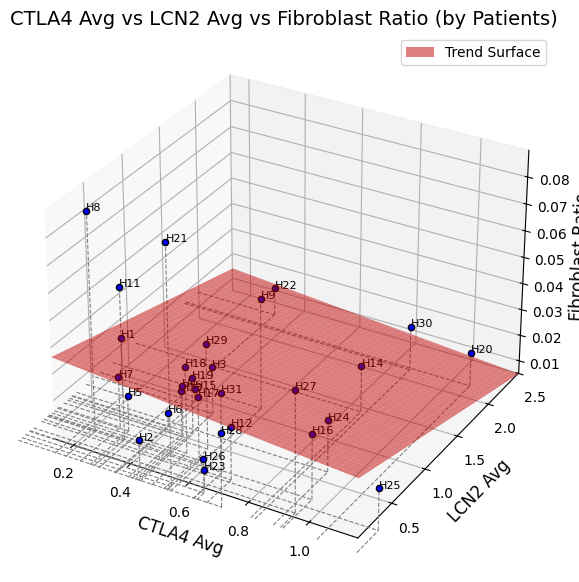

In [67]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# CTLA4 및 LCN2 발현값 조건에 맞게 평균 계산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # CTLA4 발현값 평균을 T/NK annotation에 대해서만 계산
    ctla4_tnk_data = adata[adata.obs['annotation'].isin(['T/NK'])]
    ctla4_avg = pd.DataFrame({
        'patients': ctla4_tnk_data.obs['patients'],
        'CTLA4_expression': ctla4_tnk_data.X[:, np.where(adata.var_names == 'CTLA4')[0][0]].flatten()
    }).groupby('patients')['CTLA4_expression'].mean()

    # LCN2 발현값 평균을 Epithelial annotation에 대해서만 계산
    lcn2_epithelial_data = adata[adata.obs['annotation'] == 'Epithelial']
    lcn2_avg = pd.DataFrame({
        'patients': lcn2_epithelial_data.obs['patients'],
        'LCN2_expression': lcn2_epithelial_data.X[:, np.where(adata.var_names == 'LCN2')[0][0]].flatten()
    }).groupby('patients')['LCN2_expression'].mean()

    # 환자별 Fibroblast 비율 계산
    fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

    # 데이터 정렬
    data = pd.DataFrame({
        'CTLA4_Avg': ctla4_avg,
        'LCN2_Avg': lcn2_avg,
        'Fibroblast_Ratio': fibroblast_ratio
    }).dropna()

    # 3D Scatter plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 각 점에 대해 보조선 추가
    for patient, (x, y, z) in zip(data.index, zip(data['CTLA4_Avg'], data['LCN2_Avg'], data['Fibroblast_Ratio'])):
        # 보조선 추가 (X-Y 평면)
        ax.plot([x, x], [y, y], [0, z], color='gray', linestyle='--', linewidth=0.8)
        ax.plot([x, x], [0, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # X축 보조선
        ax.plot([0, x], [y, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # Y축 보조선

        # 데이터 점 추가
        ax.scatter(x, y, z, color='b', edgecolor='k')

        # 각 점에 환자 이름 추가
        ax.text(x, y, z, patient, fontsize=8)

    # 회귀선 추가 (3D 다항 회귀)
    x_data = data['CTLA4_Avg'].values
    y_data = data['LCN2_Avg'].values
    z_data = data['Fibroblast_Ratio'].values

    # 3D 회귀 모델 생성 (다항식 피팅)
    A = np.c_[x_data, y_data, np.ones_like(x_data)]  # X, Y 데이터
    coeffs = np.linalg.lstsq(A, z_data, rcond=None)[0]  # 회귀 계수 계산

    # 회귀선 계산
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = np.linspace(y_data.min(), y_data.max(), 100)
    X_line, Y_line = np.meshgrid(x_line, y_line)
    Z_line = coeffs[0] * X_line + coeffs[1] * Y_line + coeffs[2]

    # 추세선(회귀선) 그리기
    ax.plot_surface(X_line, Y_line, Z_line, color='r', alpha=0.5, label='Trend Surface')

    # X, Y, Z 축의 범위 설정
    ax.set_xlim(data['CTLA4_Avg'].min(), data['CTLA4_Avg'].max())
    ax.set_ylim(data['LCN2_Avg'].min(), data['LCN2_Avg'].max())
    ax.set_zlim(data['Fibroblast_Ratio'].min(), data['Fibroblast_Ratio'].max())

    # 제목 및 축 라벨 설정
    ax.set_title('CTLA4 Avg vs LCN2 Avg vs Fibroblast Ratio (by Patients)', fontsize=14)
    ax.set_xlabel('CTLA4 Avg', fontsize=12)
    ax.set_ylabel('LCN2 Avg', fontsize=12)
    ax.set_zlabel('Fibroblast Ratio', fontsize=12)

    # 범례 추가
    ax.legend()

    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/1650945035.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['CTLA4_expression'].mean()
/tmp/ipykernel_353118/1650945035.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].mean()
/tmp/ipykernel_353118/1650945035.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].m

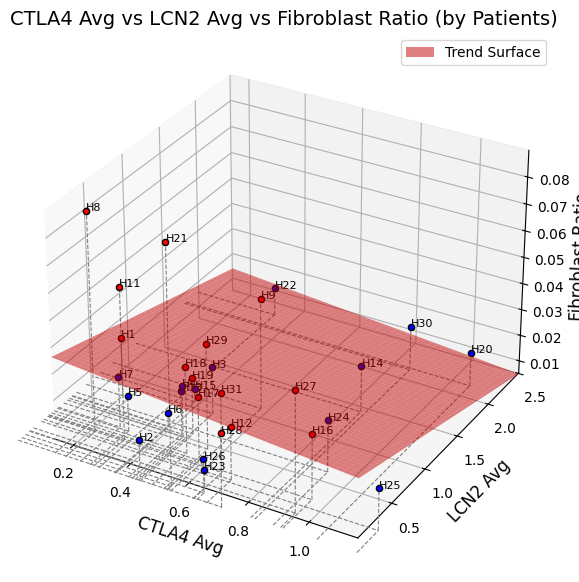

In [68]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 특정 환자 목록
selected_patients = ["H21", "H8", "H11", "H27", "H9", "H29", "H18", "H31", "H28", "H16", "H17", "H1", "H19", "H12"]

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# CTLA4 및 LCN2 발현값 조건에 맞게 평균 계산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # CTLA4 발현값 평균을 T/NK annotation에 대해서만 계산
    ctla4_tnk_data = adata[adata.obs['annotation'].isin(['T/NK'])]
    ctla4_avg = pd.DataFrame({
        'patients': ctla4_tnk_data.obs['patients'],
        'CTLA4_expression': ctla4_tnk_data.X[:, np.where(adata.var_names == 'CTLA4')[0][0]].flatten()
    }).groupby('patients')['CTLA4_expression'].mean()

    # LCN2 발현값 평균을 Epithelial annotation에 대해서만 계산
    lcn2_epithelial_data = adata[adata.obs['annotation'] == 'Epithelial']
    lcn2_avg = pd.DataFrame({
        'patients': lcn2_epithelial_data.obs['patients'],
        'LCN2_expression': lcn2_epithelial_data.X[:, np.where(adata.var_names == 'LCN2')[0][0]].flatten()
    }).groupby('patients')['LCN2_expression'].mean()

    # 환자별 Fibroblast 비율 계산
    fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

    # 데이터 정렬
    data = pd.DataFrame({
        'CTLA4_Avg': ctla4_avg,
        'LCN2_Avg': lcn2_avg,
        'Fibroblast_Ratio': fibroblast_ratio
    }).dropna()

    # 3D Scatter plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 각 점에 대해 보조선 추가
    for patient, (x, y, z) in zip(data.index, zip(data['CTLA4_Avg'], data['LCN2_Avg'], data['Fibroblast_Ratio'])):
        # 보조선 추가 (X-Y 평면)
        ax.plot([x, x], [y, y], [0, z], color='gray', linestyle='--', linewidth=0.8)
        ax.plot([x, x], [0, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # X축 보조선
        ax.plot([0, x], [y, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # Y축 보조선

        # 데이터 점 추가 (색깔 구분)
        if patient in selected_patients:
            ax.scatter(x, y, z, color='r', edgecolor='k')  # 빨간색
        else:
            ax.scatter(x, y, z, color='b', edgecolor='k')  # 파란색

        # 각 점에 환자 이름 추가
        ax.text(x, y, z, patient, fontsize=8)

    # 회귀선 추가 (3D 다항 회귀)
    x_data = data['CTLA4_Avg'].values
    y_data = data['LCN2_Avg'].values
    z_data = data['Fibroblast_Ratio'].values

    # 3D 회귀 모델 생성 (다항식 피팅)
    A = np.c_[x_data, y_data, np.ones_like(x_data)]  # X, Y 데이터
    coeffs = np.linalg.lstsq(A, z_data, rcond=None)[0]  # 회귀 계수 계산

    # 회귀선 계산
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = np.linspace(y_data.min(), y_data.max(), 100)
    X_line, Y_line = np.meshgrid(x_line, y_line)
    Z_line = coeffs[0] * X_line + coeffs[1] * Y_line + coeffs[2]

    # 추세선(회귀선) 그리기
    ax.plot_surface(X_line, Y_line, Z_line, color='r', alpha=0.5, label='Trend Surface')

    # X, Y, Z 축의 범위 설정
    ax.set_xlim(data['CTLA4_Avg'].min(), data['CTLA4_Avg'].max())
    ax.set_ylim(data['LCN2_Avg'].min(), data['LCN2_Avg'].max())
    ax.set_zlim(data['Fibroblast_Ratio'].min(), data['Fibroblast_Ratio'].max())

    # 제목 및 축 라벨 설정
    ax.set_title('CTLA4 Avg vs LCN2 Avg vs Fibroblast Ratio (by Patients)', fontsize=14)
    ax.set_xlabel('CTLA4 Avg', fontsize=12)
    ax.set_ylabel('LCN2 Avg', fontsize=12)
    ax.set_zlabel('Fibroblast Ratio', fontsize=12)

    # 범례 추가
    ax.legend()

    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/1940714010.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_counts_per_patient = fibroblast_data.obs.groupby('patients').size()
/tmp/ipykernel_353118/1940714010.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_sum_avg = fibroblast_data.obs.groupby('patients')['gene_sum'].mean()
/tmp/ipykernel_353118/1940714010.py:40: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patient

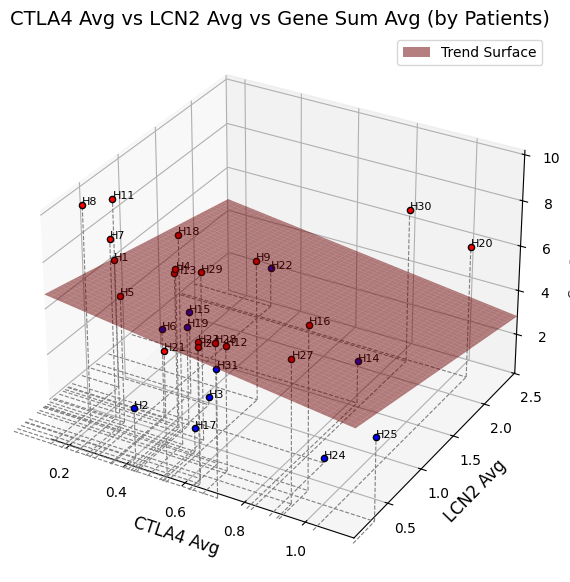

In [69]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 특정 환자 목록
selected_patients = ["H11", "H8", "H18", "H7", "H29", "H16", "H4", "H30", "H13", "H28", "H27", "H9", "H26", "H23", "H20", "H1", "H5", "H21", "H12"]

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# COL3A1, COL1A1, COL1A2 발현값 계산 (Fibroblasts 세포에 대해서만)
fibroblast_data = adata[adata.obs['annotation'] == 'Fibroblasts'].copy()
gene_list = ['COL3A1', 'COL1A1', 'COL1A2']

# 각 유전자에 대해 평균 발현량 계산
gene_expression = {gene: fibroblast_data.X[:, np.where(adata.var_names == gene)[0][0]].flatten() for gene in gene_list}

# 환자별 세포 수 계산
cell_counts_per_patient = fibroblast_data.obs.groupby('patients').size()

# 환자별 3개의 유전자 발현값 합계 계산
fibroblast_data.obs['gene_sum'] = (
    gene_expression['COL3A1'] + gene_expression['COL1A1'] + gene_expression['COL1A2']
)

# 각 환자별 평균 발현값 합계 계산
gene_sum_avg = fibroblast_data.obs.groupby('patients')['gene_sum'].mean()

# CTLA4 및 LCN2 발현값 조건에 맞게 평균 계산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # CTLA4 발현값 평균을 T/NK annotation에 대해서만 계산
    ctla4_tnk_data = adata[adata.obs['annotation'].isin(['T/NK'])]
    ctla4_avg = pd.DataFrame({
        'patients': ctla4_tnk_data.obs['patients'],
        'CTLA4_expression': ctla4_tnk_data.X[:, np.where(adata.var_names == 'CTLA4')[0][0]].flatten()
    }).groupby('patients')['CTLA4_expression'].mean()

    # LCN2 발현값 평균을 Epithelial annotation에 대해서만 계산
    lcn2_epithelial_data = adata[adata.obs['annotation'] == 'Epithelial']
    lcn2_avg = pd.DataFrame({
        'patients': lcn2_epithelial_data.obs['patients'],
        'LCN2_expression': lcn2_epithelial_data.X[:, np.where(adata.var_names == 'LCN2')[0][0]].flatten()
    }).groupby('patients')['LCN2_expression'].mean()

    # 환자별 데이터 정렬
    data = pd.DataFrame({
        'CTLA4_Avg': ctla4_avg,
        'LCN2_Avg': lcn2_avg,
        'Gene_Sum_Avg': gene_sum_avg
    }).dropna()

    # 3D Scatter plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 각 점에 대해 보조선 추가
    for patient, (x, y, z) in zip(data.index, zip(data['CTLA4_Avg'], data['LCN2_Avg'], data['Gene_Sum_Avg'])):
        # 보조선 추가 (X-Y 평면)
        ax.plot([x, x], [y, y], [0, z], color='gray', linestyle='--', linewidth=0.8)
        ax.plot([x, x], [0, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # X축 보조선
        ax.plot([0, x], [y, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # Y축 보조선

        # 데이터 점 추가 (색깔 구분)
        if patient in selected_patients:
            ax.scatter(x, y, z, color='r', edgecolor='k')  # 빨간색
        else:
            ax.scatter(x, y, z, color='b', edgecolor='k')  # 파란색

        # 각 점에 환자 이름 추가
        ax.text(x, y, z, patient, fontsize=8)

    # 회귀선 추가 (3D 다항 회귀)
    x_data = data['CTLA4_Avg'].values
    y_data = data['LCN2_Avg'].values
    z_data = data['Gene_Sum_Avg'].values

    # 3D 회귀 모델 생성 (다항식 피팅)
    A = np.c_[x_data, y_data, np.ones_like(x_data)]  # X, Y 데이터
    coeffs = np.linalg.lstsq(A, z_data, rcond=None)[0]  # 회귀 계수 계산

    # 회귀선 계산
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = np.linspace(y_data.min(), y_data.max(), 100)
    X_line, Y_line = np.meshgrid(x_line, y_line)
    Z_line = coeffs[0] * X_line + coeffs[1] * Y_line + coeffs[2]

    # 추세선(회귀선) 그리기
    ax.plot_surface(X_line, Y_line, Z_line, color='r', alpha=0.5, label='Trend Surface')

    # X, Y, Z 축의 범위 설정
    ax.set_xlim(data['CTLA4_Avg'].min(), data['CTLA4_Avg'].max())
    ax.set_ylim(data['LCN2_Avg'].min(), data['LCN2_Avg'].max())
    ax.set_zlim(data['Gene_Sum_Avg'].min(), data['Gene_Sum_Avg'].max())

    # 제목 및 축 라벨 설정
    ax.set_title('CTLA4 Avg vs LCN2 Avg vs Gene Sum Avg (by Patients)', fontsize=14)
    ax.set_xlabel('CTLA4 Avg', fontsize=12)
    ax.set_ylabel('LCN2 Avg', fontsize=12)
    ax.set_zlabel('Gene Sum Avg', fontsize=8)

    # 범례 추가
    ax.legend()

    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


/tmp/ipykernel_353118/4218521781.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_counts = adata.obs.groupby('patients').size()
/tmp/ipykernel_353118/4218521781.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['CTLA4_expression'].sum() / cell_counts
/tmp/ipykernel_353118/4218521781.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  }).groupby('patients')['LCN2_expression'].sum() / ce

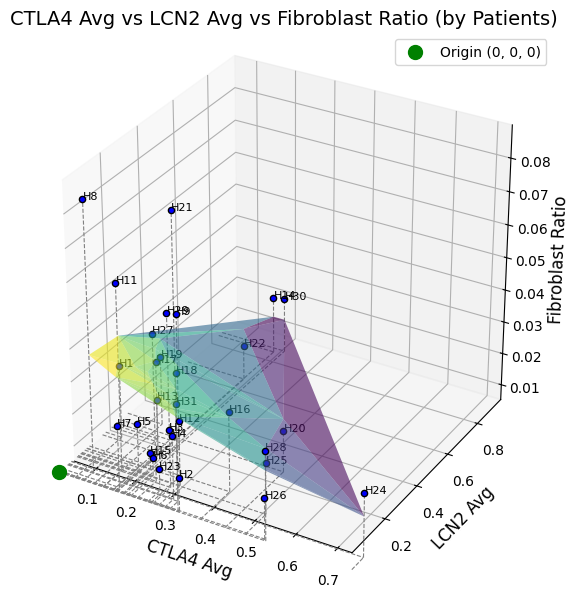

In [70]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LinearRegression

# Fibroblast 여부를 판별하는 컬럼 추가
adata.obs['is_fibroblast'] = adata.obs['annotation'] == 'Fibroblasts'

# 환자별 CTLA4 발현값과 LCN2 발현값을 세포 수로 나눈 평균 계산
ctla4_expression = adata[:, 'CTLA4'].X if 'CTLA4' in adata.var_names else None
lcn2_expression = adata[:, 'LCN2'].X if 'LCN2' in adata.var_names else None

if ctla4_expression is not None and lcn2_expression is not None:
    # 환자별 세포 수 계산
    cell_counts = adata.obs.groupby('patients').size()

    # 환자별 CTLA4 발현값 합 계산 후 세포 수로 나누어 평균 계산
    ctla4_avg = pd.DataFrame({
        'patients': adata.obs['patients'],
        'CTLA4_expression': ctla4_expression.flatten()
    }).groupby('patients')['CTLA4_expression'].sum() / cell_counts

    # 환자별 LCN2 발현값 합 계산 후 세포 수로 나누어 평균 계산
    lcn2_avg = pd.DataFrame({
        'patients': adata.obs['patients'],
        'LCN2_expression': lcn2_expression.flatten()
    }).groupby('patients')['LCN2_expression'].sum() / cell_counts

    # 환자별 Fibroblast 비율 계산
    fibroblast_ratio = adata.obs.groupby('patients')['is_fibroblast'].mean()

    # 데이터 정렬
    data = pd.DataFrame({
        'CTLA4_Avg': ctla4_avg,
        'LCN2_Avg': lcn2_avg,
        'Fibroblast_Ratio': fibroblast_ratio
    }).dropna()

    # X, Y, Z 축의 최소값과 최대값 계산
    x_min, x_max = data['CTLA4_Avg'].min(), data['CTLA4_Avg'].max()
    y_min, y_max = data['LCN2_Avg'].min(), data['LCN2_Avg'].max()
    z_min, z_max = data['Fibroblast_Ratio'].min(), data['Fibroblast_Ratio'].max()

    # 3D Scatter plot
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # 각 점에 대해 보조선 추가
    for patient, (x, y, z) in zip(data.index, zip(data['CTLA4_Avg'], data['LCN2_Avg'], data['Fibroblast_Ratio'])):
        # 보조선 추가 (X-Y 평면)
        ax.plot([x, x], [y, y], [0, z], color='gray', linestyle='--', linewidth=0.8)
        ax.plot([x, x], [0, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # X축 보조선
        ax.plot([0, x], [y, y], [0, 0], color='gray', linestyle='--', linewidth=0.8)  # Y축 보조선

        # 데이터 점 추가
        ax.scatter(x, y, z, color='b', edgecolor='k')

        # 각 점에 환자 이름 추가
        ax.text(x, y, z, patient, fontsize=8)

    # 추세선 추가 (선형 회귀 모델)
    X = data[['CTLA4_Avg', 'LCN2_Avg']].values
    y = data['Fibroblast_Ratio'].values

    # 선형 회귀 모델 학습
    reg = LinearRegression().fit(X, y)

    # 예측값 계산
    y_pred = reg.predict(X)

    # 3D 추세선 그리기
    ax.plot_trisurf(data['CTLA4_Avg'], data['LCN2_Avg'], y_pred, cmap='viridis', alpha=0.6)

    # X, Y, Z 축의 범위 설정
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_zlim(z_min, z_max)

    # X, Y, Z 축의 0점을 초록색으로 표시
    ax.scatter(0, 0, 0, color='green', s=100, label='Origin (0, 0, 0)')  # 0점 강조

    # 제목 및 축 라벨 설정
    ax.set_title('CTLA4 Avg vs LCN2 Avg vs Fibroblast Ratio (by Patients)', fontsize=14)
    ax.set_xlabel('CTLA4 Avg', fontsize=12)
    ax.set_ylabel('LCN2 Avg', fontsize=12)
    ax.set_zlabel('Fibroblast Ratio', fontsize=12)

    # 비율 조정
    max_range = max(x_max - x_min, y_max - y_min, z_max - z_min)
    ax.set_box_aspect([max_range, max_range, max_range])  # x:y:z 비율 동일

    # 범례 추가
    ax.legend()

    plt.show()

else:
    print("CTLA4 or LCN2 gene is not found in the dataset.")


<Figure size 1000x600 with 0 Axes>

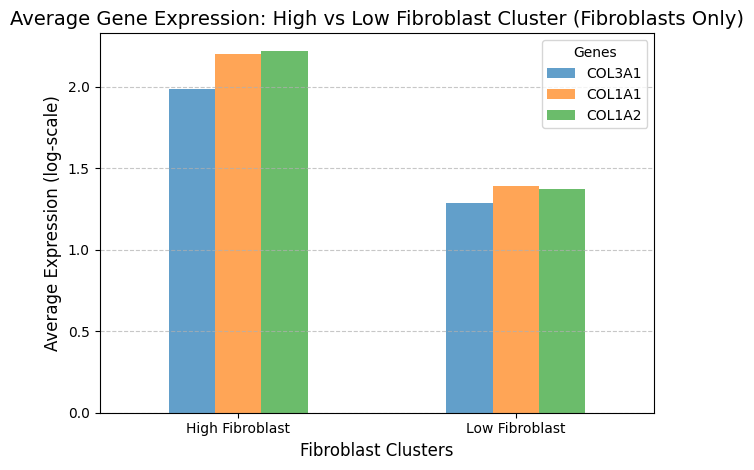

High Fibroblast Cluster Average Expression (Fibroblasts Only):
COL3A1     1.988212281508389
COL1A1    2.2003549329759373
COL1A2    2.2159417986555128
dtype: object

Low Fibroblast Cluster Average Expression (Fibroblasts Only):
COL3A1    1.2854971428359994
COL1A1     1.388064796484219
COL1A2    1.3749778066723155
dtype: object


In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# High Fibroblast 클러스터 정의
high_fibroblast_patients = {"H21", "H8", "H11", "H27", "H9", "H29", "H18", "H31", "H28", "H16", "H17", "H1", "H19", "H12"}

# 유전자 목록
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 유전자 이름 -> index 매핑
gene_indices = {gene: np.where(adata.var_names == gene)[0][0] for gene in genes_of_interest}

# 각 클러스터에 속한 Fibroblast 세포 필터링
high_fibroblast_data = adata[(adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]
low_fibroblast_data = adata[(~adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]

# 평균 발현량 계산
high_mean_expression = {gene: high_fibroblast_data.X[:, idx].mean() for gene, idx in gene_indices.items()}
low_mean_expression = {gene: low_fibroblast_data.X[:, idx].mean() for gene, idx in gene_indices.items()}

# 데이터프레임 생성 (숫자 데이터만 포함)
expression_df = pd.DataFrame({
    'High Fibroblast': high_mean_expression,
    'Low Fibroblast': low_mean_expression
}).astype(float).T  # DataFrame 값을 float 형식으로 변환

# 그래프 그리기
plt.figure(figsize=(10, 6))
expression_df.plot(kind='bar', alpha=0.7)
plt.title('Average Gene Expression: High vs Low Fibroblast Cluster (Fibroblasts Only)', fontsize=14)
plt.ylabel('Average Expression (log-scale)', fontsize=12)
plt.xlabel('Fibroblast Clusters', fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Genes', fontsize=10)
plt.tight_layout()
plt.show()

# 결과 출력
print("High Fibroblast Cluster Average Expression (Fibroblasts Only):")
print(pd.Series(high_mean_expression))

print("\nLow Fibroblast Cluster Average Expression (Fibroblasts Only):")
print(pd.Series(low_mean_expression))


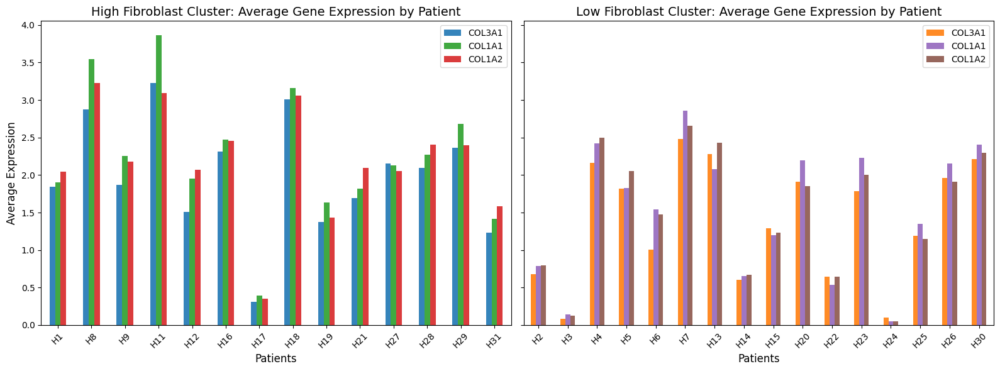

In [72]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# High Fibroblast 클러스터 정의
high_fibroblast_patients = {"H21", "H8", "H11", "H27", "H9", "H29", "H18", "H31", "H28", "H16", "H17", "H1", "H19", "H12"}

# 유전자 목록
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 유전자 이름 -> index 매핑
gene_indices = {gene: np.where(adata.var_names == gene)[0][0] for gene in genes_of_interest}

# High 및 Low Fibroblast 환자 데이터 나누기
high_fibroblast_data = adata[(adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]
low_fibroblast_data = adata[(~adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]

# High Fibroblast 클러스터 평균 발현량 계산
high_expression = {}
for patient in high_fibroblast_data.obs['patients'].unique():
    patient_data = high_fibroblast_data[high_fibroblast_data.obs['patients'] == patient]
    high_expression[patient] = {gene: patient_data.X[:, idx].mean() for gene, idx in gene_indices.items()}

# Low Fibroblast 클러스터 평균 발현량 계산
low_expression = {}
for patient in low_fibroblast_data.obs['patients'].unique():
    patient_data = low_fibroblast_data[low_fibroblast_data.obs['patients'] == patient]
    low_expression[patient] = {gene: patient_data.X[:, idx].mean() for gene, idx in gene_indices.items()}

# DataFrame 생성
high_expression_df = pd.DataFrame.from_dict(high_expression, orient='index')
low_expression_df = pd.DataFrame.from_dict(low_expression, orient='index')

# NaN 값 처리 및 데이터 타입 변환
high_expression_df = high_expression_df.fillna(0).astype(float)
low_expression_df = low_expression_df.fillna(0).astype(float)

# 그래프 그리기
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# High Fibroblast 클러스터 그래프
high_expression_df.plot(kind='bar', ax=axes[0], alpha=0.9, color=['#1f77b4', '#2ca02c', '#d62728'])
axes[0].set_title('High Fibroblast Cluster: Average Gene Expression by Patient', fontsize=14)
axes[0].set_ylabel('Average Expression', fontsize=12)
axes[0].set_xlabel('Patients', fontsize=12)
axes[0].set_xticks(range(len(high_expression_df.index)))
axes[0].set_xticklabels(high_expression_df.index, rotation=45)

# Low Fibroblast 클러스터 그래프
low_expression_df.plot(kind='bar', ax=axes[1], alpha=0.9, color=['#ff7f0e', '#9467bd', '#8c564b'])
axes[1].set_title('Low Fibroblast Cluster: Average Gene Expression by Patient', fontsize=14)
axes[1].set_xlabel('Patients', fontsize=12)
axes[1].set_xticks(range(len(low_expression_df.index)))
axes[1].set_xticklabels(low_expression_df.index, rotation=45)

plt.tight_layout()
plt.show()


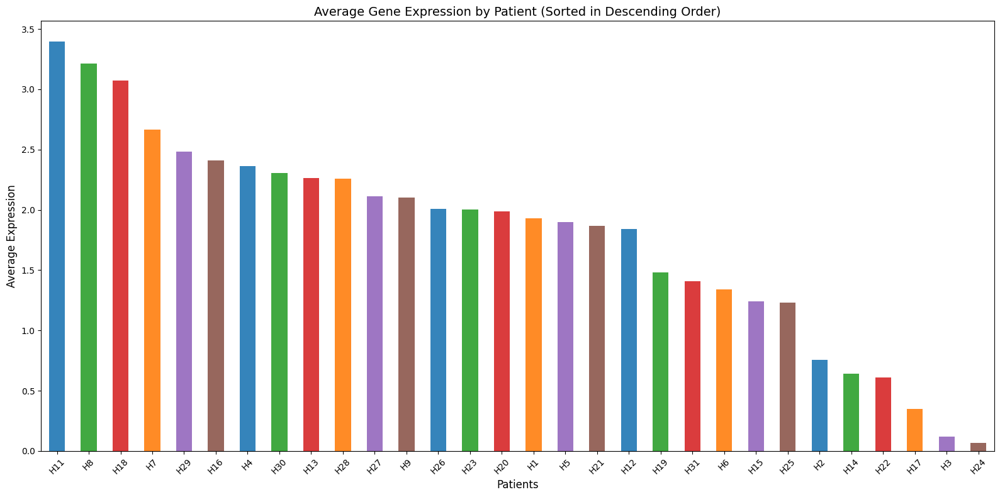

In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# High Fibroblast 클러스터 정의
high_fibroblast_patients = {"H21", "H8", "H11", "H27", "H9", "H29", "H18", "H31", "H28", "H16", "H17", "H1", "H19", "H12"}

# 유전자 목록
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 유전자 이름 -> index 매핑
gene_indices = {gene: np.where(adata.var_names == gene)[0][0] for gene in genes_of_interest}

# High 및 Low Fibroblast 환자 데이터 나누기
high_fibroblast_data = adata[(adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]
low_fibroblast_data = adata[(~adata.obs['patients'].isin(high_fibroblast_patients)) & (adata.obs['annotation'] == 'Fibroblasts')]

# High Fibroblast 클러스터 평균 발현량 계산
high_expression = {}
for patient in high_fibroblast_data.obs['patients'].unique():
    patient_data = high_fibroblast_data[high_fibroblast_data.obs['patients'] == patient]
    high_expression[patient] = {gene: patient_data.X[:, idx].mean() for gene, idx in gene_indices.items()}

# Low Fibroblast 클러스터 평균 발현량 계산
low_expression = {}
for patient in low_fibroblast_data.obs['patients'].unique():
    patient_data = low_fibroblast_data[low_fibroblast_data.obs['patients'] == patient]
    low_expression[patient] = {gene: patient_data.X[:, idx].mean() for gene, idx in gene_indices.items()}

# DataFrame 생성
high_expression_df = pd.DataFrame.from_dict(high_expression, orient='index')
low_expression_df = pd.DataFrame.from_dict(low_expression, orient='index')

# NaN 값 처리 및 데이터 타입 변환
high_expression_df = high_expression_df.fillna(0).astype(float)
low_expression_df = low_expression_df.fillna(0).astype(float)

# 두 데이터프레임 합치기 (내림차순으로 정렬)
combined_df = pd.concat([high_expression_df, low_expression_df], axis=0)

# 각 환자별 평균 발현값을 기준으로 내림차순 정렬
combined_df = combined_df.mean(axis=1).sort_values(ascending=False)

# 그래프 그리기
fig, ax = plt.subplots(figsize=(16, 8))

# 내림차순으로 정렬된 데이터의 막대 그래프 그리기
combined_df.plot(kind='bar', ax=ax, alpha=0.9, color=['#1f77b4', '#2ca02c', '#d62728', '#ff7f0e', '#9467bd', '#8c564b'])
ax.set_title('Average Gene Expression by Patient (Sorted in Descending Order)', fontsize=14)
ax.set_ylabel('Average Expression', fontsize=12)
ax.set_xlabel('Patients', fontsize=12)
ax.set_xticks(range(len(combined_df.index)))
ax.set_xticklabels(combined_df.index, rotation=45)

plt.tight_layout()
plt.show()


In [74]:
H11,H8,H18,H7,H29,H16,H4,H30,H13,H28,H27,H9,H26,H23,H20,H1,H5,H21,H12

NameError: name 'H11' is not defined

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 빨간색으로 표시할 환자 목록
highlighted_patients = {"H11", "H8", "H18", "H7", "H29", "H16", "H4", "H30", "H13", "H28", "H27", "H9", "H26", "H23", "H20", "H1", "H5", "H21", "H12"}

# 전체 환자 목록
patients = adata.obs['patients'].unique()

# Pseudobulk 데이터 저장
pseudobulk_data = {}

# Pseudobulk 데이터 생성
for patient in patients:
    # 특정 환자의 데이터 필터링
    patient_data = adata[adata.obs['patients'] == patient]
    
    # T/NK 그룹에서 CTLA4 발현 추출
    tnk_data = patient_data[patient_data.obs['Annotation_total'] == 'T/NK']
    ctla4 = tnk_data[:, 'CTLA4'].X.flatten()  # CTLA4 값 추출
    tnk_count = tnk_data.shape[0]  # T/NK 세포 수

    # Epithelial 그룹에서 LCN2 발현 추출
    epithelial_data = patient_data[patient_data.obs['Annotation_total'] == 'Epithelial']
    lcn2 = epithelial_data[:, 'LCN2'].X.flatten()  # LCN2 값 추출
    epithelial_count = epithelial_data.shape[0]  # Epithelial 세포 수
    
    # Pseudobulk 합산 후 각 그룹 세포 수로 나누기
    pseudobulk_ctla4 = ctla4.sum() / tnk_count if tnk_count > 0 else 0
    pseudobulk_lcn2 = lcn2.sum() / epithelial_count if epithelial_count > 0 else 0
    
    # 데이터 저장
    pseudobulk_data[patient] = {'CTLA4': pseudobulk_ctla4, 'LCN2': pseudobulk_lcn2}

# Pseudobulk 데이터프레임으로 변환
pseudobulk_df = pd.DataFrame.from_dict(pseudobulk_data, orient='index')

# 빨간색과 파란색 데이터 분리
red_df = pseudobulk_df.loc[pseudobulk_df.index.intersection(highlighted_patients)]
blue_df = pseudobulk_df.loc[~pseudobulk_df.index.isin(highlighted_patients)]

# 상관 계수 계산
red_corr = np.corrcoef(red_df['CTLA4'], red_df['LCN2'])[0, 1] if not red_df.empty else np.nan
blue_corr = np.corrcoef(blue_df['CTLA4'], blue_df['LCN2'])[0, 1] if not blue_df.empty else np.nan

# 플롯
plt.figure(figsize=(10, 8))
for patient in pseudobulk_df.index:
    color = 'red' if patient in highlighted_patients else 'blue'  # 환자에 따라 색상 설정
    plt.scatter(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        s=100, 
        c=color, 
        alpha=0.7
    )
    plt.text(
        pseudobulk_df.loc[patient, 'CTLA4'], 
        pseudobulk_df.loc[patient, 'LCN2'], 
        patient, 
        fontsize=10
    )

plt.title("Pseudobulk CTLA4 vs LCN2 Expression (Normalized by Patient Count)", fontsize=14)
plt.xlabel("CTLA4 Pseudobulk Expression (Normalized, T/NK)", fontsize=12)
plt.ylabel("LCN2 Pseudobulk Expression (Normalized, Epithelial)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(["Red patients (corr: {:.2f})".format(red_corr), 
            "Blue patients (corr: {:.2f})".format(blue_corr)], loc="best")
plt.tight_layout()
plt.show()

# 상관 계수 출력
print(f"Red patient correlation: {red_corr:.2f}")
print(f"Blue patient correlation: {blue_corr:.2f}")


In [ ]:
#Scenic

In [ ]:
epithelial_cells = adata.obs['annotation'] == 'Epithelial'
filtered_data = adata[epithelial_cells]

# Convert the filtered data to a dense format if needed and create a DataFrame
dense_data_filtered = filtered_data.X.todense() if hasattr(filtered_data.X, 'todense') else filtered_data.X
df_filtered = pd.DataFrame(dense_data_filtered, columns=filtered_data.var_names, index=filtered_data.obs_names)

# Save the filtered DataFrame to a CSV file
filtered_file_path = '/home/Data_Drive_8TB_3/kykim/colon/adata_X_epithelial.csv'
df_filtered.to_csv(filtered_file_path)

filtered_file_path  # Return the path of the saved file

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# TGF-β 신호와 관련된 유전자 목록 (예시로 설정된 유전자 목록)
tgfb_genes = ['TGFBR1', 'TGFB1', 'SMAD2', 'SMAD3', 'SMAD7', 'CTGF', 'SP1', 'SP4', 'ID1', 'ID3']

# Epithelial 셀만 필터링
epithelial_cells = adata[adata.obs['annotation'] == 'Epithelial']

# 유전자 발현 값 추출
gene_expression = epithelial_cells[:, tgfb_genes].X

# gene_expression을 DataFrame으로 변환 (행은 세포, 열은 유전자)
gene_expression_df = pd.DataFrame(
    gene_expression.toarray() if hasattr(gene_expression, 'toarray') else gene_expression,
    index=epithelial_cells.obs_names, columns=tgfb_genes
)

# 로그 변환 (log1p: log(x + 1), 0 값도 처리 가능)
log_gene_expression_df = np.log1p(gene_expression_df)

# 통합 점수 계산 (로그 변환된 값들의 평균)
epithelial_cells.obs['module_score'] = log_gene_expression_df.mean(axis=1)

# 환자별 module_score 통계 계산
module_score_stats = epithelial_cells.obs.groupby('patients')['module_score'].agg(['count', 'min', 'max', 'median', 'mean'])

# violin plot 시각화
plt.figure(figsize=(12, 6))
sns.violinplot(x='patients', y='module_score', data=epithelial_cells.obs, palette='Set2')

# 그래프 꾸미기
plt.title('Log-Transformed TGF-β Module Score by Patients (Epithelial Cells)', fontsize=14)
plt.xlabel('Patients', fontsize=12)
plt.ylabel('Log-Transformed TGF-β Module Score', fontsize=12)
plt.tight_layout()
plt.show()

# 결과 출력 (환자별 통계)
module_score_stats_sorted = module_score_stats.sort_values(by='mean', ascending=False)

# 정렬된 결과 출력
print(module_score_stats_sorted)


In [ ]:
#py monocle

/tmp/ipykernel_353118/3003651583.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(level=0)


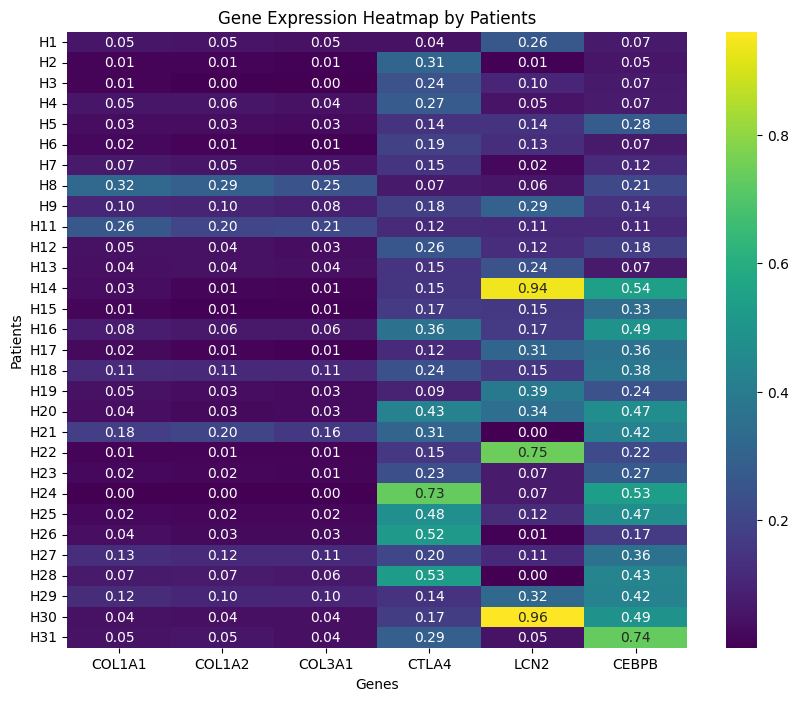

In [93]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 관심 유전자의 발현 데이터 필터링
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2', 'CTLA4', 'LCN2', 'CEBPB']
adata_filtered = adata[:, genes_of_interest]

# 2. adata.obs['patients'] 별 평균 발현량 계산
patient_avg_expr = (
    pd.DataFrame(adata_filtered.X.toarray(), columns=genes_of_interest, index=adata.obs['patients'])
    .groupby(level=0)
    .mean()
)

# 3. COL3A1, COL1A1, COL1A2의 발현량 합산 기준으로 유전자 열 정렬
gene_priority = ['COL3A1', 'COL1A1', 'COL1A2']
sorted_genes = (
    patient_avg_expr[gene_priority].sum(axis=0)
    .sort_values(ascending=False)
    .index.tolist() + [g for g in genes_of_interest if g not in gene_priority]
)

# 4. Heatmap 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(
    patient_avg_expr[sorted_genes],
    cmap="viridis",
    cbar=True,
    annot=True,
    fmt=".2f",
)
plt.title("Gene Expression Heatmap by Patients")
plt.ylabel("Patients")
plt.xlabel("Genes")
plt.show()


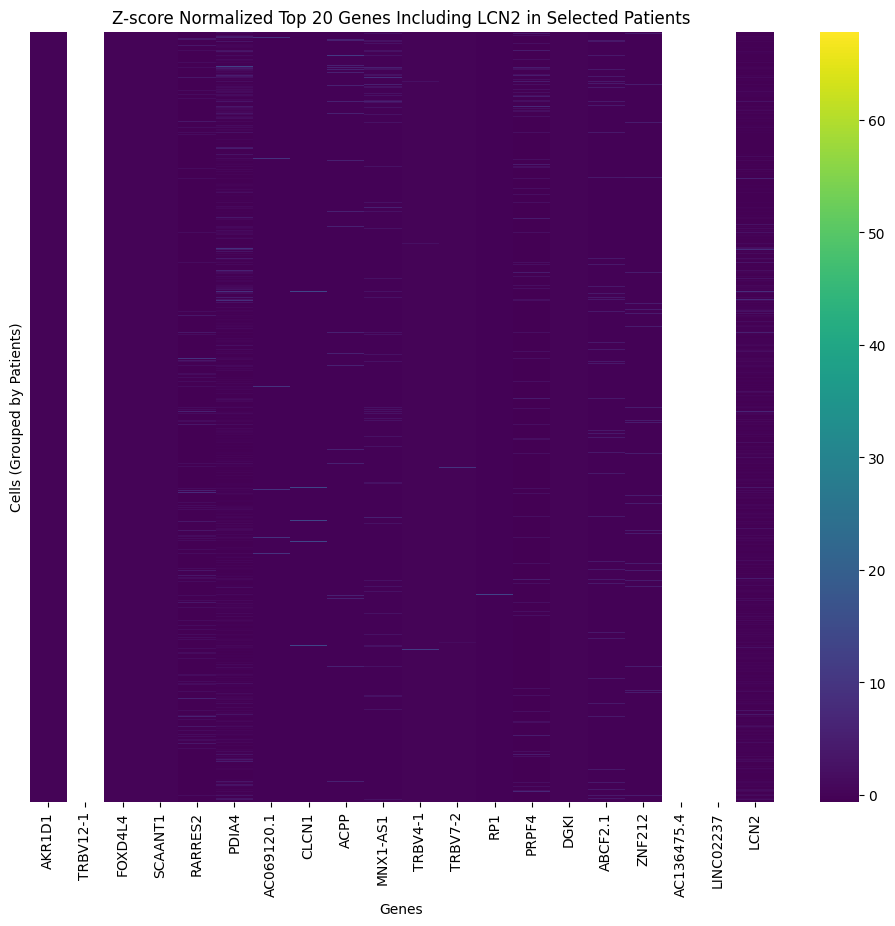

In [108]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore

# 1. 'Epithelial'인 세포 필터링
epithelial_cells = adata[adata.obs['annotation'] == 'Epithelial']

# 2. LCN2 유전자 발현을 기준으로 top 19 유전자 선택 (LCN2 포함)
lcn2_expression = epithelial_cells.raw[:, 'LCN2'].X.flatten()  # 바로 flatten() 적용
top_19_genes = epithelial_cells.raw.var_names[np.argsort(lcn2_expression)[-19:]]
top_20_genes = np.append(top_19_genes, 'LCN2')  # LCN2를 추가하여 top 20 genes 생성

# 3. top 20 유전자에 대한 발현 데이터 준비
expr_data_top20 = pd.DataFrame(
    epithelial_cells.raw[:, top_20_genes].X,
    columns=top_20_genes,
    index=epithelial_cells.obs.index
)

# 4. 'patients' 정보를 추가하여 세포별 데이터 생성
expr_data_top20['patients'] = epithelial_cells.obs['patients'].values

# 5. 특정 환자 그룹 필터링
selected_patients = ['H22', 'H20', 'H30', 'H14', 'H9']
expr_data_top20_filtered = expr_data_top20[expr_data_top20['patients'].isin(selected_patients)]

# 6. 'patients' 기준으로 데이터 정렬
expr_data_top20_sorted = expr_data_top20_filtered.sort_values(by="patients")

# 7. Z-score Normalization (각 유전자별로 정규화)
expr_data_normalized = expr_data_top20_sorted.drop(columns='patients').apply(zscore, axis=0)

# 8. Heatmap 그리기 (정규화된 데이터로)
plt.figure(figsize=(12, 10))
sns.heatmap(
    expr_data_normalized,
    cmap="viridis",
    xticklabels=True,
    yticklabels=False,  # 세포 레이블은 많아서 생략
    cbar=True,
)

plt.title("Z-score Normalized Top 20 Genes Including LCN2 in Selected Patients")
plt.xlabel("Genes")
plt.ylabel("Cells (Grouped by Patients)")
plt.show()


/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


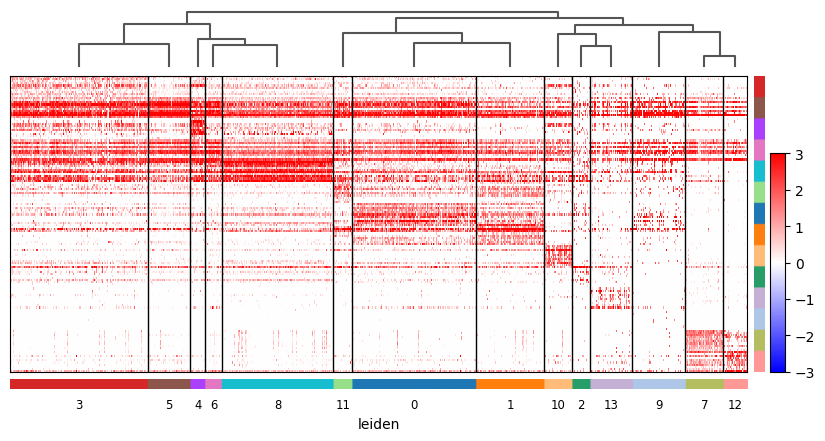

In [101]:
import scanpy as sc

# 1. rank_genes_groups 수행 (groupby를 'patients' 또는 다른 그룹 기준으로 설정)
sc.tl.rank_genes_groups(fibro, groupby='leiden', method='t-test', n_genes=10)

# 2. 유전자 순위 기반으로 Heatmap 그리기
sc.pl.rank_genes_groups_heatmap(
    fibro,
    n_genes=10,
    use_raw=False,
    swap_axes=True,
    show_gene_labels=False,
    vmin=-3,
    vmax=3,
    cmap="bwr"
)


In [125]:
adata.obs['annotation'].value_counts()

annotation
T/NK             44841
Epithelial       19816
Myeloid          11489
CD19B             6621
plasmaB           6022
Cycling cells     4744
Fibroblasts       2694
Endothelial       1714
Mast              1327
Name: count, dtype: int64

In [24]:
mye = adata[adata.obs['annotation'] == 'Myeloid']

In [25]:
# Saving count data
mye.layers["counts"] = mye.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(mye)
# Logarithmize the data
sc.pp.log1p(mye)

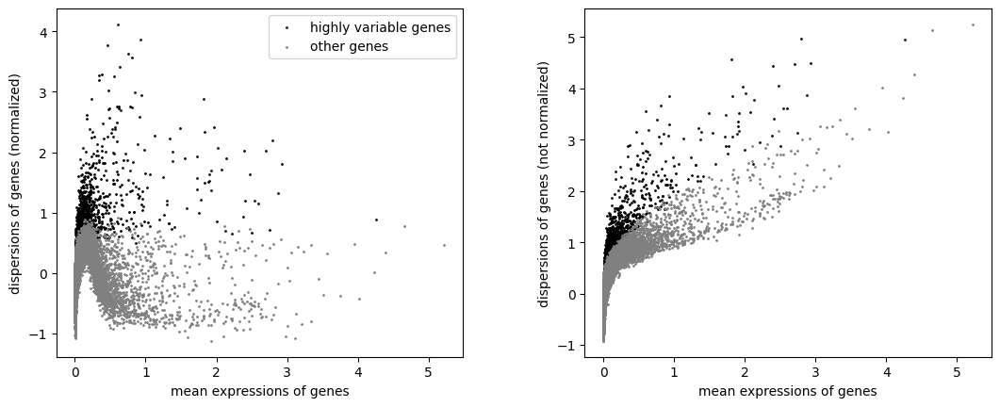

In [26]:
sc.pp.highly_variable_genes(mye, n_top_genes=2000, batch_key="patients")
sc.pl.highly_variable_genes(mye)

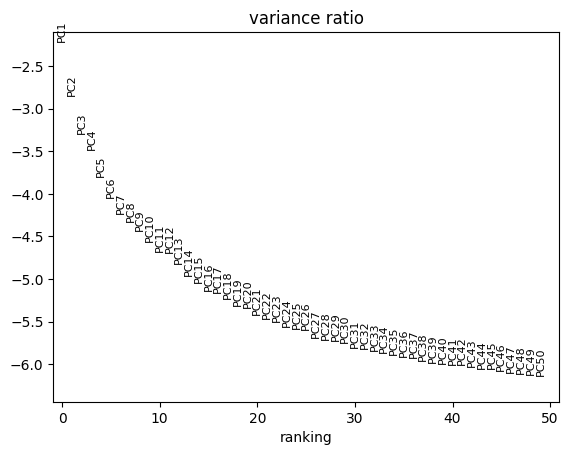

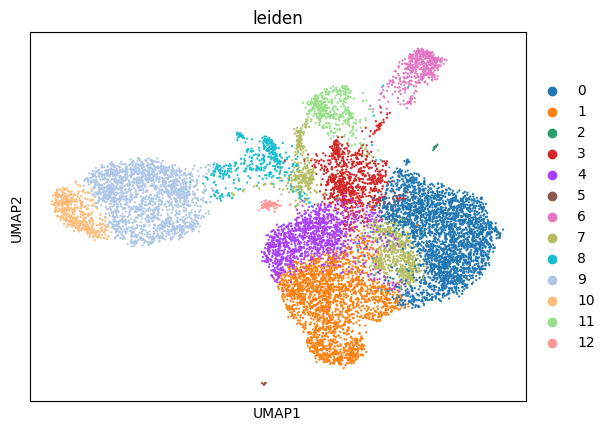

In [27]:
sc.tl.pca(mye)
sc.pl.pca_variance_ratio(mye, n_pcs=50, log=True)
sc.pp.neighbors(mye)
sc.tl.umap(mye)
sc.tl.leiden(mye, flavor="igraph", n_iterations=2, resolution=0.5)
sc.pl.umap(mye, color=["leiden"])

In [28]:
# Revert to raw expression data before HVG selection
mye.X = mye.layers["counts"].copy()

In [31]:
import celltypist
from celltypist import models

In [15]:
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /home/Data_Drive_8TB/kykim/.celltypist/data/models
💾 Downloading model [1/54]: Immune_All_Low.pkl
💾 Downloading model [2/54]: Immune_All_High.pkl
💾 Downloading model [3/54]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/54]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/54]: Adult_Human_MTG.pkl
💾 Downloading model [6/54]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/54]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/54]: Adult_Human_Skin.pkl
💾 Downloading model [9/54]: Adult_Human_Vascular.pkl
💾 Downloading model [10/54]: Adult_Mouse_Gut.pkl
💾 Downloading model [11/54]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [12/54]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [13/54]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [14/54]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [15/54]: COVID19_HumanCh

In [16]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_COVID19_PBMC.pkl,peripheral blood mononuclear cell types from C...
3,Adult_CynomolgusMacaque_Hippocampus.pkl,cell types from the hippocampus of adult cynom...
4,Adult_Human_MTG.pkl,cell types and subtypes (10x-based) from the a...
5,Adult_Human_PancreaticIslet.pkl,cell types from pancreatic islets of healthy a...
6,Adult_Human_PrefrontalCortex.pkl,cell types and subtypes from the adult human d...
7,Adult_Human_Skin.pkl,cell types from human healthy adult skin
8,Adult_Human_Vascular.pkl,vascular populations combined from multiple ad...
9,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...


In [17]:
model = models.Model.load(model = 'Immune_All_High.pkl')

In [32]:
sc.pp.normalize_total(mye, target_sum=1e4)

# Log transformation
sc.pp.log1p(mye)

In [33]:
predictions = celltypist.annotate(mye, model = 'Immune_All_High.pkl', majority_voting = True, mode = 'best match')

🔬 Input data has 11489 cells and 27873 genes
🔗 Matching reference genes in the model
🧬 5942 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [34]:
predictions.predicted_labels


,predicted_labels,over_clustering,majority_voting
AAACCTGCAGATGGGT-1,Macrophages,69,Macrophages
AAACGGGGTAAAGTCA-1,pDC,0,pDC
AAACGGGTCACCCGAG-1,Macrophages,30,Macrophages
AAACGGGTCCTCTAGC-1,DC,59,DC
AAAGCAAGTCCCTACT-1,pDC,89,pDC
...,...,...,...
TTTGGTTGTCGCTTTC-31,Monocytes,32,Monocytes
TTTGGTTTCTAACCGA-31,Monocytes,31,Monocytes
TTTGTCAAGATGGGTC-31,Monocytes,24,Monocytes
TTTGTCAAGTCTCGGC-31,Macrophages,100,Macrophages


In [35]:
myeadata = predictions.to_adata()

In [36]:
sc.tl.umap(myeadata)

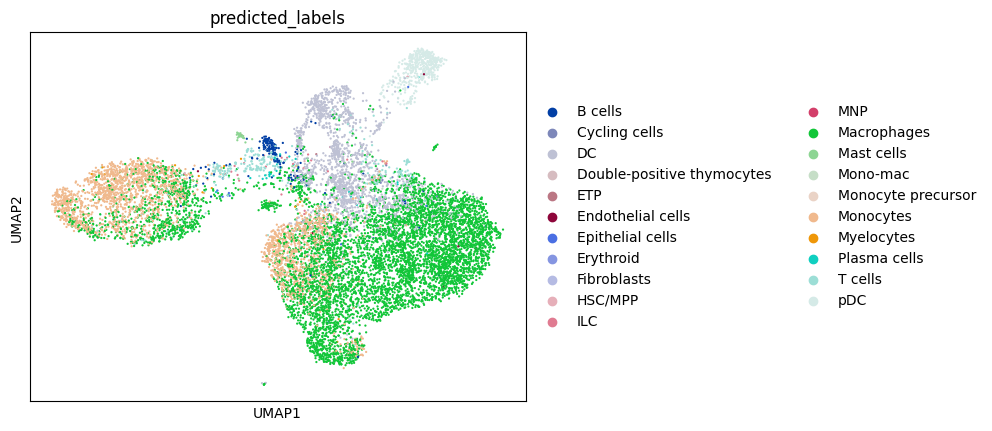

In [37]:
sc.pl.umap(myeadata, color = ['predicted_labels'])

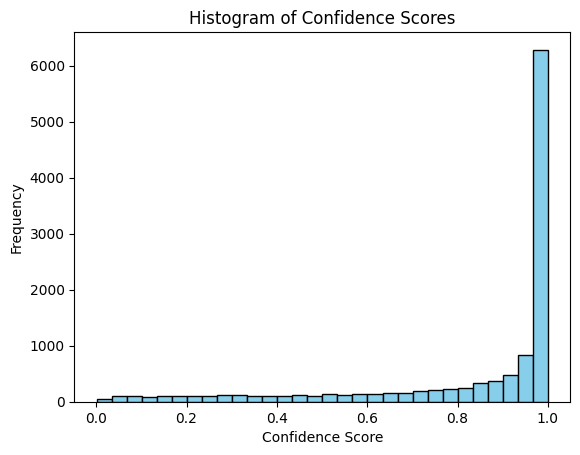

In [38]:
import matplotlib.pyplot as plt

# 히스토그램 그리기
plt.hist(myeadata.obs['conf_score'], bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Confidence Score')
plt.ylabel('Frequency')
plt.title('Histogram of Confidence Scores')
plt.show()


In [76]:
# 조건에 따라 'cell_type' 컬럼 생성
myeadata.obs['cell_type'] = myeadata.obs.apply(
    lambda row: row['predicted_labels'] if row['conf_score'] >= 0.75 else 'Unknown',
    axis=1
)


... storing 'cell_type' as categorical


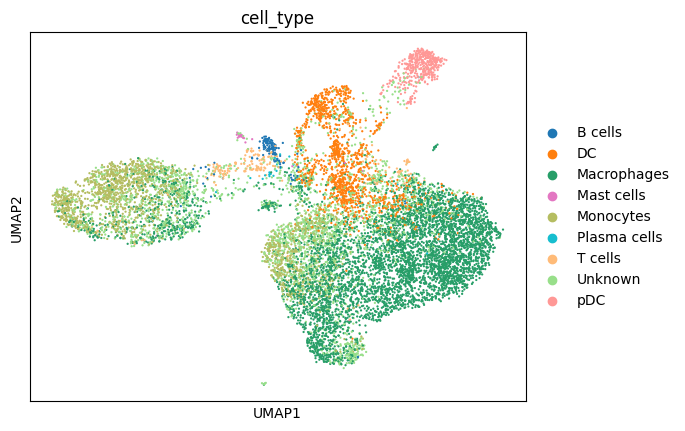

In [77]:
import scanpy as sc

# 'cell_type' 열을 기준으로 UMAP 시각화
sc.pl.umap(myeadata, color='cell_type')


In [78]:
list(myeadata.obs['cell_type'].unique())

['Macrophages',
 'Unknown',
 'DC',
 'pDC',
 'T cells',
 'Plasma cells',
 'Monocytes',
 'Mast cells',
 'B cells']

In [79]:
myeadata.obs['cell_type'].value_counts()

cell_type
Macrophages     5153
Unknown         2611
Monocytes       1646
DC              1243
pDC              398
T cells          204
B cells          143
Plasma cells      31
Mast cells        27
Name: count, dtype: int64

In [80]:
# Remove the specified cell types from the 'cell_type' column
remove_cell_types = ['Endothelial cells', 'Epithelial cells', 'ILC', 'Fibroblasts', 'Myelocytes']
myeadata = myeadata[myeadata.obs['cell_type'].isin(remove_cell_types) == False]


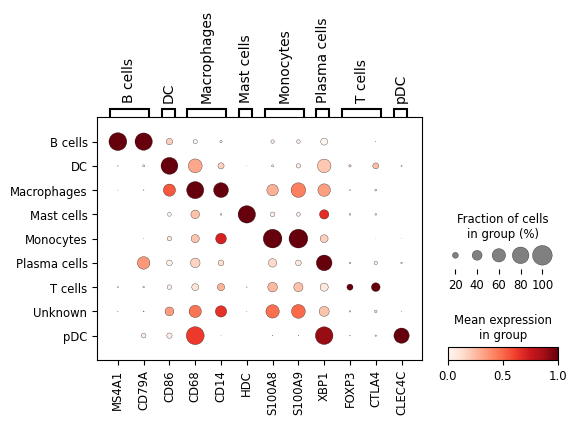

              Count  Percentage
cell_type                      
Macrophages    5153   44.980796
Unknown        2611   22.791550
Monocytes      1646   14.368017
DC             1243   10.850209
pDC             398    3.474162
T cells         204    1.780726
B cells         143    1.248254
Plasma cells     31    0.270601
Mast cells       27    0.235684


In [81]:
import scanpy as sc
import pandas as pd
# large_annotation 세포 타입에 맞는 marker genes 설정
marker_genes = {
    'B cells': ['MS4A1', 'CD79A'],
    'DC' : ['CD86'],
    'Macrophages': ['CD68','CD11b','CD14'],
    'Mast cells': ['HDC'],
    'Monocytes': ["S100A8", "S100A9"],
    'Plasma cells': ['XBP1'],
    'T cells' : ["FOXP3", "CTLA4"],
    'pDC' : ['CLEC4C'],

    }

# marker_genes 필터링 (mye.var_names에 있는 유전자만 필터링)
filtered_marker_genes = {
    category: [gene for gene in genes if gene in myeadata.var_names]
    for category, genes in marker_genes.items()
}

# DotPlot 생성 (large_annotation 기준)
sc.pl.dotplot(myeadata, filtered_marker_genes, groupby="cell_type", standard_scale="var")

# 세포 타입의 값과 비율 계산
cell_type_counts = myeadata.obs['cell_type'].value_counts()
cell_type_percentage = (cell_type_counts / cell_type_counts.sum()) * 100

# 값과 비율 함께 출력
cell_type_summary = pd.DataFrame({
    'Count': cell_type_counts,
    'Percentage': cell_type_percentage
})

# 출력
print(cell_type_summary)


In [82]:
myeadata.X = myeadata.layers["counts"].copy()

In [90]:
import scanpy as sc

# 저장할 경로 지정
save_path = "/home/Data_Drive_8TB/kykim/colon/Macspectrum/crcmacro.h5ad"

# AnnData 객체 저장
Macro.write(save_path)


In [89]:
Macro = myeadata[myeadata.obs['cell_type'] == 'Macrophages']

In [85]:
Macro.raw = Macro.copy()
Macro.layers['counts'] = Macro.X.copy()
sc.pp.highly_variable_genes(mye, n_top_genes=2000, batch_key="patients")
Macro = Macro[:, Macro.var.highly_variable]

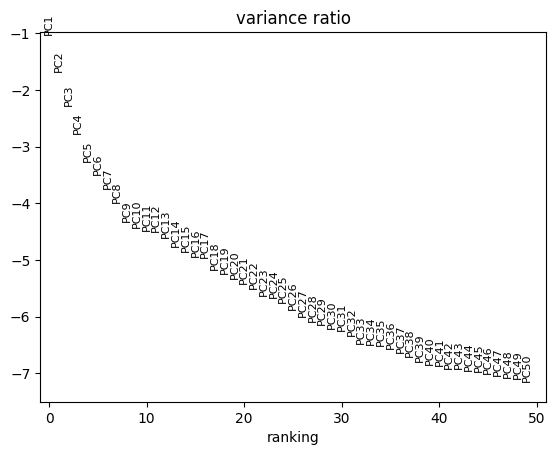

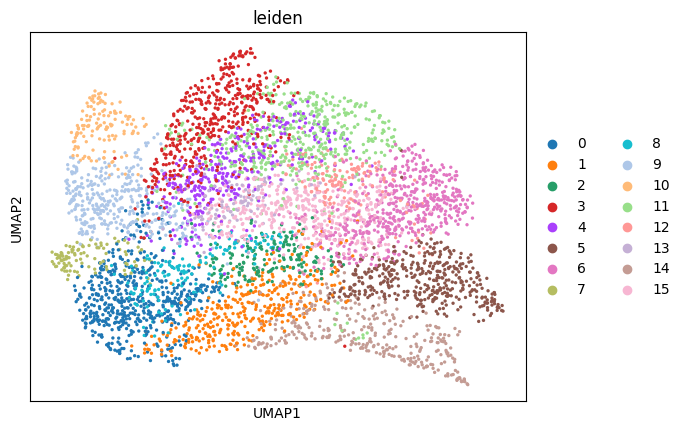

In [86]:
sc.tl.pca(Macro)
sc.pl.pca_variance_ratio(Macro, n_pcs=50, log=True)
sc.pp.neighbors(Macro)
sc.tl.umap(Macro)
sc.tl.leiden(Macro, flavor="igraph", n_iterations=2, resolution=1)
sc.pl.umap(Macro, color=["leiden"])



In [87]:
Macro.X = Macro.layers["counts"].copy()

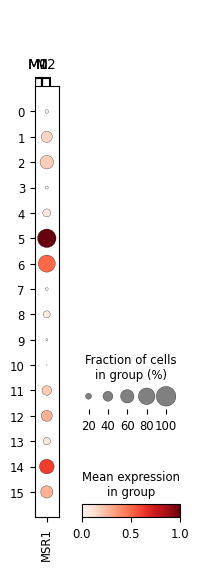

        Count  Percentage
leiden                   
0         579   11.236173
6         528   10.246458
3         470    9.120900
11        458    8.888026
15        441    8.558121
5         402    7.801281
4         384    7.451970
1         378    7.335533
9         349    6.772754
14        325    6.307006
2         184    3.570735
12        156    3.027363
8         153    2.969144
10        130    2.522802
7         109    2.115273
13        107    2.076460


In [88]:
import scanpy as sc
import pandas as pd

# macrophage_markers 세포 타입에 맞는 marker genes 설정
macrophage_markers = {
    "M0": ['CD68', 'CSF1R', 'LYZ', 'HLA-DR'],
    "M1": ['CD80','CD32','iNOS','CD68','CD11B','CD64'],
    "M2": ['CD206', 'CD163', 'CD68', 'ARG1', 'CD11b','MSR1']
}

# marker_genes 필터링 (myeadata.var_names에 있는 유전자만 필터링)
filtered_marker_genes = {
    category: [gene for gene in genes if gene in Macro.var_names]
    for category, genes in macrophage_markers.items()
}

# DotPlot 생성 (leiden 기준) - figsize 제거 (디폴트 크기)
sc.pl.dotplot(Macro, filtered_marker_genes, groupby="leiden", standard_scale="var")

# 세포 타입의 값과 비율 계산
cell_type_counts = Macro.obs['leiden'].value_counts()

# 값과 비율 계산
cell_type_percentage = (cell_type_counts / cell_type_counts.sum()) * 100

# 값과 비율을 함께 출력
cell_type_summary = pd.DataFrame({
    'Count': cell_type_counts,
    'Percentage': cell_type_percentage
})

# 출력
print(cell_type_summary)


In [736]:
import numpy as np

# macrophage_markers 정의
macrophage_markers = {
    "M0": ['CSF1R', 'LYZ','CD68'],
    "M1": ['CD80','CD40','CD86','CD14','CD68'],
    "M2": ['CD163','MSR1','CD68','CD36']
}

# 1. 중복 제거 및 유효한 유전자 필터링
unique_markers = set(macrophage_markers["M0"] + macrophage_markers["M1"] + macrophage_markers["M2"])
valid_markers = [gene for gene in unique_markers if gene in Macro.var_names]

# 2. 유전자의 발현값을 Macro.obs에 추가 (열 이름을 "gene_expression" 형식으로 지정)
for gene in valid_markers:
    column_name = f"{gene}_expression"  # 열 이름 지정
    Macro.obs[column_name] = Macro[:, gene].X.toarray().flatten() if isinstance(Macro.X, np.ndarray) else Macro[:, gene].X.flatten()

# 3. 결과 확인
print(f"추가된 유전자: {valid_markers}")
print(Macro.obs.head())


추가된 유전자: ['CD80', 'CD86', 'CD40', 'CD36', 'LYZ', 'CD14', 'MSR1', 'CD68', 'CD163', 'CSF1R']
                       orig.ident  nCount_RNA  nFeature_RNA patients  MSS  \
AAACCTGCAGATGGGT-1  SeuratProject      1228.0           601       H1  MSS   
AAACGGGTCACCCGAG-1  SeuratProject      2158.0           923       H1  MSS   
AAGACCTTCTAACCGA-1  SeuratProject       678.0           357       H1  MSS   
AAGCCGCGTAACGCGA-1  SeuratProject      2789.0           992       H1  MSS   
AAGGTTCCATGGATGG-1  SeuratProject      1087.0           596       H1  MSS   

                             KRAS KRAS.mutation Location  Stage snv_sum  \
AAACCTGCAGATGGGT-1  KRAS mutation     KRAS G12V  D-colon  T3cN0     198   
AAACGGGTCACCCGAG-1  KRAS mutation     KRAS G12V  D-colon  T3cN0     277   
AAGACCTTCTAACCGA-1  KRAS mutation     KRAS G12V  D-colon  T3cN0      92   
AAGCCGCGTAACGCGA-1  KRAS mutation     KRAS G12V  D-colon  T3cN0     246   
AAGGTTCCATGGATGG-1  KRAS mutation     KRAS G12V  D-colon  T3cN0     128

In [737]:
# 1. cell_type 초기화
Macro.obs['cell_type'] = 'grey zone'

# 2. CD68_expression이 0인 경우 'Unknown'으로 설정
Macro.obs.loc[Macro.obs['CD68_expression'] == 0, 'cell_type'] = 'Unknown'

# 3. 조건에 따른 cell_type 설정
# (1) M0_Macrophage 조건
# (조건 A and 조건 B) or (조건 C or 조건 D)
m0_condition = (
    ((Macro.obs['CSF1R_expression'] > 0) & (Macro.obs['LYZ_expression'] > 0) ) |  # 조건 A and B
    ((Macro.obs['CSF1R_expression'] > 0) | (Macro.obs['LYZ_expression'] > 0) | (Macro.obs['CD14_expression'] > 0))  # 조건 C or D
)
m0_condition = m0_condition & \
               ~(Macro.obs['CD80_expression'] > 0) & \
               ~(Macro.obs['CD40_expression'] > 0) & \
               ~(Macro.obs['CD86_expression'] > 0) & \
               ~(Macro.obs['CD163_expression'] > 0) & \
               ~(Macro.obs['CD36_expression'] > 0) & \
               ~(Macro.obs['MSR1_expression'] > 0)
Macro.obs.loc[m0_condition, 'cell_type'] = 'M0_Macrophage'

# (2) M1_Macrophage 조건
m1_condition = (
    ((Macro.obs['CD80_expression'] > 0) & (Macro.obs['CD40_expression'] > 0) & (Macro.obs['CD86_expression'] > 0) ) |
    ((Macro.obs['CD80_expression'] > 0) | (Macro.obs['CD40_expression'] > 0) | (Macro.obs['CD86_expression'] > 0)  )
)
m1_condition = m1_condition & \
               ~(Macro.obs['CSF1R_expression'] > 0) & \
               ~(Macro.obs['LYZ_expression'] > 0) & \
               ~(Macro.obs['CD163_expression'] > 0) & \
               ~(Macro.obs['CD36_expression'] > 0) & \
               ~(Macro.obs['MSR1_expression'] > 0)
Macro.obs.loc[m1_condition, 'cell_type'] = 'M1_Macrophage'

# (3) M2_Macrophage 조건
m2_condition = (
    ((Macro.obs['CD163_expression'] > 0) & (Macro.obs['MSR1_expression'] > 0) & (Macro.obs['CD36_expression'] > 0)) |  # 조건 A and B
    ((Macro.obs['CD163_expression'] > 0) | (Macro.obs['MSR1_expression'] > 0) | (Macro.obs['CD36_expression'] > 0))
)
m2_condition = m2_condition & \
               ~(Macro.obs['CSF1R_expression'] > 0) & \
               ~(Macro.obs['LYZ_expression'] > 0) & \
               ~(Macro.obs['CD80_expression'] > 0) & \
               ~(Macro.obs['CD40_expression'] > 0) & \
               ~(Macro.obs['CD86_expression'] > 0) 
Macro.obs.loc[m2_condition, 'cell_type'] = 'M2_Macrophage'

# 4. 결과 확인
print(Macro.obs['cell_type'].value_counts())


cell_type
grey zone        3350
M0_Macrophage     576
Unknown           364
M2_Macrophage      62
M1_Macrophage      45
Name: count, dtype: int64


In [738]:
macrophage_markerss = {
    "M0": ['CSF1R', 'LYZ'],
    "M1": ['CD80','CD40','CD86'],
    "M2": ['CD163', 'MSR1','CD36']
}

... storing 'cell_type' as categorical


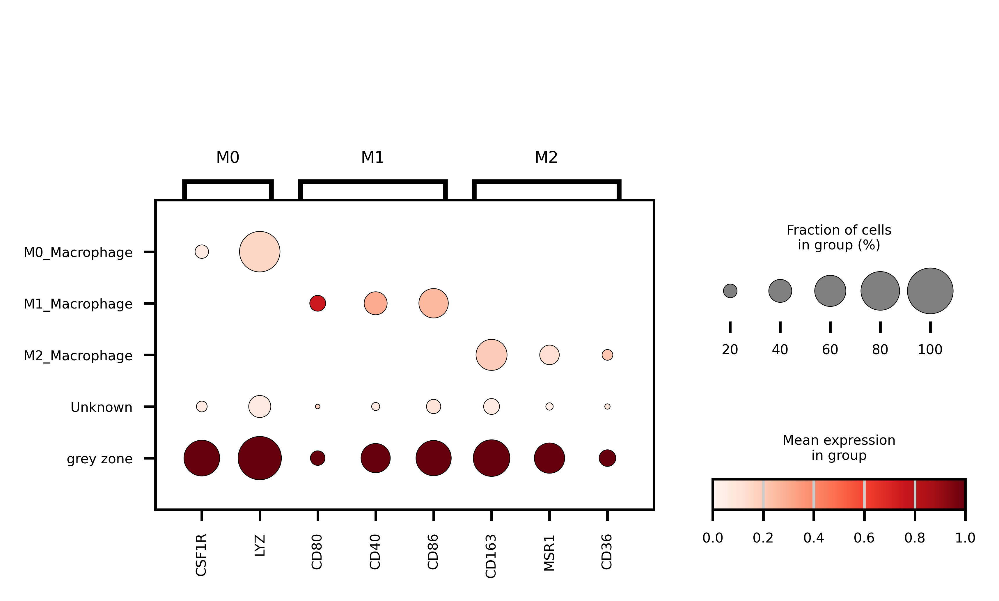

In [739]:
sc.pl.dotplot(Macro, macrophage_markerss, groupby="cell_type", standard_scale="var")

In [740]:
Macro.obs['cell_type'].value_counts()

cell_type
grey zone        3350
M0_Macrophage     576
Unknown           364
M2_Macrophage      62
M1_Macrophage      45
Name: count, dtype: int64

In [683]:
pd.set_option('display.max_columns', None)

In [754]:
import numpy as np

# 'grey zone' 조건 설정
is_grey_zone = Macro.obs['cell_type'] == 'grey zone'

# 'grey zone'인 경우에만 M0_avg, M1_avg, M2_avg 계산
# M0_avg에 0.5의 가중치를 적용
Macro.obs.loc[is_grey_zone, 'M0_avg'] = (Macro.obs.loc[is_grey_zone, ['CSF1R_expression', 'LYZ_expression']].mean(axis=1))
Macro.obs.loc[is_grey_zone, 'M1_avg'] = Macro.obs.loc[is_grey_zone, ['CD80_expression', 'CD40_expression', 'CD86_expression']].mean(axis=1)
Macro.obs.loc[is_grey_zone, 'M2_avg'] = Macro.obs.loc[is_grey_zone, ['CD163_expression', 'MSR1_expression','CD36_expression']].mean(axis=1)

# 'grey zone'이 아닌 경우는 NaN으로 설정
Macro.obs.loc[~is_grey_zone, ['M1_avg', 'M2_avg']] = np.nan

# 결과 확인
print(Macro.obs[['M0_avg','M1_avg', 'M2_avg']].head())


                      M0_avg    M1_avg    M2_avg
AAACCTGCAGATGGGT-1       NaN       NaN       NaN
AAACGGGTCACCCGAG-1  1.195566  0.364552  0.729105
AAGACCTTCTAACCGA-1       NaN       NaN       NaN
AAGCCGCGTAACGCGA-1  1.327407  0.000000  0.574738
AAGGTTCCATGGATGG-1       NaN       NaN       NaN


In [755]:
Macro.obs

,orig.ident,nCount_RNA,nFeature_RNA,patients,MSS,KRAS,KRAS.mutation,Location,Stage,snv_sum,souporcell,frequency,TP53.mutation,CD74positive,CEBPBpositive,High.expansion,subclustering_CD8T,MHCpositive,Stage_T,stage_N,percent.mt,S.Score,G2M.Score,Phase,old.ident,integrated_snn_res.0.2,seurat_clusters,annotation,annotation_detail,annotation_proportion,MSI_Mut,TP53_Mut,RAS_Mut,TMB,CS_ratio,APC_Mut,annot_pseudo,patients_num,Annotation_total,Annotation_total_Tsub,Annotation_total_lv4,Annotation_total_Trough,annotation_tmp,Celltype_Fig1,Annotation_Fig1,Annotation_Fig1A,Annotation_tmp_fr,Annotation_cell2loc_onlyEpiT,Annotation_cell2loc,Annotation_cell2loc_onlyEpicebpbhl_T,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,module_score,is_fibroblast,leiden,predicted_labels,over_clustering,majority_voting,conf_score,cell_type,CD80_expression,CD86_expression,CD40_expression,CD36_expression,LYZ_expression,CD14_expression,MSR1_expression,CD68_expression,CD163_expression,CSF1R_expression,M1_avg,M2_avg,final_cell_type,M0_avg
AAACCTGCAGATGGGT-1,SeuratProject,1228.0,601,H1,MSS,KRAS mutation,KRAS G12V,D-colon,T3cN0,198,singlet,0,TP53 WT,CD74-L,CEBPB-L,unassigned,unassigned,MHC_L,T3,N0,0.244300,-0.172342,-0.198869,G1,SeuratProject,3,3,Myeloid,TAM,Myeloid,MSS,TP53WT,RASmutation,TMB-L,Neg,APC WT,TOTAL,1A,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Others,Myeloid,Others,601,6.400257,1100.072279,7.004040,15.322083,26.597881,45.265613,86.214032,3.578128,1.521290,0.325263,150.256186,5.018975,13.658756,0.000000,0.000000,0.000000,0.0,False,0,Macrophages,27,Macrophages,0.983895,M0_Macrophage,0.000000,0.000000,0.000000,0.0,0.000000,1.501541,0.000000,3.087928,0.000000,0.000000,NaN,NaN,M0_Macrophage,NaN
AAACGGGTCACCCGAG-1,SeuratProject,2158.0,923,H1,MSS,KRAS mutation,KRAS G12V,D-colon,T3cN0,277,singlet,0,TP53 WT,CD74-L,CEBPB-L,unassigned,unassigned,MHC_L,T3,N0,0.463392,-0.175014,-0.235056,G1,SeuratProject,3,3,Myeloid,TAM,Myeloid,MSS,TP53WT,RASmutation,TMB-L,Neg,APC WT,TOTAL,1A,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Others,Myeloid,Others,923,6.828712,1303.231663,7.173369,12.453715,21.522305,35.688450,64.502321,7.669873,2.159854,0.588527,151.230626,5.025397,11.604278,1.603489,0.956852,0.123039,0.0,False,0,Macrophages,15,Macrophages,0.966217,grey zone,0.000000,1.093657,0.000000,0.0,2.391132,1.603489,1.093657,2.190612,1.093657,0.000000,0.364552,0.729105,grey zone,1.195566
AAGACCTTCTAACCGA-1,SeuratProject,678.0,357,H1,MSS,KRAS mutation,KRAS G12V,D-colon,T3cN0,92,singlet,0,TP53 WT,CD74-L,CEBPB-L,unassigned,memory-like T,MHC_L,T3,N0,20.058997,-0.101466,-0.179029,G1,SeuratProject,3,3,Myeloid,Proinflammatory,Myeloid,MSS,TP53WT,RASmutation,TMB-L,Neg,APC WT,TOTAL,1A,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Others,Myeloid,Others,357,5.880533,813.344967,6.702384,21.733622,37.106989,61.578978,100.000000,45.184222,3.832638,5.555358,69.966357,4.262206,8.602298,0.000000,0.000000,0.000000,0.0,False,3,Macrophages,11,Macrophages,0.809809,M0_Macrophage,0.000000,0.000000,0.000000,0.0,3.268593,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,Others,NaN
AAGCCGCGTAACGCGA-1,SeuratProject,2789.0,992,H1,MSS,KRAS mutation,KRAS G12V,D-colon,T3cN0,246,singlet,0,TP53 WT,CD74-L,CEBPB-L,unassigned,memory-like T,MHC_L,T3,N0,3.549659,-0.184475,-0.214742,G1,SeuratProject,3,3,Myeloid,TAM,Myeloid,MSS,TP53WT,RASmutation,TMB-L,Neg,APC WT,TOTAL,1A,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Myeloid,Others,Myeloid,Others,992,6.900731,1272.652252,7.149644,12.858038,22.362817,37.174902,64.023480,25.762171,3.286989,2.024290,127.962687,4.859523,10.054804,0.000000,0.000000,0.000000,0.0,False,4,Macroph

In [816]:
import numpy as np

# 'M0_avg', 'M1_avg', 'M2_avg'이 모두 0이면 'grey zone', NaN이면 'Unknown'
Macro.obs['transitional_cell_type'] = 'grey zone'

# NaN이 아닌 값 중 가장 큰 값을 기반으로 cell_type 설정
condition_unknown = Macro.obs[['M0_avg','M1_avg', 'M2_avg']].isna().any(axis=1)  # NaN이 있는 경우
condition_grey_zone = (Macro.obs[['M0_avg','M1_avg', 'M2_avg']].sum(axis=1) == 0)  # 모두 0인 경우
condition_m0_max = (Macro.obs['M0_avg'] > Macro.obs[['M1_avg','M2_avg']].max(axis=1))  # M0가 최대인 경우
condition_m1_max = (Macro.obs['M1_avg'] > Macro.obs[['M0_avg','M2_avg']].max(axis=1))  # M1이 최대인 경우
condition_m2_max = (Macro.obs['M2_avg'] > Macro.obs[['M0_avg','M1_avg']].max(axis=1))  # M2가 최대인 경우

# 'CD68_expression'이 0인 경우 'Others'로 설정
condition_cd68_zero = Macro.obs['CD68_expression'] == 0

# M0_Macrophage인 경우
condition_m0_macrophage = Macro.obs['cell_type'] == 'M0_Macrophage'

# 조건에 따른 'final_cell_type' 할당
Macro.obs.loc[condition_unknown, 'transitional_cell_type'] = 'Unknown'
Macro.obs.loc[condition_grey_zone, 'transitional_cell_type'] = 'grey zone'

# 'cell_type'이 'M0_Macrophage'인 경우
Macro.obs.loc[condition_m0_macrophage, 'transitional_cell_type'] = 'M0_Macrophage'

# M0_avg가 0이 아니면서 M1_avg, M2_avg가 0이 아닌 경우 Transitional Macrophage로 설정
condition_transitional_m0_m1 = (Macro.obs['M0_avg'] != 0) & (Macro.obs['M1_avg'] != 0) & (Macro.obs['M2_avg'] == 0)
condition_transitional_m0_m2 = (Macro.obs['M0_avg'] != 0) & (Macro.obs['M2_avg'] != 0) & (Macro.obs['M1_avg'] == 0)

# M1_avg, M2_avg가 모두 0이 아닌 경우, 평균값이 더 높은 쪽으로 설정
condition_both_non_zero = (Macro.obs['M1_avg'] != 0) & (Macro.obs['M2_avg'] != 0) 
condition_both_non_zero_m1 = (Macro.obs['M1_avg'] > Macro.obs['M2_avg'])
condition_both_non_zero_m2 = (Macro.obs['M2_avg'] > Macro.obs['M1_avg'])

# Transitional M0-M1 Macrophage, Transitional M0-M2 Macrophage 할당
Macro.obs.loc[condition_transitional_m0_m1, 'transitional_cell_type'] = 'Transitional M0-M1 Macrophage'
Macro.obs.loc[condition_transitional_m0_m2, 'transitional_cell_type'] = 'Transitional M0-M2 Macrophage'

# M1_avg와 M2_avg 모두 0이 아닌 경우, 평균값이 더 높은쪽으로 할당
Macro.obs.loc[condition_both_non_zero & condition_both_non_zero_m1, 'transitional_cell_type'] = 'Transitional M0-M1 Macrophage'
Macro.obs.loc[condition_both_non_zero & condition_both_non_zero_m2, 'transitional_cell_type'] = 'Transitional M0-M2 Macrophage'

# M1_Macrophage, M2_Macrophage 할당
Macro.obs.loc[condition_m1_max, 'transitional_cell_type'] = 'M1_Macrophage'
Macro.obs.loc[condition_m2_max, 'transitional_cell_type'] = 'M2_Macrophage'

Macro.obs.loc[condition_cd68_zero, 'transitional_cell_type'] = 'Others'

# 결과 확인
print(Macro.obs['transitional_cell_type'].value_counts())


transitional_cell_type
Transitional M0-M2 Macrophage    1875
Transitional M0-M1 Macrophage     950
Others                            575
M0_Macrophage                     402
grey zone                         336
M2_Macrophage                     195
M1_Macrophage                      64
Name: count, dtype: int64


... storing 'transitional_cell_type' as categorical


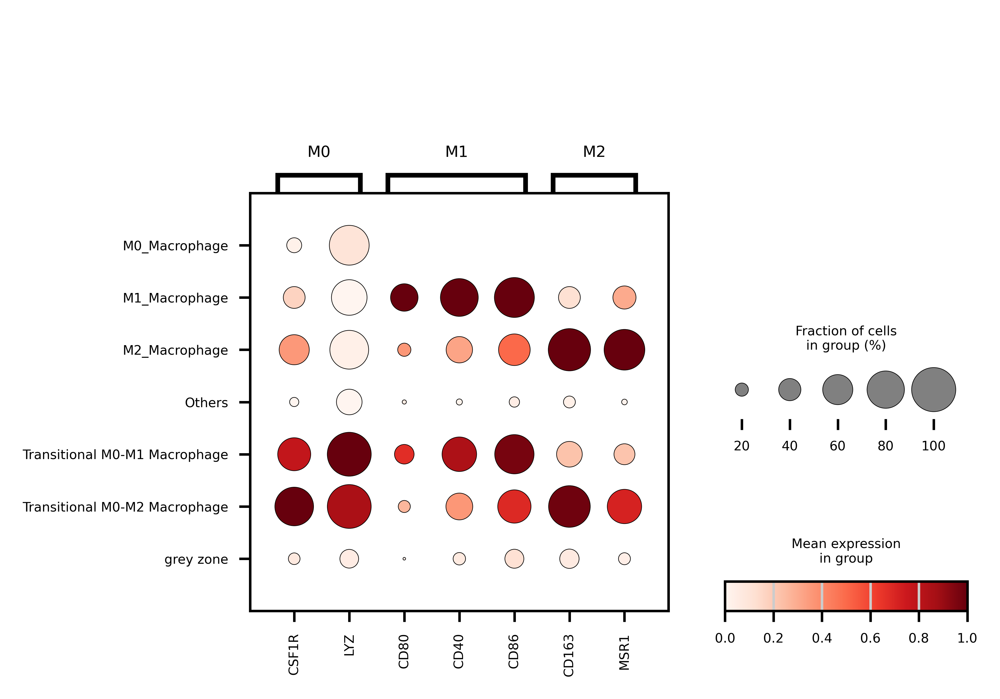

In [817]:
macrophage_markerss = {
    "M0": ['CSF1R', 'LYZ'],
    "M1": ['CD80','CD40','CD86'],
    "M2": ['CD163','MSR1']
}
sc.pl.dotplot(Macro, macrophage_markerss, groupby="transitional_cell_type", standard_scale="var")

In [818]:
sc.pl.umap(Macro, color=["transitional_cell_type"])


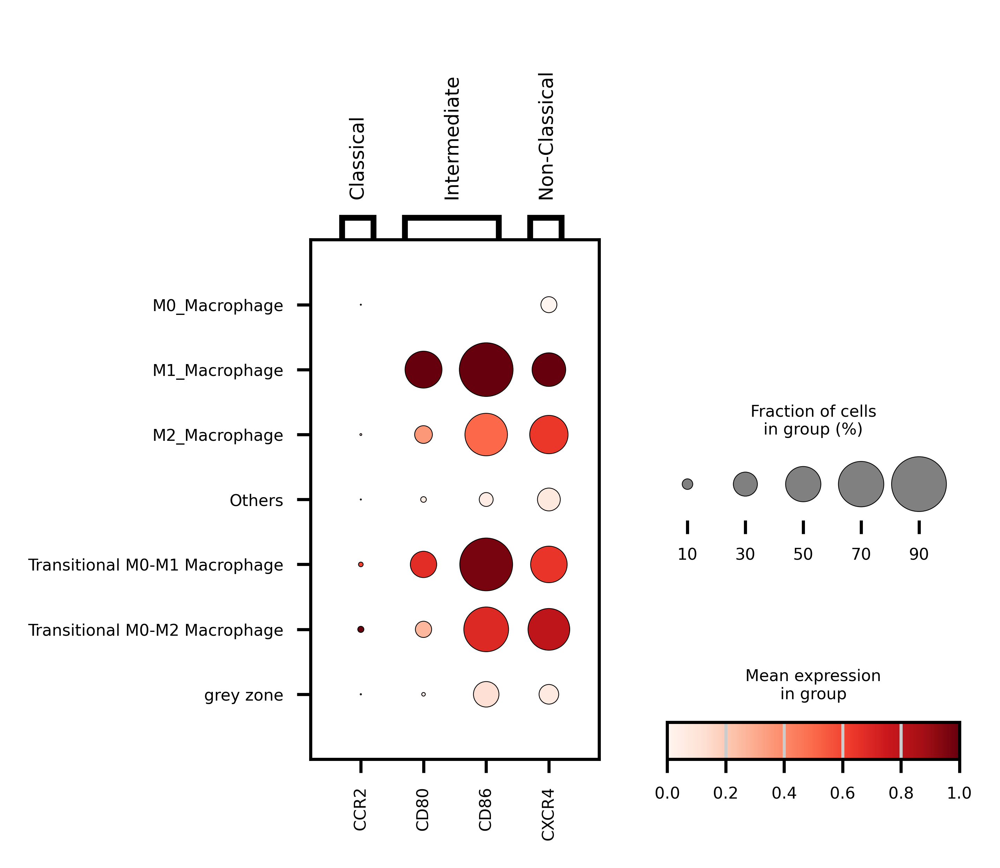

In [819]:
macrophage_markersss = {
    "Classical" : ['CCR2'],
    "Intermediate": ['CD80','CD86'],
    "Non-Classical": ['CXCR4']
}
import numpy as np

# 유전자 리스트에서 Macro에 없는 유전자 필터링
available_markers = {
    key: [gene for gene in genes if gene in Macro.var_names]
    for key, genes in macrophage_markersss.items()
}

# dotplot 그리기
sc.pl.dotplot(Macro, available_markers, groupby="transitional_cell_type", standard_scale="var")


In [826]:
import pandas as pd

# 기존 'transitional_cell_type' 값을 'final_cell_type'으로 복사
Macro.obs['final_cell_type'] = Macro.obs['transitional_cell_type'].copy()

# 'final_cell_type'을 Categorical로 변환하고 새로운 카테고리 추가
Macro.obs['final_cell_type'] = Macro.obs['final_cell_type'].astype('category')
new_categories = ['Classical Macrophage', 'Intermediate Macrophage', 'Non-Classical Macrophage']
Macro.obs['final_cell_type'] = Macro.obs['final_cell_type'].cat.add_categories(new_categories)

# 조건 1: 'Transitional M0-M1 Macrophage' 이면서 CCR2 발현
condition1 = (Macro.obs['transitional_cell_type'] == 'Transitional M0-M1 Macrophage') & \
             (Macro[:, 'CCR2'].X.flatten() > 0)
Macro.obs.loc[condition1, 'final_cell_type'] = 'Classical Macrophage'

# 조건 2: 'Transitional M0-M1 Macrophage' 이면서 CD80 또는 CD86 발현
condition2 = (Macro.obs['transitional_cell_type'] == 'Transitional M0-M1 Macrophage') & \
             ((Macro[:, 'CD80'].X.flatten() > 0) | (Macro[:, 'CD86'].X.flatten() > 0))
Macro.obs.loc[condition2, 'final_cell_type'] = 'Intermediate Macrophage'

# 조건 3: 'Transitional M0-M2 Macrophage' 이면서 CXCR1 또는 CXCR4 발현
condition3 = (Macro.obs['transitional_cell_type'] == 'Transitional M0-M2 Macrophage') & \
             ((Macro[:, 'CXCR1'].X.flatten() > 0) | (Macro[:, 'CXCR4'].X.flatten() > 0))
Macro.obs.loc[condition3, 'final_cell_type'] = 'Non-Classical Macrophage'


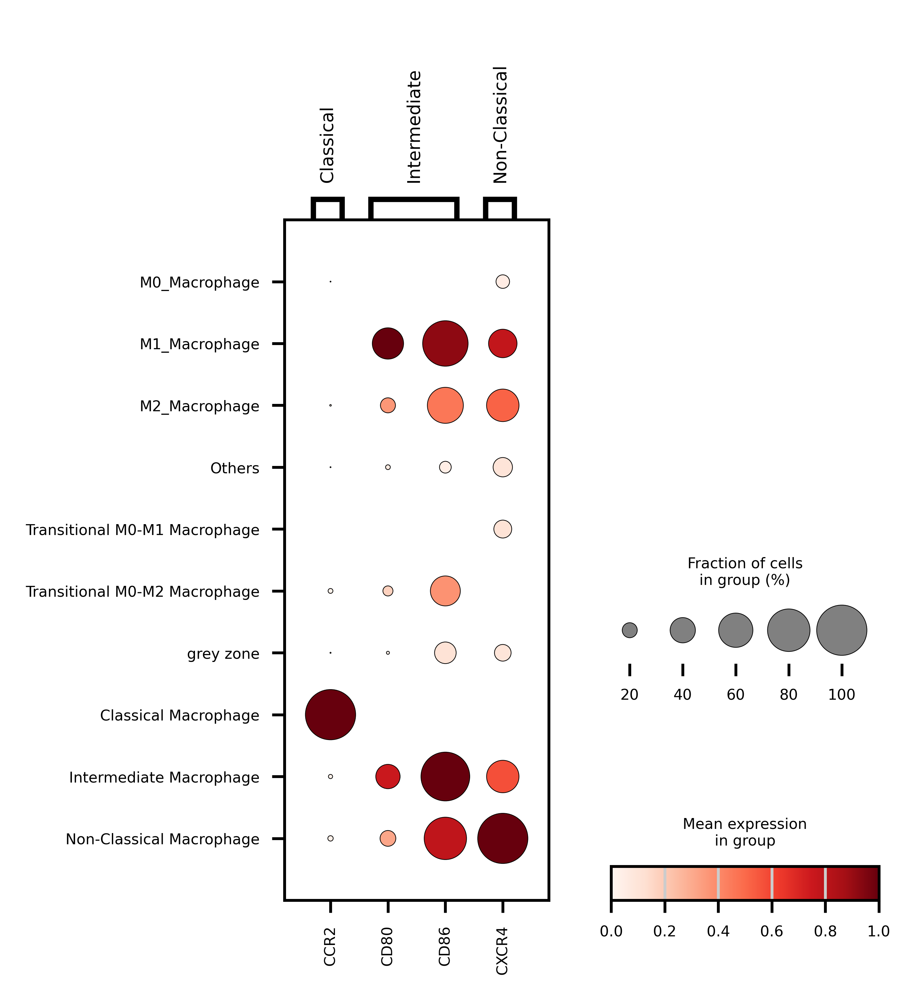

In [827]:
macrophage_markersss = {
    "Classical" : ['CCR2'],
    "Intermediate": ['CD80','CD86'],
    "Non-Classical": ['CXCR4']
}
import numpy as np

# 유전자 리스트에서 Macro에 없는 유전자 필터링
available_markers = {
    key: [gene for gene in genes if gene in Macro.var_names]
    for key, genes in macrophage_markersss.items()
}

# dotplot 그리기
sc.pl.dotplot(Macro, available_markers, groupby="final_cell_type", standard_scale="var")


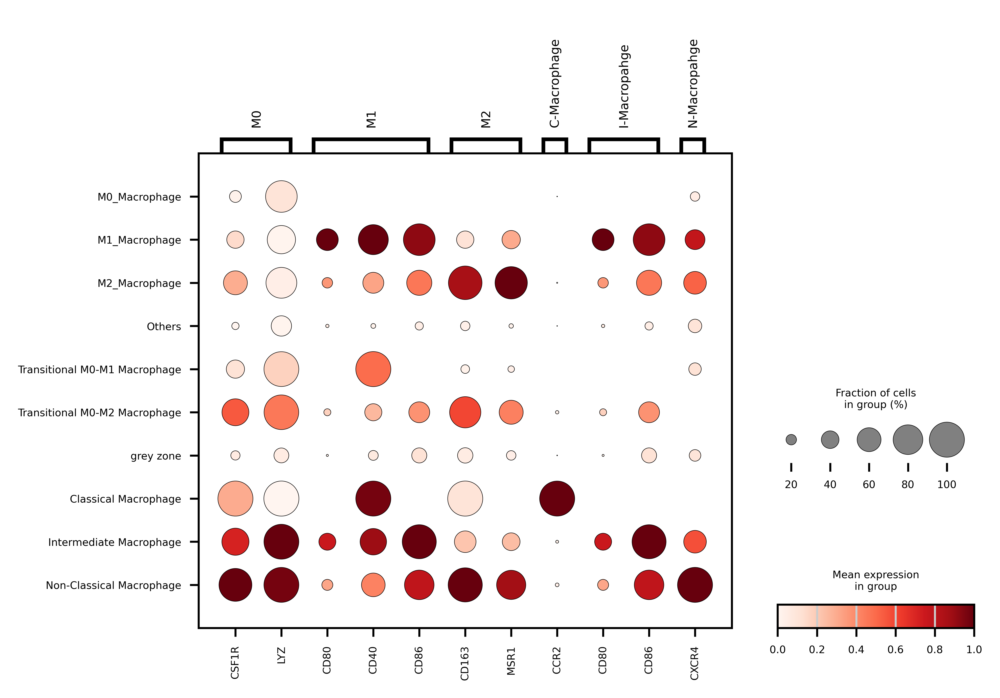

In [832]:
macrophage_markerss = {
    "M0": ['CSF1R', 'LYZ'],
    "M1": ['CD80','CD40','CD86'],
    "M2": ['CD163','MSR1'],
    "C-Macrophage" : ['CCR2'],
    "I-Macropahge": ['CD80','CD86'],
    "N-Macropahge": ['CXCR4']
}
sc.pl.dotplot(Macro, macrophage_markerss, groupby="final_cell_type", standard_scale="var")

In [830]:
Macro.obs['final_cell_type'].value_counts()

final_cell_type
Non-Classical Macrophage         1175
Intermediate Macrophage           846
Transitional M0-M2 Macrophage     700
Others                            575
M0_Macrophage                     402
grey zone                         336
M2_Macrophage                     195
Transitional M0-M1 Macrophage     103
M1_Macrophage                      64
Classical Macrophage                1
Name: count, dtype: int64

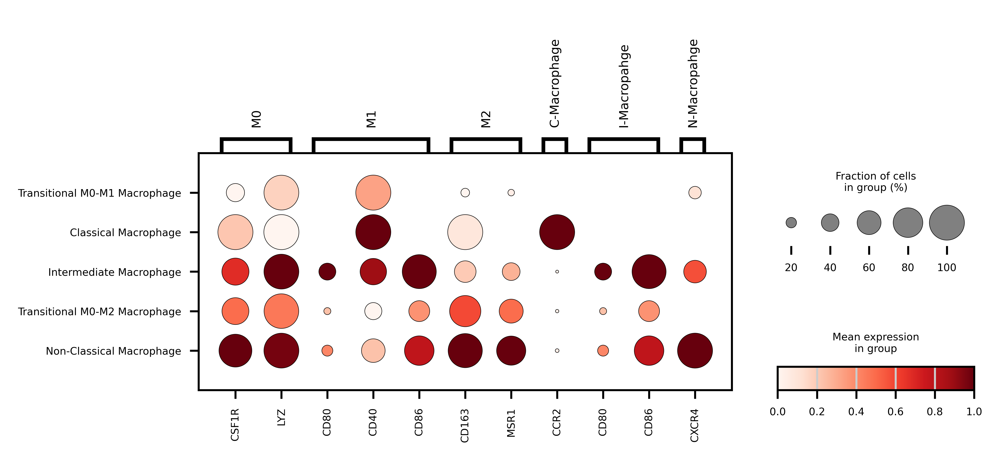

In [839]:
import pandas as pd
import scanpy as sc

# 2️⃣ Dotplot에 dendrogram 추가
macrophage_markerss = {
    "M0": ['CSF1R', 'LYZ'],
    "M1": ['CD80','CD40','CD86'],
    "M2": ['CD163','MSR1'],
    "C-Macrophage" : ['CCR2'],
    "I-Macropahge": ['CD80','CD86'],
    "N-Macropahge": ['CXCR4']
}

# 'final_cell_type'을 기반으로 dendrogram 생성
sc.tl.dendrogram(Macro, groupby="final_cell_type")

# Dotplot 시각화 + dendrogram 추가
sc.pl.dotplot(Macro, macrophage_markerss, groupby="final_cell_type", standard_scale="var")


PCC: 0.035, p-value: 8.524e-01


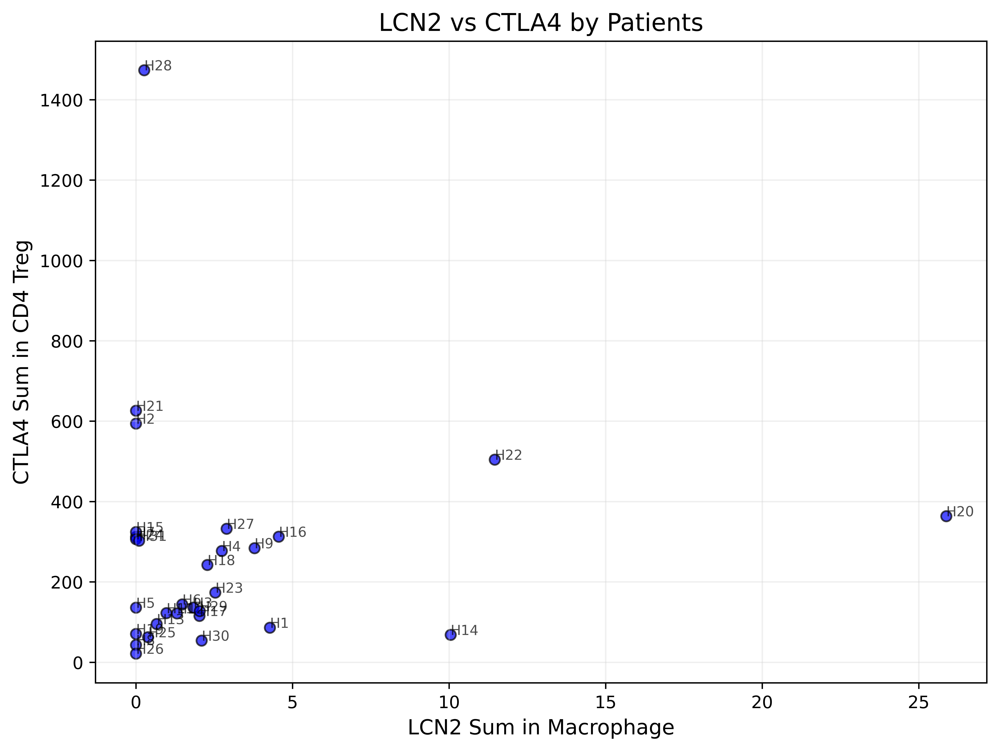

In [796]:
from scipy.stats import pearsonr
import pandas as pd
import matplotlib.pyplot as plt

# 1. Macrophage의 LCN2 발현량 합 계산 (X축)
macrophage_lcn2 = (
    myeadata[myeadata.obs['cell_type'] == 'Macrophages']
    .to_df()['LCN2']
    .groupby(myeadata[myeadata.obs['cell_type'] == 'Macrophages'].obs['patients'])
    .sum()
)

# 2. CD4 Treg의 CTLA4 발현량 합 계산 (Y축)
cd4_treg_ctla4 = (
    adata[adata.obs['Annotation_total_Tsub'] == 'CD4 Treg']
    .to_df()['CTLA4']
    .groupby(adata[adata.obs['Annotation_total_Tsub'] == 'CD4 Treg'].obs['patients'])
    .sum()
)

# 3. 두 데이터 병합 (공통된 patients 기준)
plot_data = pd.DataFrame({'LCN2_sum': macrophage_lcn2, 'CTLA4_sum': cd4_treg_ctla4}).dropna()

# 4. Pearson Correlation Coefficient와 p-value 계산
if not plot_data.empty:
    pcc, p_value = pearsonr(plot_data['LCN2_sum'], plot_data['CTLA4_sum'])
    print(f"PCC: {pcc:.3f}, p-value: {p_value:.3e}")
else:
    print("No data available for correlation calculation.")

# 5. 산점도 그리기
plt.figure(figsize=(8, 6))
plt.scatter(plot_data['LCN2_sum'], plot_data['CTLA4_sum'], c='blue', alpha=0.7, edgecolors='k')
plt.xlabel('LCN2 Sum in Macrophage', fontsize=12)
plt.ylabel('CTLA4 Sum in CD4 Treg', fontsize=12)
plt.title('LCN2 vs CTLA4 by Patients', fontsize=14)
plt.grid(alpha=0.3)
for patient, (x, y) in plot_data.iterrows():
    plt.text(x, y, patient, fontsize=8, alpha=0.7)  # Add patient labels to the dots
plt.tight_layout()
plt.show()


In [799]:
from scipy.stats import pearsonr
import pandas as pd

# 1. Macrophage의 LCN2 발현량 합 계산 (X축)
macrophage_lcn2 = (
    myeadata[myeadata.obs['cell_type'] == 'Macrophages']
    .to_df()['LCN2']
    .groupby(myeadata[myeadata.obs['cell_type'] == 'Macrophages'].obs['patients'])
    .sum()
)

# 2. cell_type 별 CTLA4 합 계산 및 상관계수 출력
results = []

for cell_type in adata.obs['Annotation_total_Tsub'].unique():
    # cell_type 기준으로 CTLA4 합 계산
    cell_ctla4 = (
        adata[adata.obs['Annotation_total_Tsub'] == cell_type]
        .to_df()['CTLA4']
        .groupby(adata[adata.obs['Annotation_total_Tsub'] == cell_type].obs['patients'])
        .sum()
    )
    
    # LCN2 합과 병합
    merged_data = pd.DataFrame({'LCN2_sum': macrophage_lcn2, 'CTLA4_sum': cell_ctla4}).dropna()
    
    # 병합된 데이터 크기 확인
    if len(merged_data) < 2:
        print(f"Cell Type: {cell_type}, Not enough data for correlation calculation (n < 2).")
        results.append({'Cell Type': cell_type, 'PCC': None, 'p-value': None})
        continue

    # 상관계수 계산
    pcc, p_value = pearsonr(merged_data['LCN2_sum'], merged_data['CTLA4_sum'])
    results.append({'Cell Type': cell_type, 'PCC': pcc, 'p-value': p_value})
    print(f"Cell Type: {cell_type}, PCC: {pcc:.3f}, p-value: {p_value:.3e}")

# 3. 결과를 DataFrame으로 저장
results_df = pd.DataFrame(results)

# 4. 결과 출력
print("\nResults Summary:")
print(results_df)


Cell Type: CD19B, PCC: 0.257, p-value: 1.706e-01
Cell Type: plasmaB, PCC: 0.182, p-value: 3.365e-01
Cell Type: Myeloid, PCC: -0.005, p-value: 9.775e-01
Cell Type: Unknown, PCC: 0.240, p-value: 2.009e-01
Cell Type: Epithelial, PCC: 0.202, p-value: 2.834e-01
Cell Type: CD4 Tfh, PCC: 0.357, p-value: 5.265e-02
Cell Type: Fibroblasts, PCC: -0.130, p-value: 4.938e-01
Cell Type: Cycling cells, PCC: 0.060, p-value: 7.510e-01
Cell Type: CD4 Tnaive, PCC: -0.013, p-value: 9.446e-01
Cell Type: Mast, PCC: -0.135, p-value: 4.753e-01
Cell Type: CD8 Trm, PCC: 0.132, p-value: 4.877e-01
Cell Type: CD4 Treg, PCC: 0.035, p-value: 8.524e-01
Cell Type: CD4 Th17, PCC: 0.225, p-value: 2.327e-01
Cell Type: CD8 MAIT, PCC: 0.029, p-value: 8.805e-01
Cell Type: CD4 Tcm, PCC: 0.042, p-value: 8.267e-01
Cell Type: NK, PCC: 0.104, p-value: 5.846e-01
Cell Type: CD8 Tem, PCC: -0.069, p-value: 7.155e-01
Cell Type: Unused, PCC: -0.064, p-value: 7.364e-01
Cell Type: Endothelial, PCC: -0.040, p-value: 8.329e-01
Cell Type: C